In [1]:
import pandas as pd
import numpy as np
from fbprophet import Prophet
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.metrics as metrics
from sklearn.model_selection import TimeSeriesSplit
import warnings
warnings.simplefilter('ignore')
plt.style.use("fivethirtyeight")

C:\Users\AP hatela\Miniconda\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
import sklearn.metrics as metrics
def results(y_true, y_pred):
    # Regression metrics
    explained_variance=metrics.explained_variance_score(y_true, y_pred)
    mean_absolute_error=metrics.mean_absolute_error(y_true, y_pred) 
    mse=metrics.mean_squared_error(y_true, y_pred)
    mean_squared_log_error=metrics.mean_squared_log_error(abs(y_true), abs(y_pred))
    median_absolute_error=metrics.median_absolute_error(y_true, y_pred)
    r2=metrics.r2_score(y_true, y_pred)
    print('explained_variance: ', round(explained_variance,4))    
    print('r2: ', round(r2,4))
    print('MAE: ', round(mean_absolute_error,4))
    print('MSE: ', round(mse,4))
    print('RMSE: ', round(np.sqrt(mse),4))
    print('RMSLE: ', round(np.sqrt(mean_squared_log_error),4))

In [3]:
df = pd.read_csv('prophet_ts_data.csv')
df.head()

,Invoice_DateTime,Revenue
0,2012-04-02,2525.442000
1,2012-04-03,3455.840652
2,2012-04-04,2958.108205
3,2012-04-05,4157.551163
4,2012-04-06,5010.062245


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1674 entries, 0 to 1673
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Invoice_DateTime  1674 non-null   object 
 1   Revenue           1674 non-null   float64
dtypes: float64(1), object(1)
memory usage: 26.3+ KB


In [5]:
df['Invoice_DateTime'] = pd.to_datetime(df['Invoice_DateTime'])

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1674 entries, 0 to 1673
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Invoice_DateTime  1674 non-null   datetime64[ns]
 1   Revenue           1674 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 26.3 KB


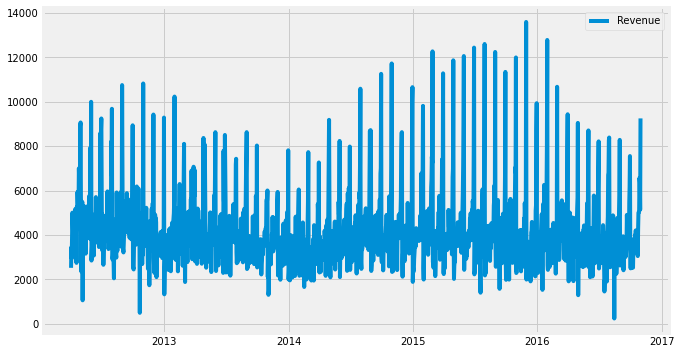

In [7]:
# All data analysis
plt.figure(figsize=(10,6))
plt.plot(df.set_index('Invoice_DateTime'))
plt.legend(['Revenue'])

From analysing all data together, there is no clear understanding of seasonality and other insights, so let's go little deeper.

DatetimeIndex(['2012-04-30', '2012-07-31', '2012-10-31', '2013-01-31',
               '2013-04-30', '2013-07-31', '2013-10-31', '2014-01-31',
               '2014-04-30', '2014-07-31', '2014-10-31', '2015-01-31',
               '2015-04-30', '2015-07-31', '2015-10-31', '2016-01-31',
               '2016-04-30', '2016-07-31', '2016-10-31'],
              dtype='datetime64[ns]', freq='3M') 

1 ] Quarterly Graph from 2012-04-30 00:00:00 to 2012-07-31 00:00:00


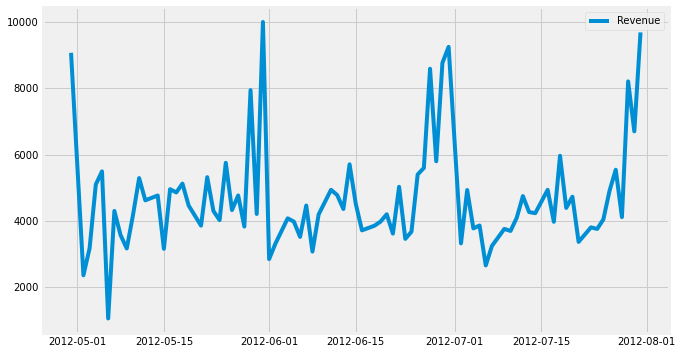

----------------------------------------------------------------------
2 ] Quarterly Graph from 2012-07-31 00:00:00 to 2012-10-31 00:00:00


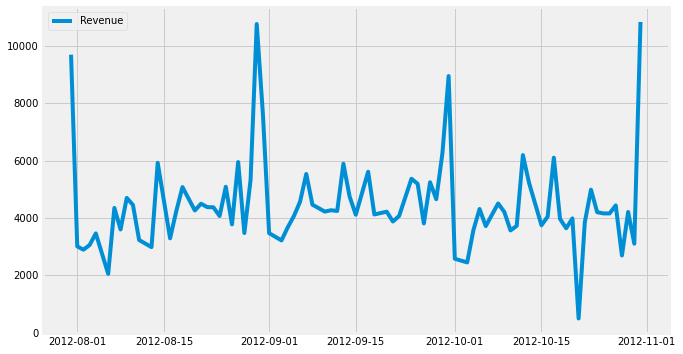

----------------------------------------------------------------------
3 ] Quarterly Graph from 2012-10-31 00:00:00 to 2013-01-31 00:00:00


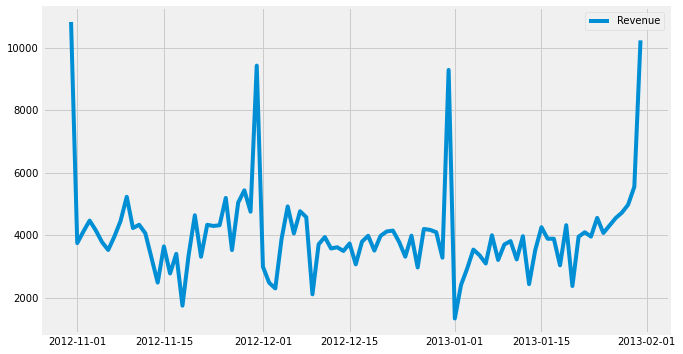

----------------------------------------------------------------------
4 ] Quarterly Graph from 2013-01-31 00:00:00 to 2013-04-30 00:00:00


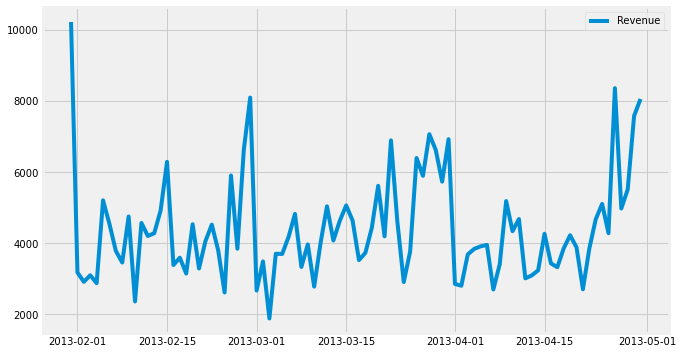

----------------------------------------------------------------------
5 ] Quarterly Graph from 2013-04-30 00:00:00 to 2013-07-31 00:00:00


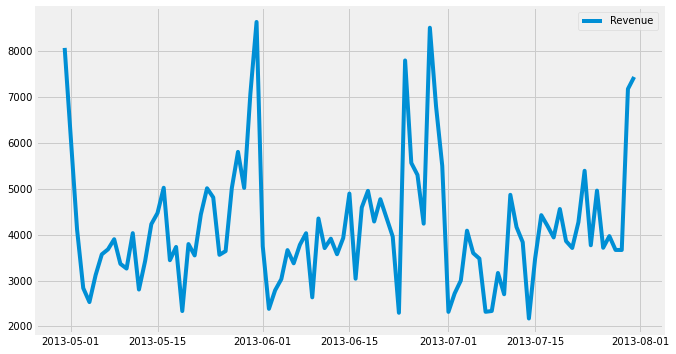

----------------------------------------------------------------------
6 ] Quarterly Graph from 2013-07-31 00:00:00 to 2013-10-31 00:00:00


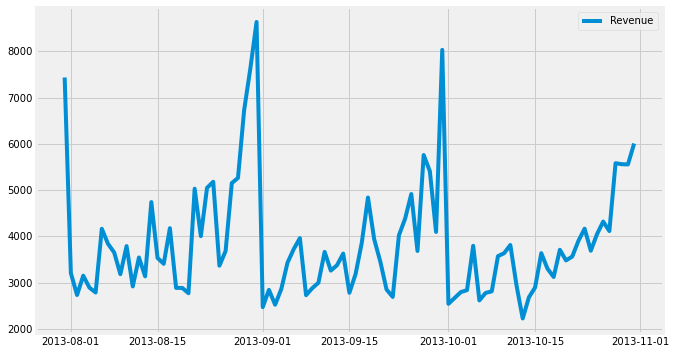

----------------------------------------------------------------------
7 ] Quarterly Graph from 2013-10-31 00:00:00 to 2014-01-31 00:00:00


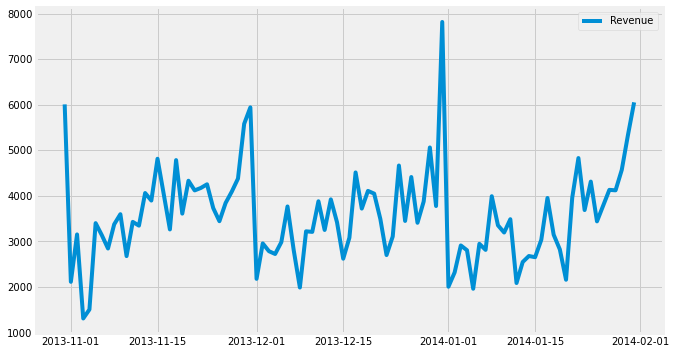

----------------------------------------------------------------------
8 ] Quarterly Graph from 2014-01-31 00:00:00 to 2014-04-30 00:00:00


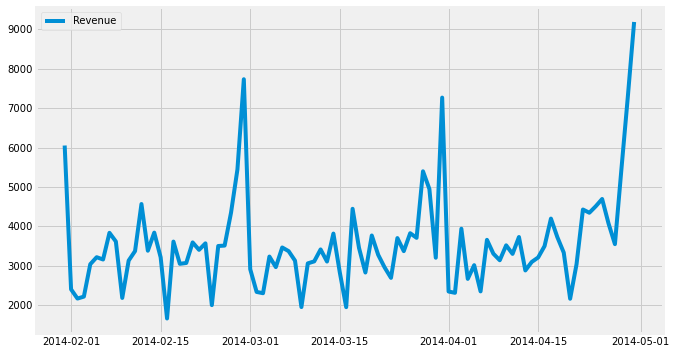

----------------------------------------------------------------------
9 ] Quarterly Graph from 2014-04-30 00:00:00 to 2014-07-31 00:00:00


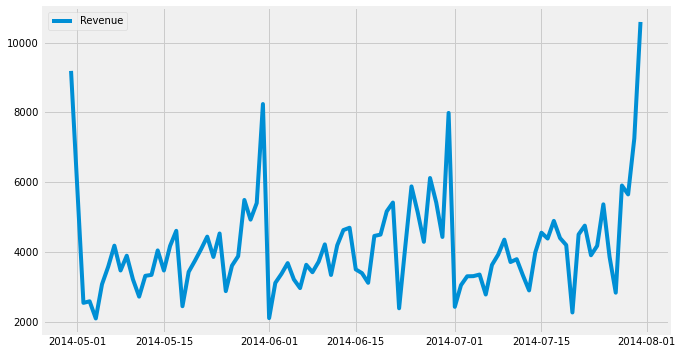

----------------------------------------------------------------------
10 ] Quarterly Graph from 2014-07-31 00:00:00 to 2014-10-31 00:00:00


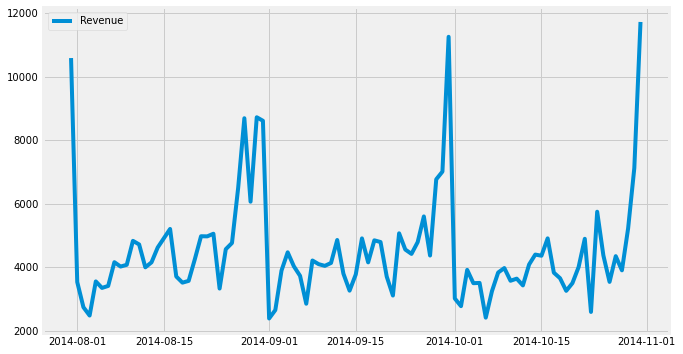

----------------------------------------------------------------------
11 ] Quarterly Graph from 2014-10-31 00:00:00 to 2015-01-31 00:00:00


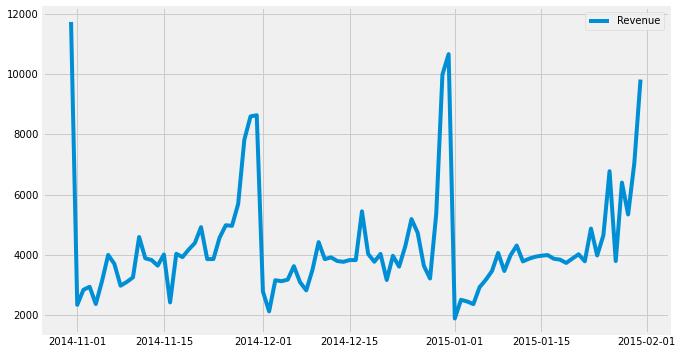

----------------------------------------------------------------------
12 ] Quarterly Graph from 2015-01-31 00:00:00 to 2015-04-30 00:00:00


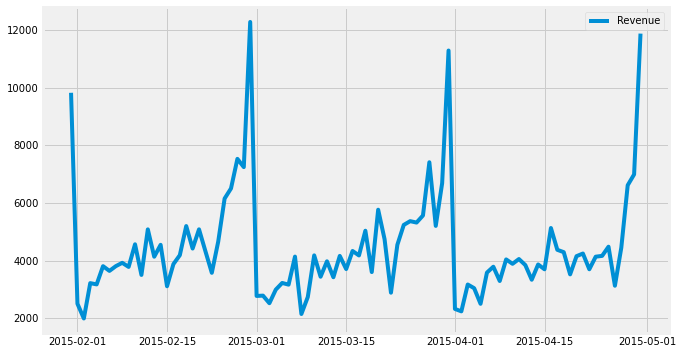

----------------------------------------------------------------------
13 ] Quarterly Graph from 2015-04-30 00:00:00 to 2015-07-31 00:00:00


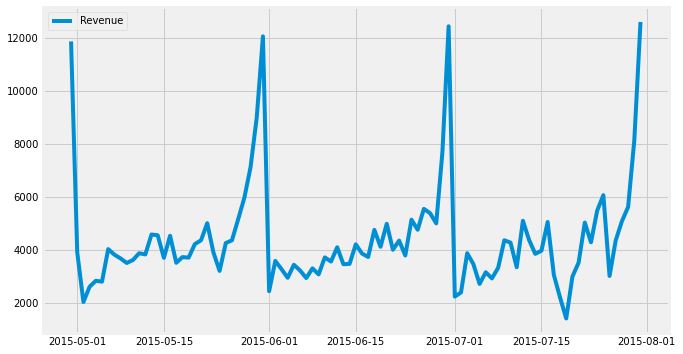

----------------------------------------------------------------------
14 ] Quarterly Graph from 2015-07-31 00:00:00 to 2015-10-31 00:00:00


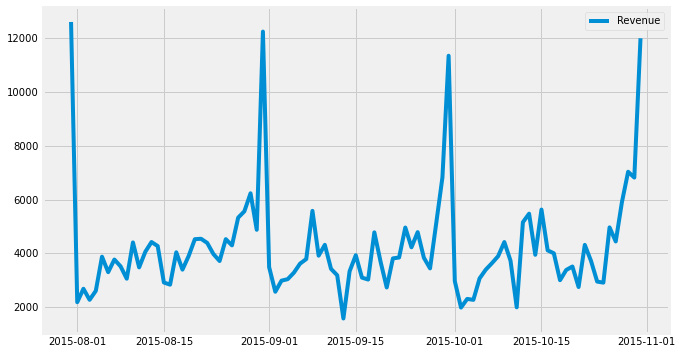

----------------------------------------------------------------------
15 ] Quarterly Graph from 2015-10-31 00:00:00 to 2016-01-31 00:00:00


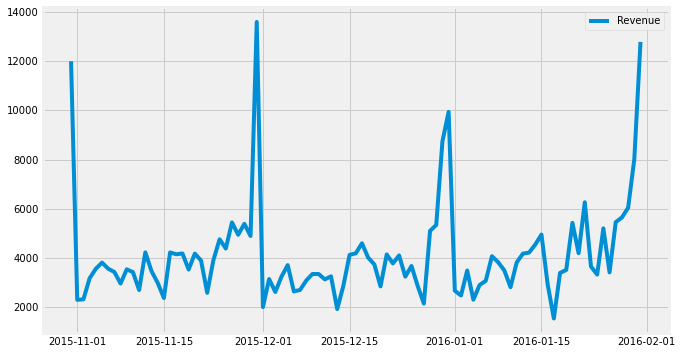

----------------------------------------------------------------------
16 ] Quarterly Graph from 2016-01-31 00:00:00 to 2016-04-30 00:00:00


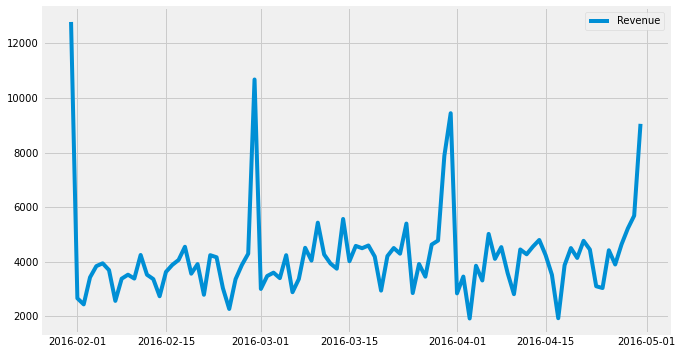

----------------------------------------------------------------------
17 ] Quarterly Graph from 2016-04-30 00:00:00 to 2016-07-31 00:00:00


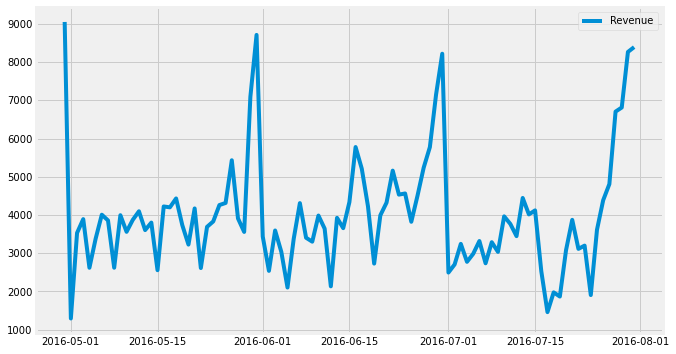

----------------------------------------------------------------------
18 ] Quarterly Graph from 2016-07-31 00:00:00 to 2016-10-31 00:00:00


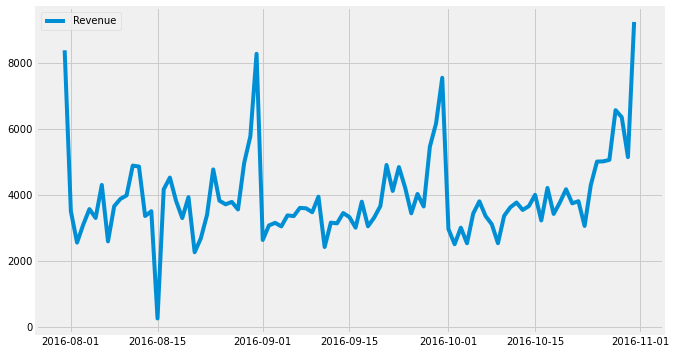

----------------------------------------------------------------------


In [8]:
# Quarterly analysis
interval_3M = pd.date_range('2012-04-01', '2016-11-01', freq='3M')
print(interval_3M,'\n')

for i in range(len(interval_3M)-1):
    print(i+1,'] Quarterly Graph from',interval_3M[i],'to', interval_3M[i+1])
    plt.figure(figsize=(10,6))
    plt.plot(df.set_index('Invoice_DateTime')
             [interval_3M[i]:interval_3M[i+1]])
    plt.legend(['Revenue'])
    #plt.xticks(rotation=45)
    plt.show()
    print('-'*70)

From 18 graphs of Quarterly analysis, there is clear representation of periodicity i.e. graph pattern repeats itself monthly. To understand this pattern, let's go deeper.

DatetimeIndex(['2012-04-30', '2012-05-31', '2012-06-30', '2012-07-31',
               '2012-08-31', '2012-09-30', '2012-10-31', '2012-11-30',
               '2012-12-31', '2013-01-31', '2013-02-28', '2013-03-31',
               '2013-04-30', '2013-05-31', '2013-06-30', '2013-07-31',
               '2013-08-31', '2013-09-30', '2013-10-31', '2013-11-30',
               '2013-12-31', '2014-01-31', '2014-02-28', '2014-03-31',
               '2014-04-30', '2014-05-31', '2014-06-30', '2014-07-31',
               '2014-08-31', '2014-09-30', '2014-10-31', '2014-11-30',
               '2014-12-31', '2015-01-31', '2015-02-28', '2015-03-31',
               '2015-04-30', '2015-05-31', '2015-06-30', '2015-07-31',
               '2015-08-31', '2015-09-30', '2015-10-31', '2015-11-30',
               '2015-12-31', '2016-01-31', '2016-02-29', '2016-03-31',
               '2016-04-30', '2016-05-31', '2016-06-30', '2016-07-31',
               '2016-08-31', '2016-09-30', '2016-10-31'],
              dtype

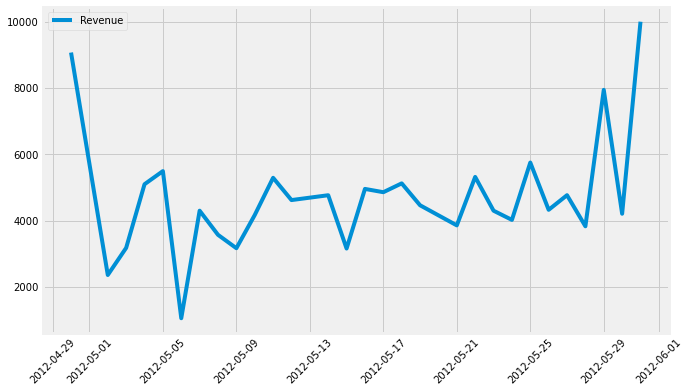

----------------------------------------------------------------------
2 ] Monthly Graph from 2012-05-31 00:00:00 to 2012-06-30 00:00:00


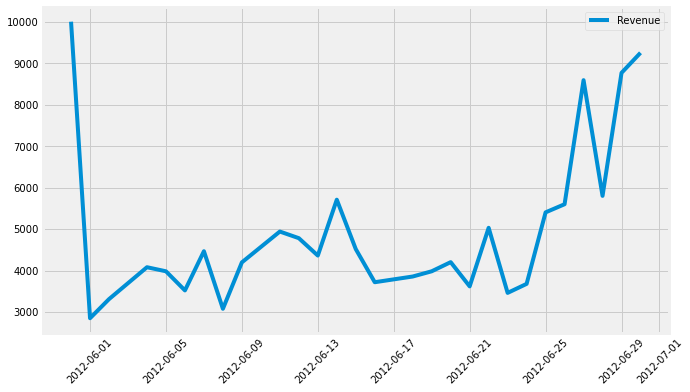

----------------------------------------------------------------------
3 ] Monthly Graph from 2012-06-30 00:00:00 to 2012-07-31 00:00:00


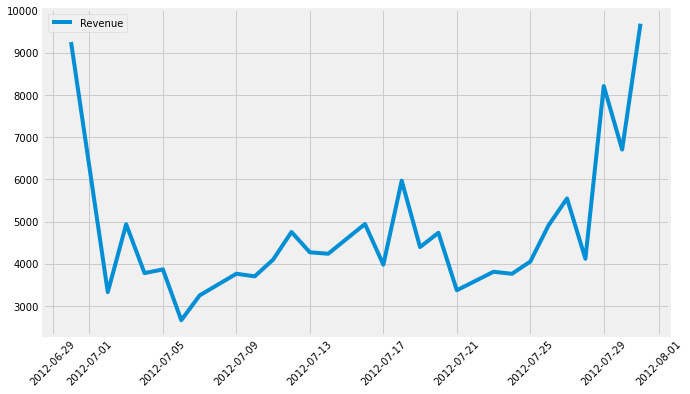

----------------------------------------------------------------------
4 ] Monthly Graph from 2012-07-31 00:00:00 to 2012-08-31 00:00:00


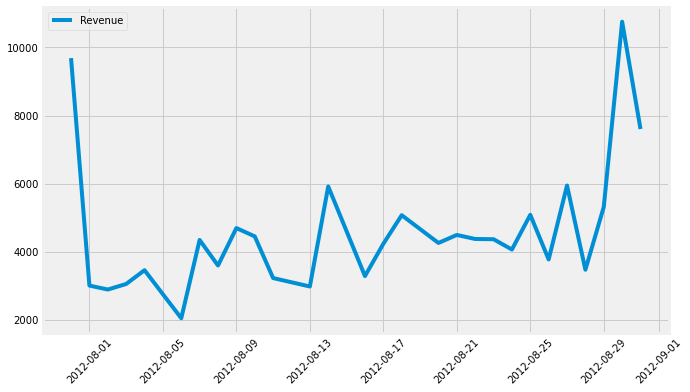

----------------------------------------------------------------------
5 ] Monthly Graph from 2012-08-31 00:00:00 to 2012-09-30 00:00:00


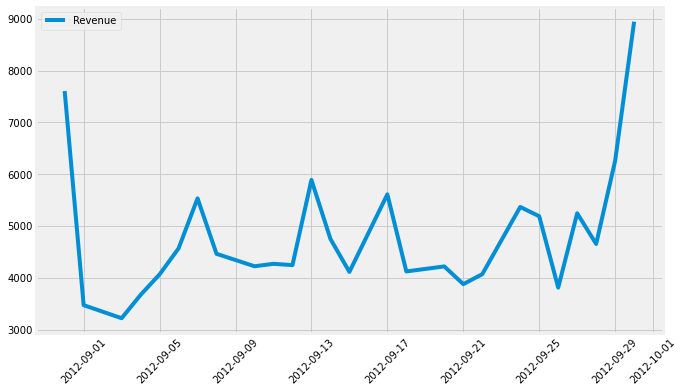

----------------------------------------------------------------------
6 ] Monthly Graph from 2012-09-30 00:00:00 to 2012-10-31 00:00:00


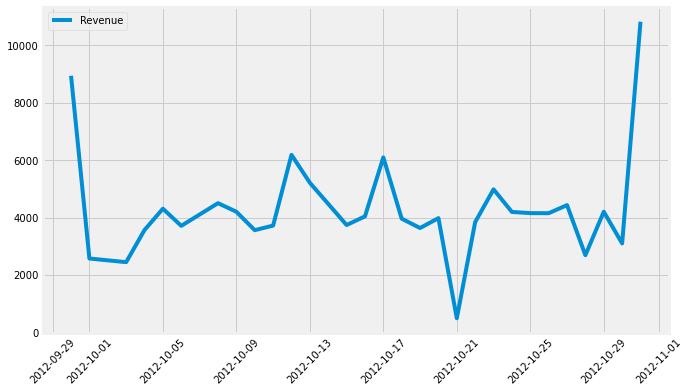

----------------------------------------------------------------------
7 ] Monthly Graph from 2012-10-31 00:00:00 to 2012-11-30 00:00:00


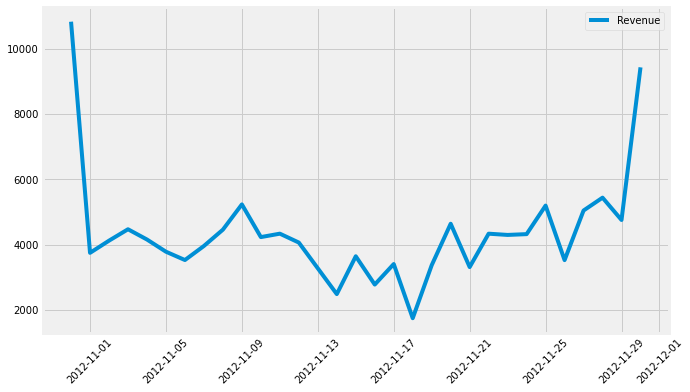

----------------------------------------------------------------------
8 ] Monthly Graph from 2012-11-30 00:00:00 to 2012-12-31 00:00:00


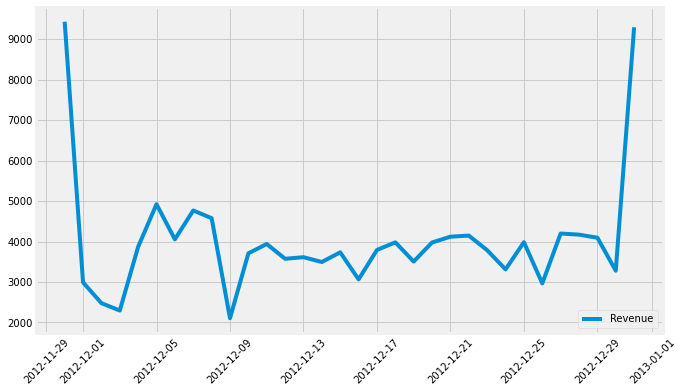

----------------------------------------------------------------------
9 ] Monthly Graph from 2012-12-31 00:00:00 to 2013-01-31 00:00:00


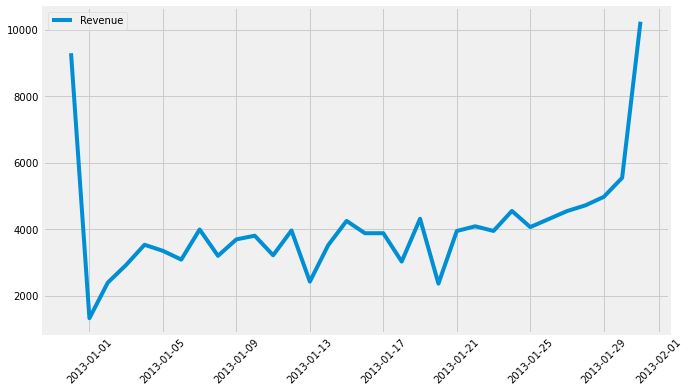

----------------------------------------------------------------------
10 ] Monthly Graph from 2013-01-31 00:00:00 to 2013-02-28 00:00:00


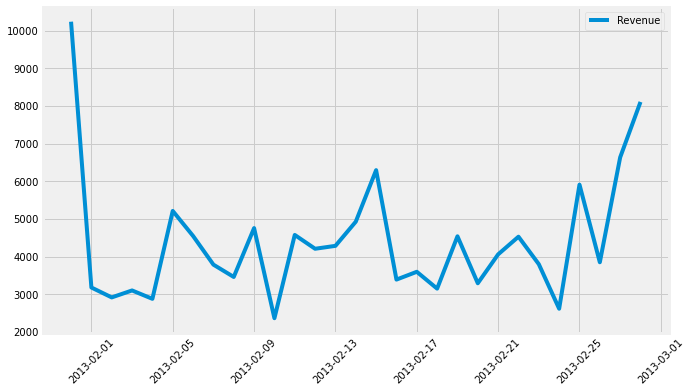

----------------------------------------------------------------------
11 ] Monthly Graph from 2013-02-28 00:00:00 to 2013-03-31 00:00:00


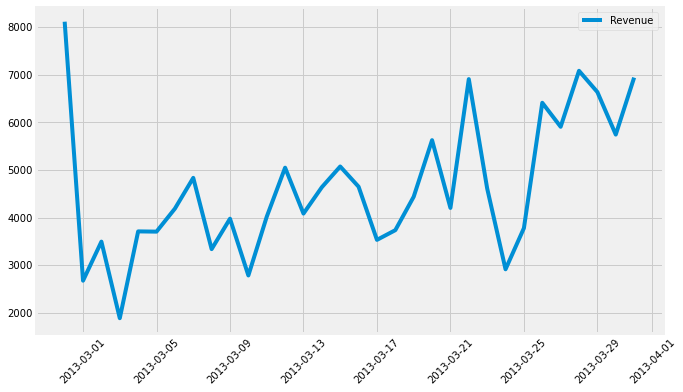

----------------------------------------------------------------------
12 ] Monthly Graph from 2013-03-31 00:00:00 to 2013-04-30 00:00:00


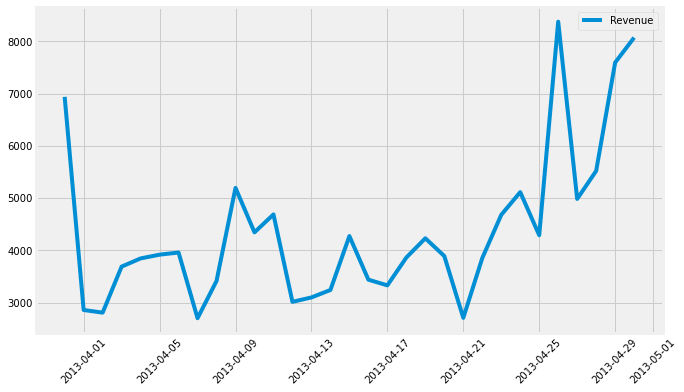

----------------------------------------------------------------------
13 ] Monthly Graph from 2013-04-30 00:00:00 to 2013-05-31 00:00:00


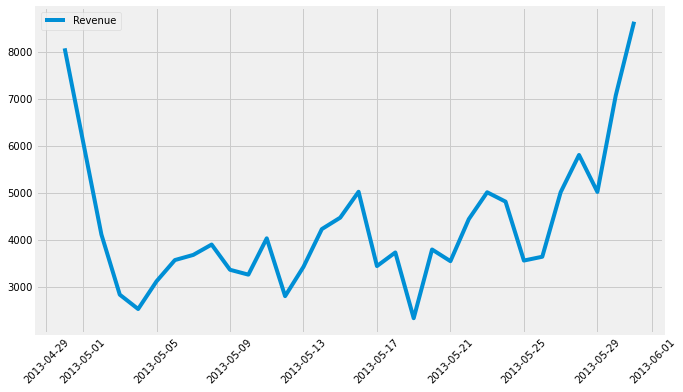

----------------------------------------------------------------------
14 ] Monthly Graph from 2013-05-31 00:00:00 to 2013-06-30 00:00:00


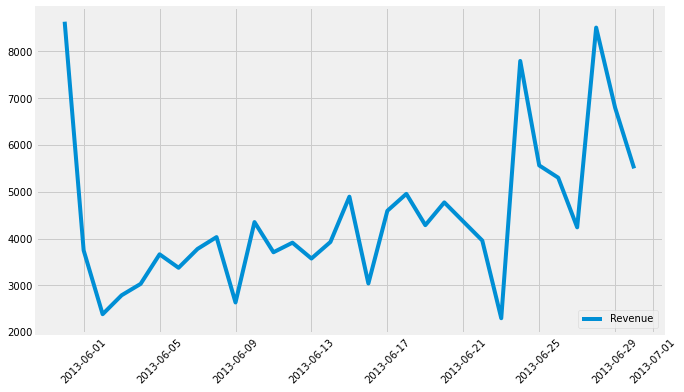

----------------------------------------------------------------------
15 ] Monthly Graph from 2013-06-30 00:00:00 to 2013-07-31 00:00:00


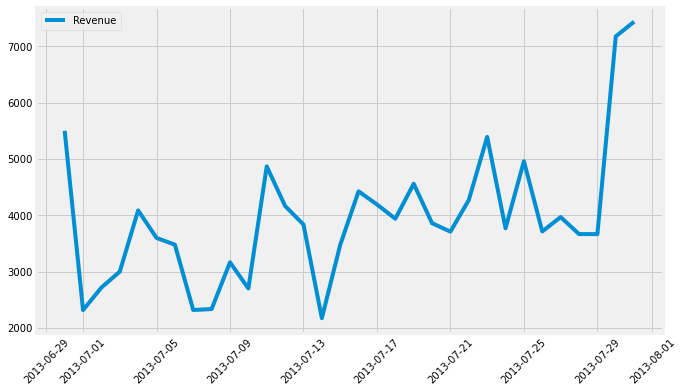

----------------------------------------------------------------------
16 ] Monthly Graph from 2013-07-31 00:00:00 to 2013-08-31 00:00:00


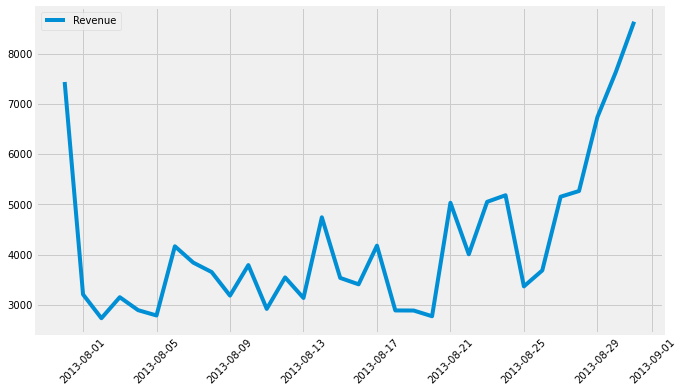

----------------------------------------------------------------------
17 ] Monthly Graph from 2013-08-31 00:00:00 to 2013-09-30 00:00:00


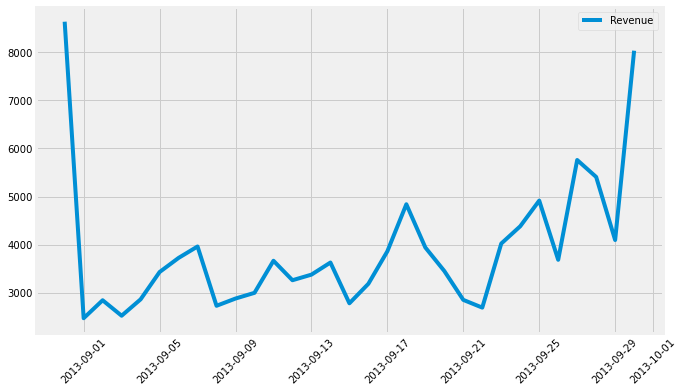

----------------------------------------------------------------------
18 ] Monthly Graph from 2013-09-30 00:00:00 to 2013-10-31 00:00:00


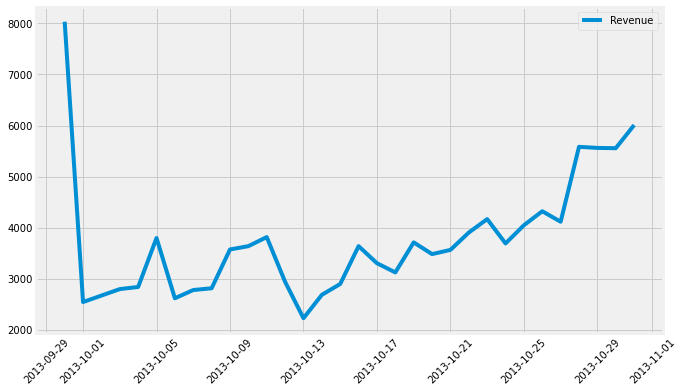

----------------------------------------------------------------------
19 ] Monthly Graph from 2013-10-31 00:00:00 to 2013-11-30 00:00:00


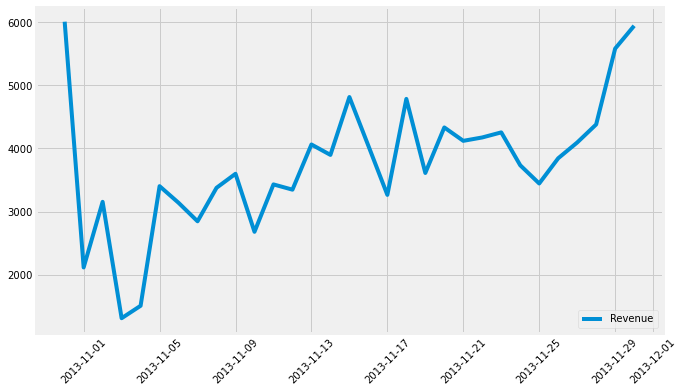

----------------------------------------------------------------------
20 ] Monthly Graph from 2013-11-30 00:00:00 to 2013-12-31 00:00:00


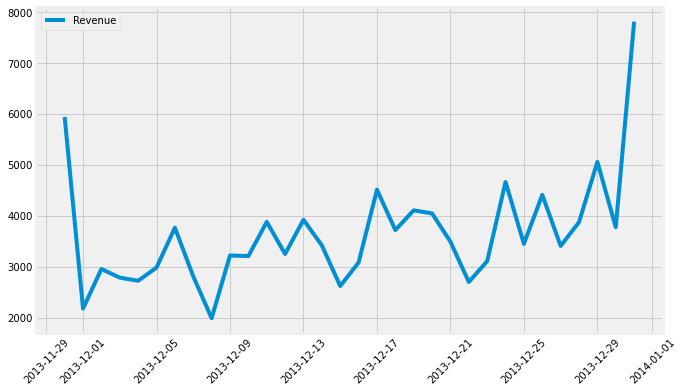

----------------------------------------------------------------------
21 ] Monthly Graph from 2013-12-31 00:00:00 to 2014-01-31 00:00:00


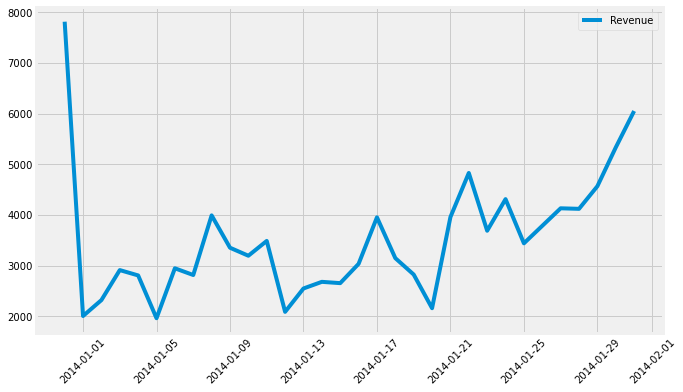

----------------------------------------------------------------------
22 ] Monthly Graph from 2014-01-31 00:00:00 to 2014-02-28 00:00:00


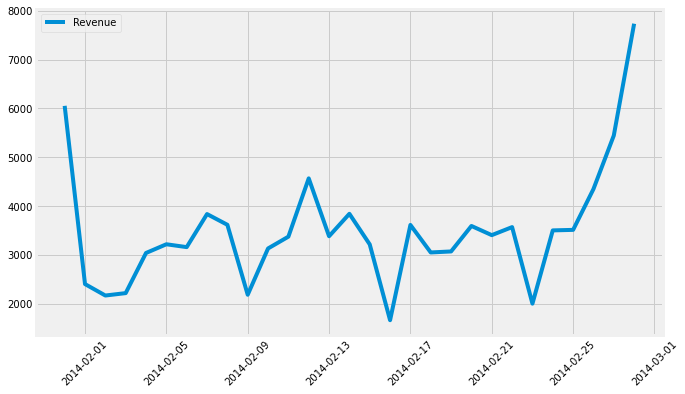

----------------------------------------------------------------------
23 ] Monthly Graph from 2014-02-28 00:00:00 to 2014-03-31 00:00:00


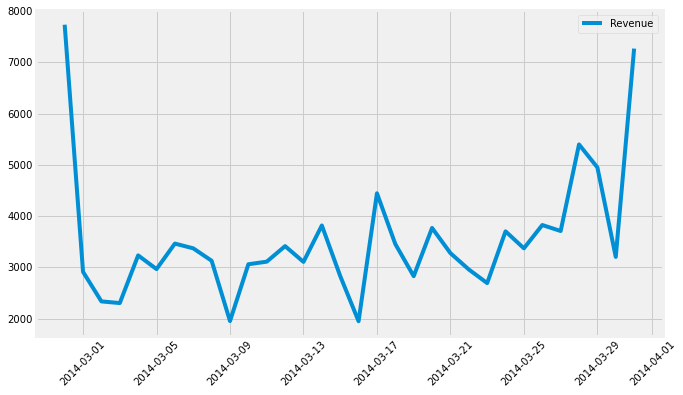

----------------------------------------------------------------------
24 ] Monthly Graph from 2014-03-31 00:00:00 to 2014-04-30 00:00:00


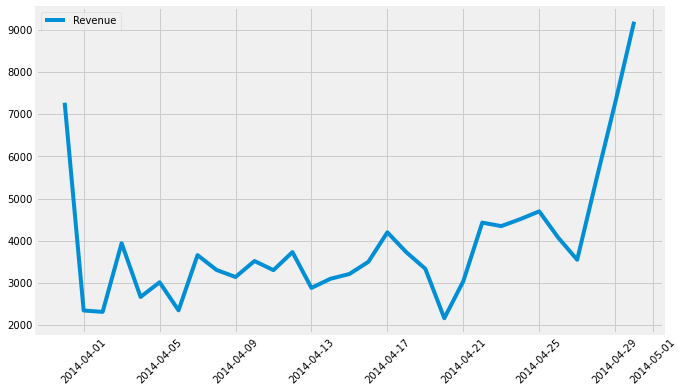

----------------------------------------------------------------------
25 ] Monthly Graph from 2014-04-30 00:00:00 to 2014-05-31 00:00:00


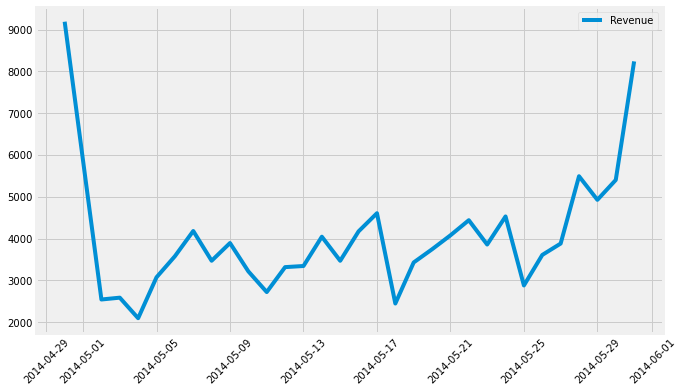

----------------------------------------------------------------------
26 ] Monthly Graph from 2014-05-31 00:00:00 to 2014-06-30 00:00:00


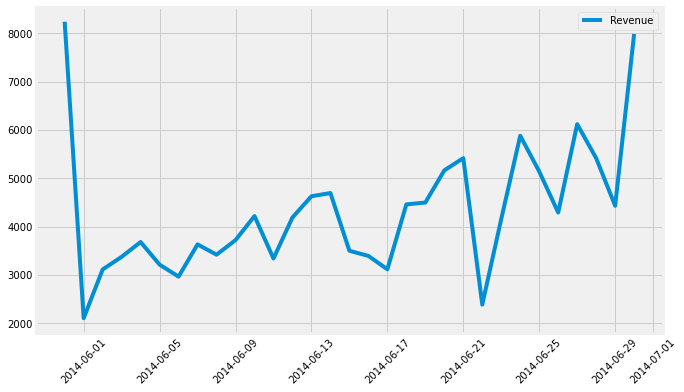

----------------------------------------------------------------------
27 ] Monthly Graph from 2014-06-30 00:00:00 to 2014-07-31 00:00:00


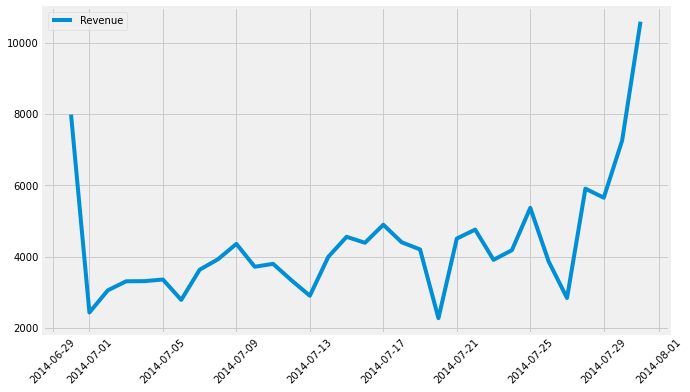

----------------------------------------------------------------------
28 ] Monthly Graph from 2014-07-31 00:00:00 to 2014-08-31 00:00:00


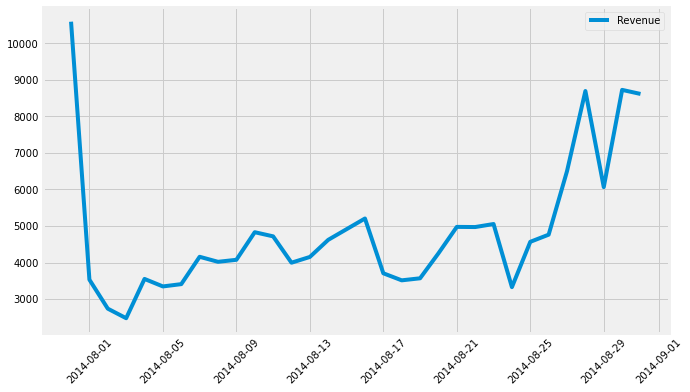

----------------------------------------------------------------------
29 ] Monthly Graph from 2014-08-31 00:00:00 to 2014-09-30 00:00:00


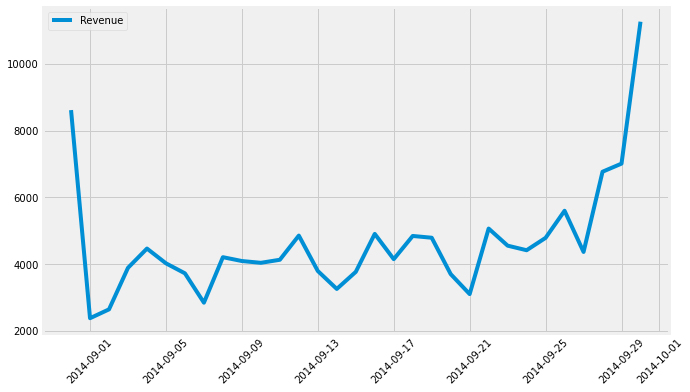

----------------------------------------------------------------------
30 ] Monthly Graph from 2014-09-30 00:00:00 to 2014-10-31 00:00:00


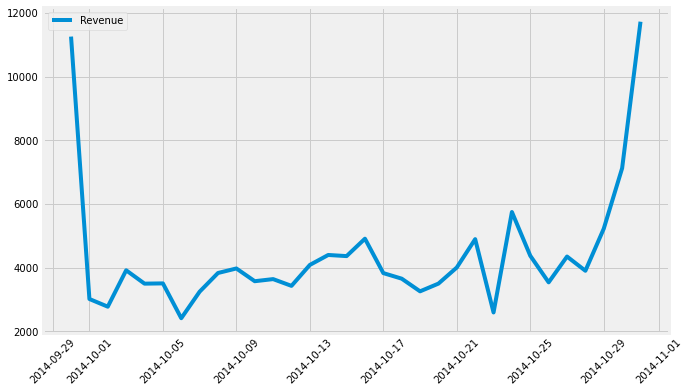

----------------------------------------------------------------------
31 ] Monthly Graph from 2014-10-31 00:00:00 to 2014-11-30 00:00:00


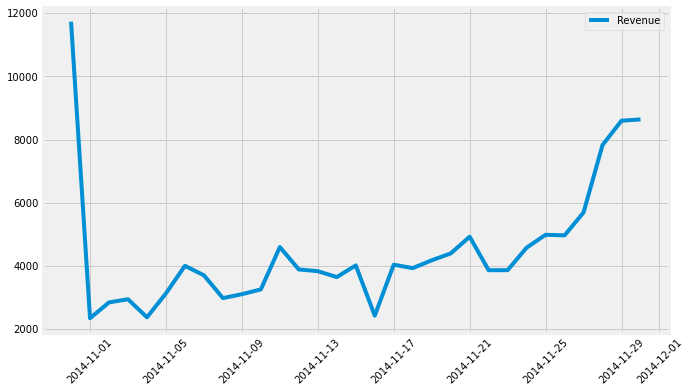

----------------------------------------------------------------------
32 ] Monthly Graph from 2014-11-30 00:00:00 to 2014-12-31 00:00:00


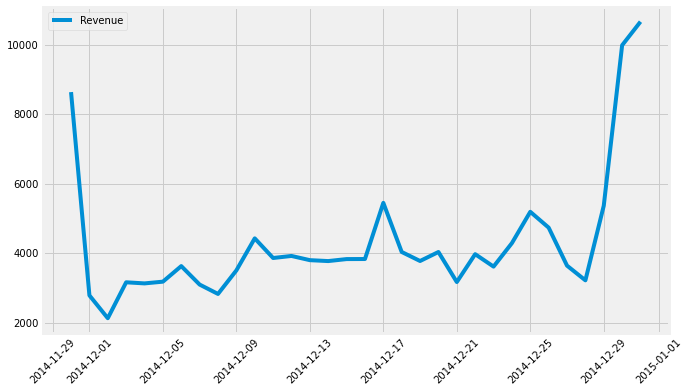

----------------------------------------------------------------------
33 ] Monthly Graph from 2014-12-31 00:00:00 to 2015-01-31 00:00:00


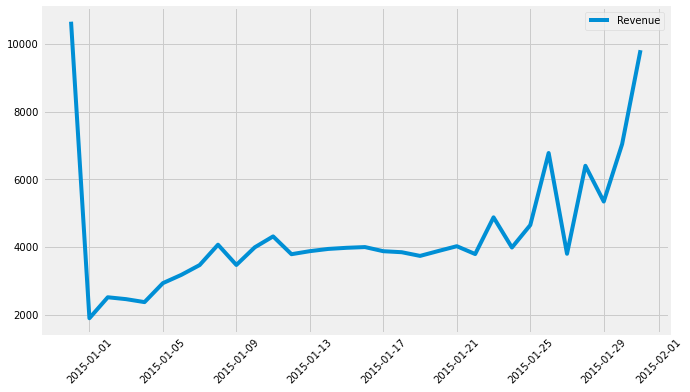

----------------------------------------------------------------------
34 ] Monthly Graph from 2015-01-31 00:00:00 to 2015-02-28 00:00:00


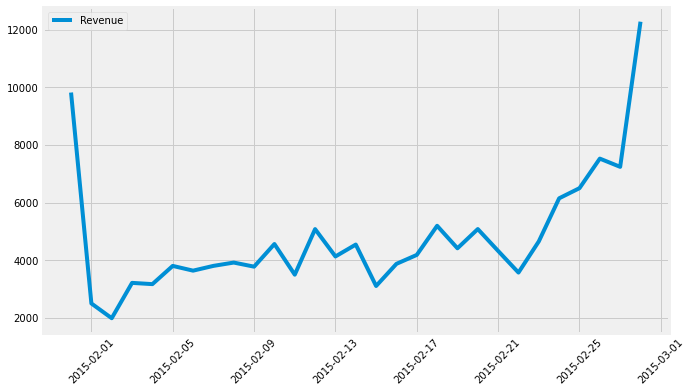

----------------------------------------------------------------------
35 ] Monthly Graph from 2015-02-28 00:00:00 to 2015-03-31 00:00:00


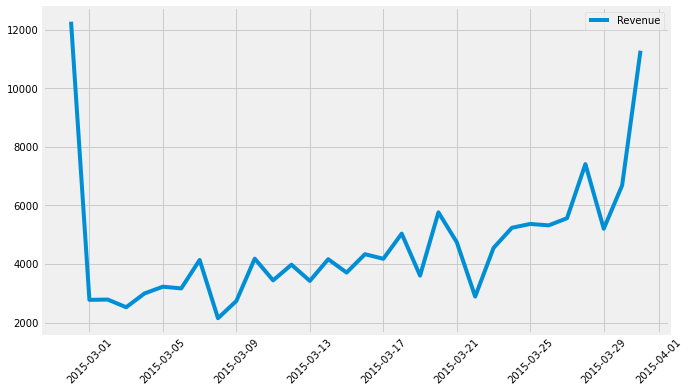

----------------------------------------------------------------------
36 ] Monthly Graph from 2015-03-31 00:00:00 to 2015-04-30 00:00:00


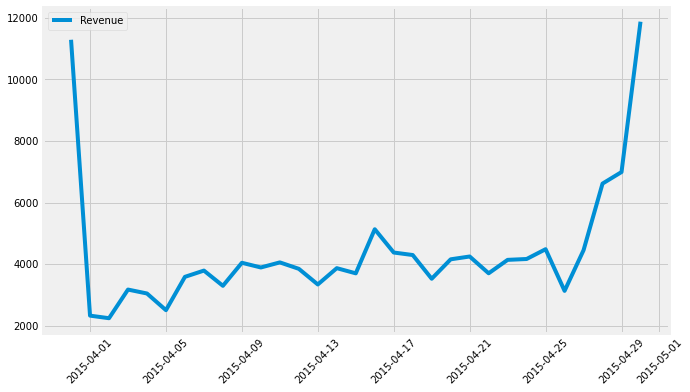

----------------------------------------------------------------------
37 ] Monthly Graph from 2015-04-30 00:00:00 to 2015-05-31 00:00:00


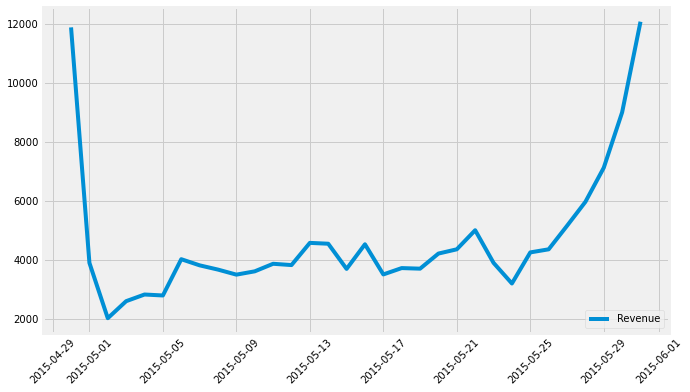

----------------------------------------------------------------------
38 ] Monthly Graph from 2015-05-31 00:00:00 to 2015-06-30 00:00:00


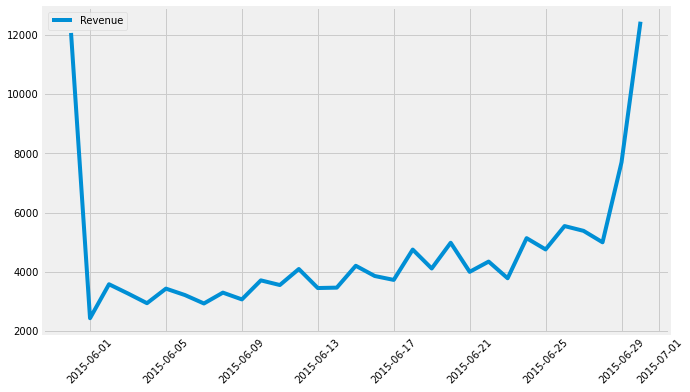

----------------------------------------------------------------------
39 ] Monthly Graph from 2015-06-30 00:00:00 to 2015-07-31 00:00:00


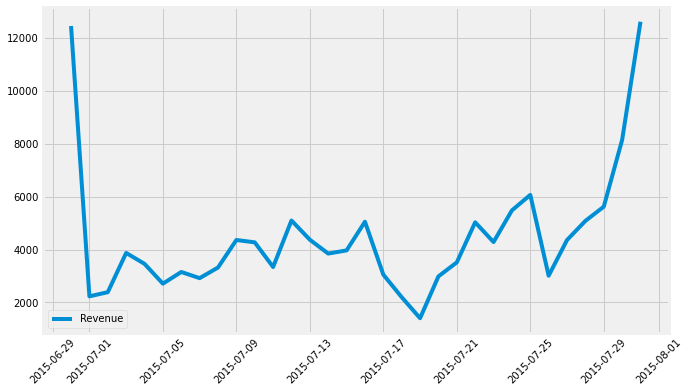

----------------------------------------------------------------------
40 ] Monthly Graph from 2015-07-31 00:00:00 to 2015-08-31 00:00:00


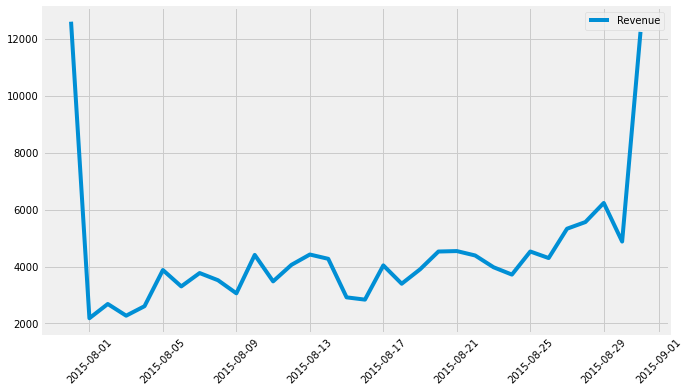

----------------------------------------------------------------------
41 ] Monthly Graph from 2015-08-31 00:00:00 to 2015-09-30 00:00:00


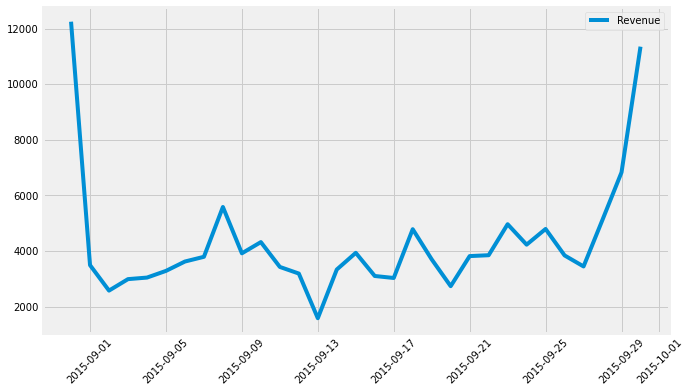

----------------------------------------------------------------------
42 ] Monthly Graph from 2015-09-30 00:00:00 to 2015-10-31 00:00:00


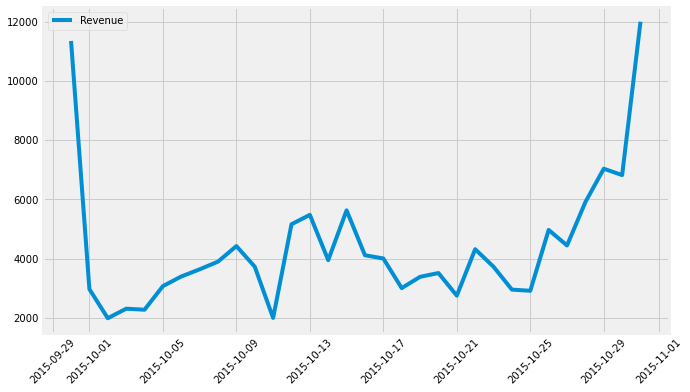

----------------------------------------------------------------------
43 ] Monthly Graph from 2015-10-31 00:00:00 to 2015-11-30 00:00:00


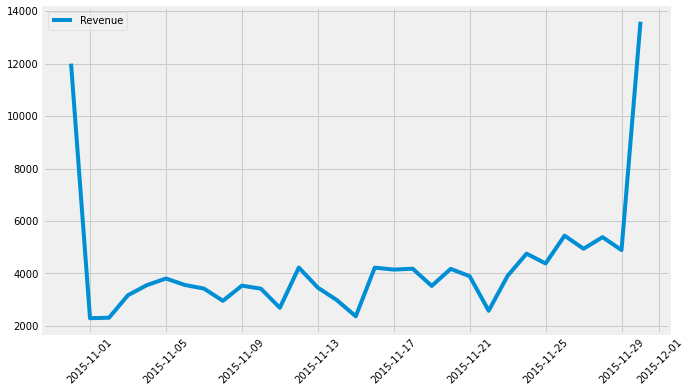

----------------------------------------------------------------------
44 ] Monthly Graph from 2015-11-30 00:00:00 to 2015-12-31 00:00:00


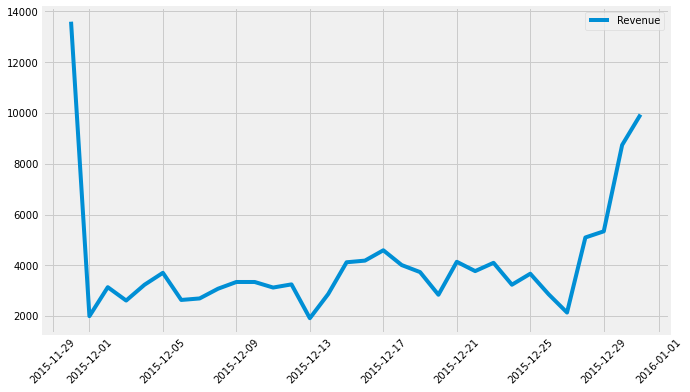

----------------------------------------------------------------------
45 ] Monthly Graph from 2015-12-31 00:00:00 to 2016-01-31 00:00:00


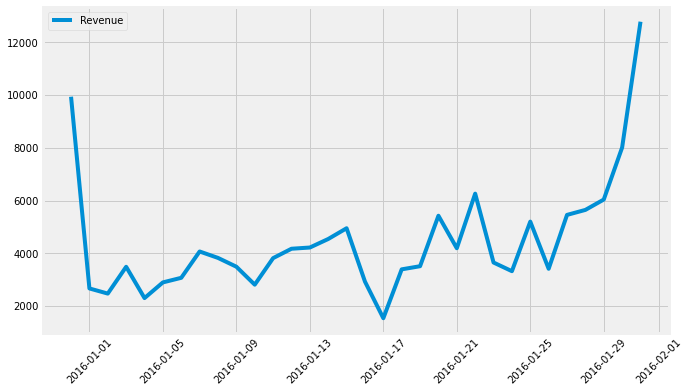

----------------------------------------------------------------------
46 ] Monthly Graph from 2016-01-31 00:00:00 to 2016-02-29 00:00:00


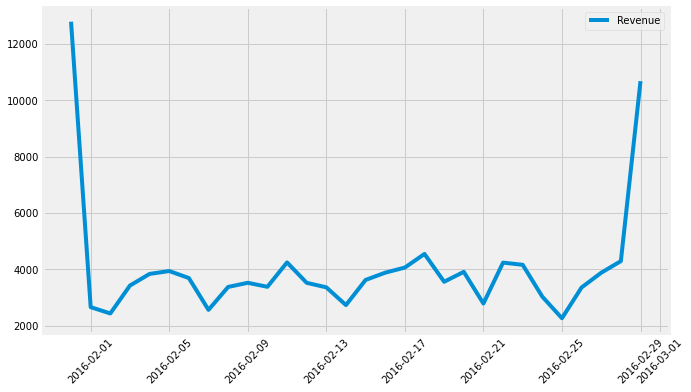

----------------------------------------------------------------------
47 ] Monthly Graph from 2016-02-29 00:00:00 to 2016-03-31 00:00:00


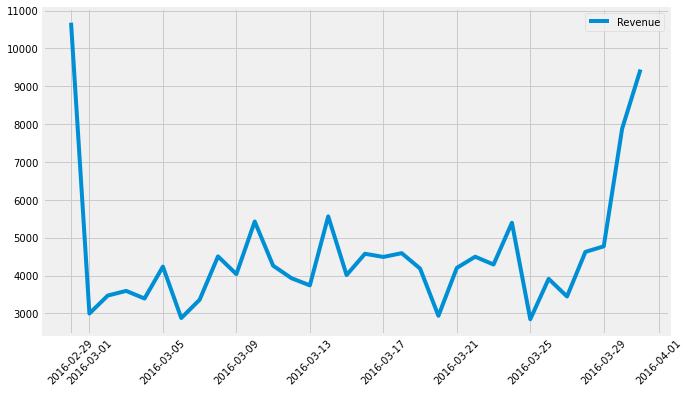

----------------------------------------------------------------------
48 ] Monthly Graph from 2016-03-31 00:00:00 to 2016-04-30 00:00:00


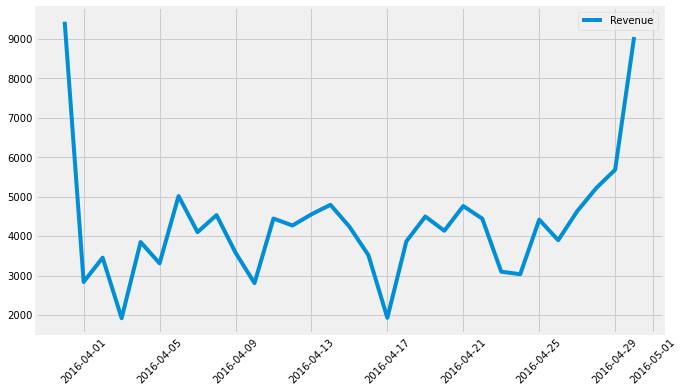

----------------------------------------------------------------------
49 ] Monthly Graph from 2016-04-30 00:00:00 to 2016-05-31 00:00:00


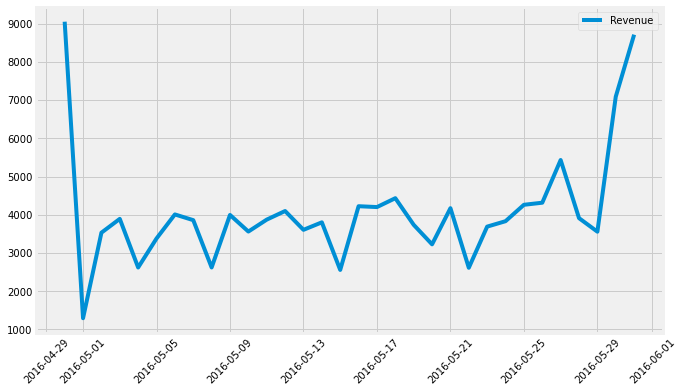

----------------------------------------------------------------------
50 ] Monthly Graph from 2016-05-31 00:00:00 to 2016-06-30 00:00:00


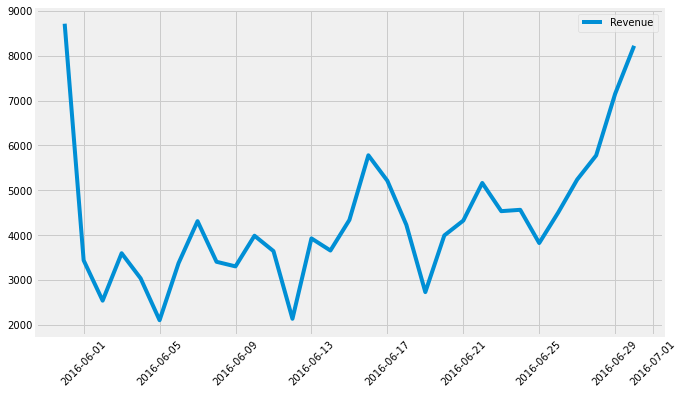

----------------------------------------------------------------------
51 ] Monthly Graph from 2016-06-30 00:00:00 to 2016-07-31 00:00:00


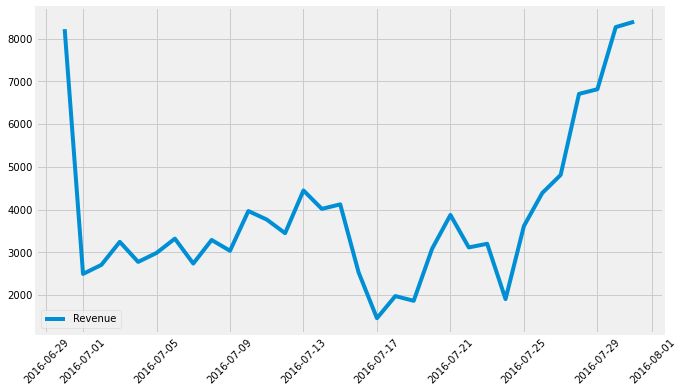

----------------------------------------------------------------------
52 ] Monthly Graph from 2016-07-31 00:00:00 to 2016-08-31 00:00:00


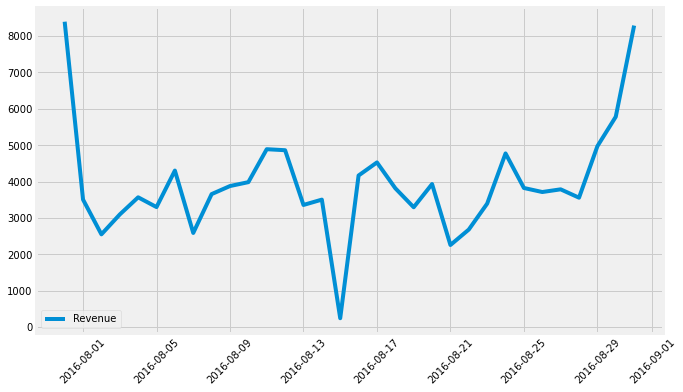

----------------------------------------------------------------------
53 ] Monthly Graph from 2016-08-31 00:00:00 to 2016-09-30 00:00:00


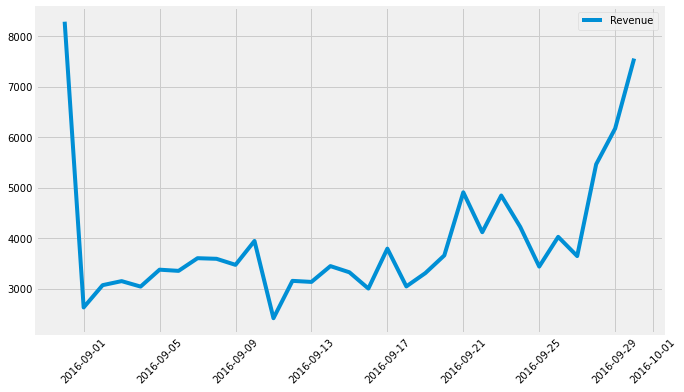

----------------------------------------------------------------------
54 ] Monthly Graph from 2016-09-30 00:00:00 to 2016-10-31 00:00:00


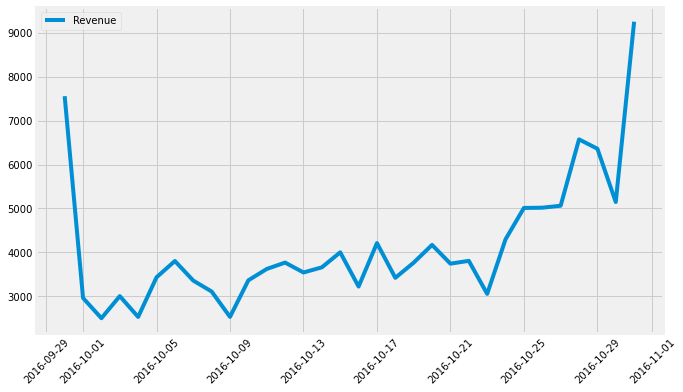

----------------------------------------------------------------------


In [9]:
# Monthly analysis
interval_M = pd.date_range('2012-04-01', '2016-11-01', freq='M')
print(interval_M,'\n')

for i in range(len(interval_M)-1):
    print(i+1,'] Monthly Graph from',interval_M[i],'to', interval_M[i+1])
    plt.figure(figsize=(10,6))
    plt.plot(df.set_index('Invoice_DateTime')
             [interval_M[i]:interval_M[i+1]])
    plt.legend(['Revenue'])
    plt.xticks(rotation=45)
    plt.show()
    print('-'*70)

From 54 graphs of monthly analysis, it is clear that revenue is higher at the end of each month. Also there are some irregularity in middle of each month, so to get idea about that, let's go deeper.

DatetimeIndex(['2012-04-02', '2012-04-09', '2012-04-16', '2012-04-23',
               '2012-04-30', '2012-05-07', '2012-05-14', '2012-05-21',
               '2012-05-28', '2012-06-04',
               ...
               '2016-08-29', '2016-09-05', '2016-09-12', '2016-09-19',
               '2016-09-26', '2016-10-03', '2016-10-10', '2016-10-17',
               '2016-10-24', '2016-10-31'],
              dtype='datetime64[ns]', length=240, freq='7D') 

1 ] Monthly Graph from MONDAY 2012-04-02 00:00:00 to MONDAY 2012-04-09 00:00:00


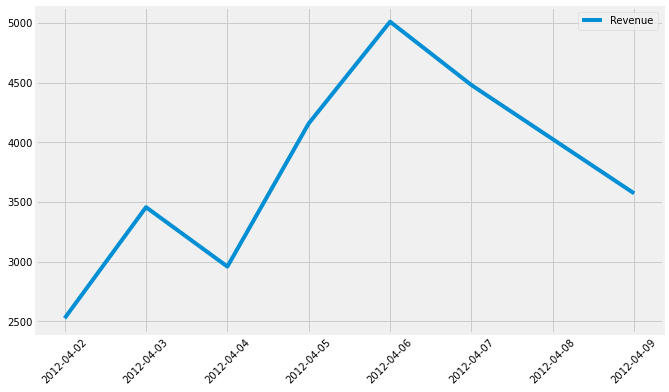

----------------------------------------------------------------------
2 ] Monthly Graph from MONDAY 2012-04-09 00:00:00 to MONDAY 2012-04-16 00:00:00


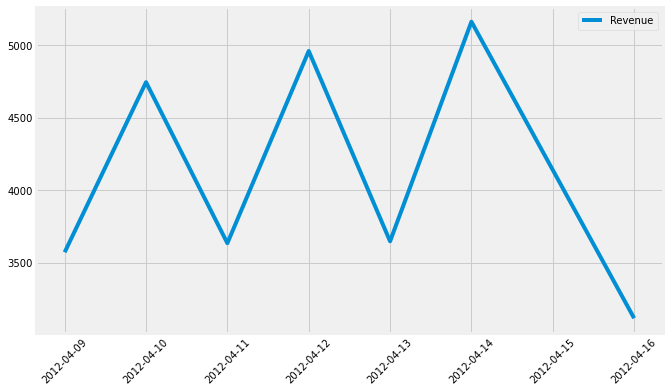

----------------------------------------------------------------------
3 ] Monthly Graph from MONDAY 2012-04-16 00:00:00 to MONDAY 2012-04-23 00:00:00


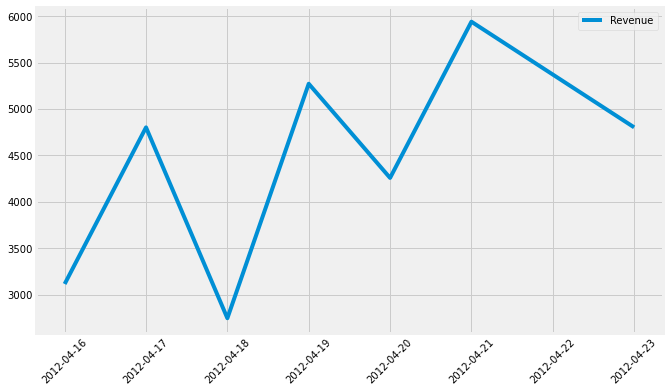

----------------------------------------------------------------------
4 ] Monthly Graph from MONDAY 2012-04-23 00:00:00 to MONDAY 2012-04-30 00:00:00


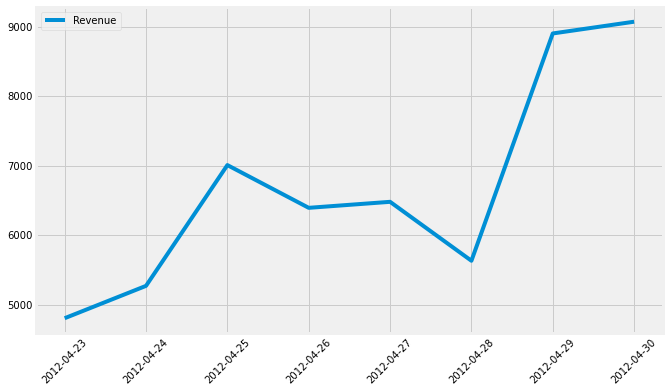

----------------------------------------------------------------------
5 ] Monthly Graph from MONDAY 2012-04-30 00:00:00 to MONDAY 2012-05-07 00:00:00


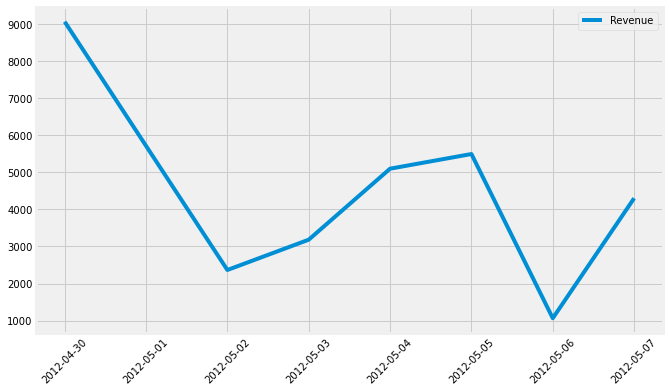

----------------------------------------------------------------------
6 ] Monthly Graph from MONDAY 2012-05-07 00:00:00 to MONDAY 2012-05-14 00:00:00


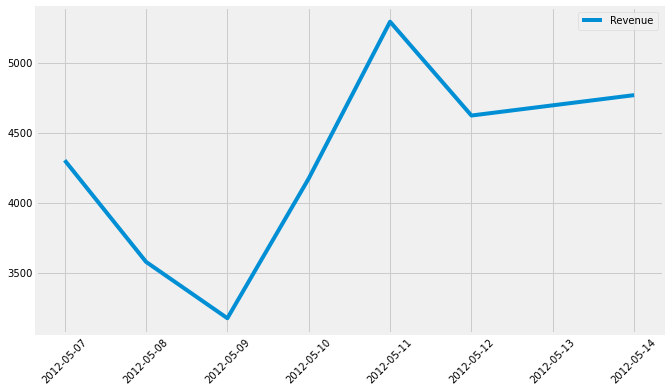

----------------------------------------------------------------------
7 ] Monthly Graph from MONDAY 2012-05-14 00:00:00 to MONDAY 2012-05-21 00:00:00


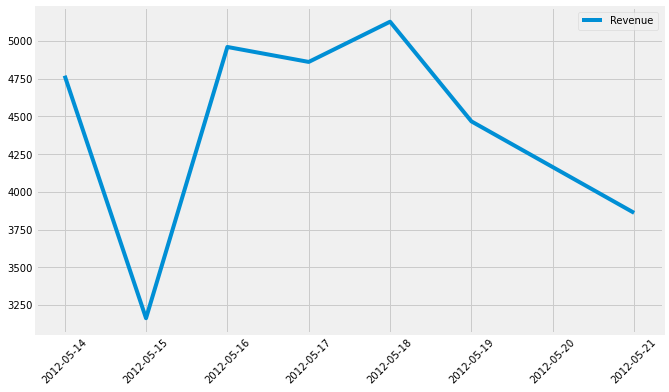

----------------------------------------------------------------------
8 ] Monthly Graph from MONDAY 2012-05-21 00:00:00 to MONDAY 2012-05-28 00:00:00


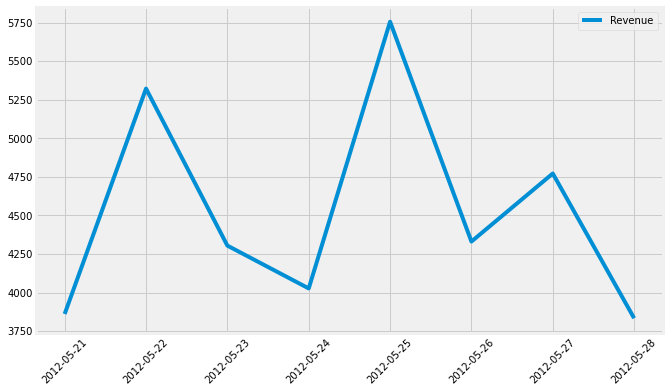

----------------------------------------------------------------------
9 ] Monthly Graph from MONDAY 2012-05-28 00:00:00 to MONDAY 2012-06-04 00:00:00


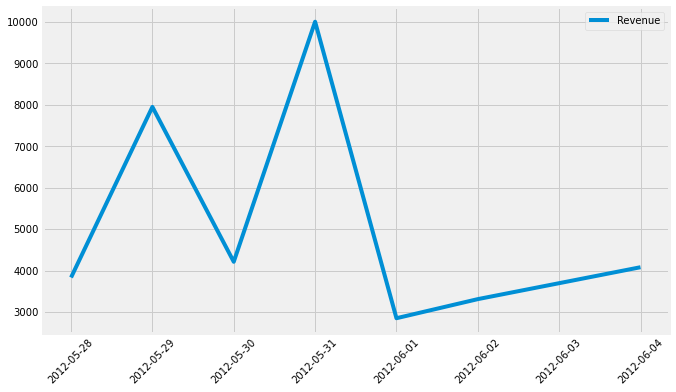

----------------------------------------------------------------------
10 ] Monthly Graph from MONDAY 2012-06-04 00:00:00 to MONDAY 2012-06-11 00:00:00


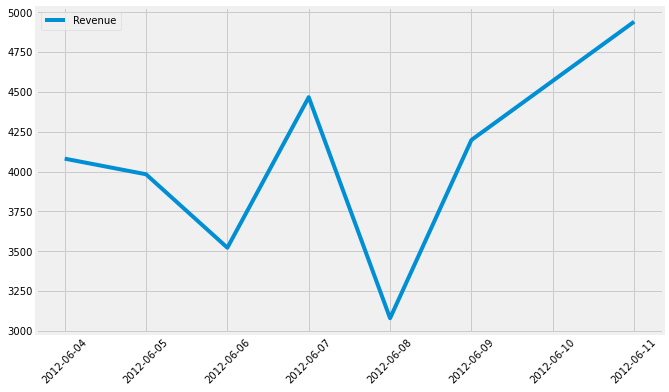

----------------------------------------------------------------------
11 ] Monthly Graph from MONDAY 2012-06-11 00:00:00 to MONDAY 2012-06-18 00:00:00


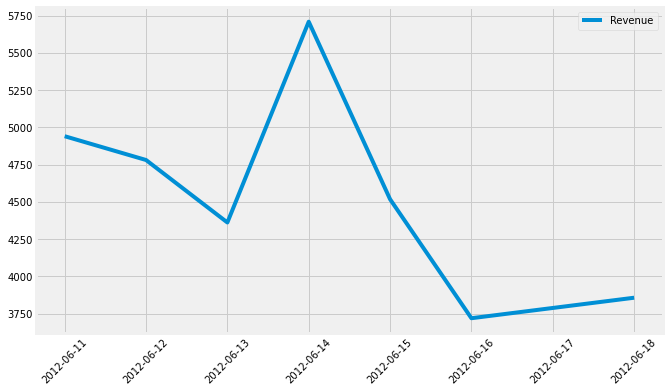

----------------------------------------------------------------------
12 ] Monthly Graph from MONDAY 2012-06-18 00:00:00 to MONDAY 2012-06-25 00:00:00


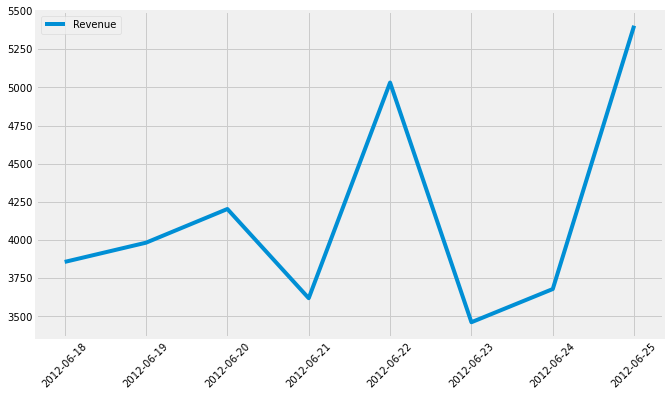

----------------------------------------------------------------------
13 ] Monthly Graph from MONDAY 2012-06-25 00:00:00 to MONDAY 2012-07-02 00:00:00


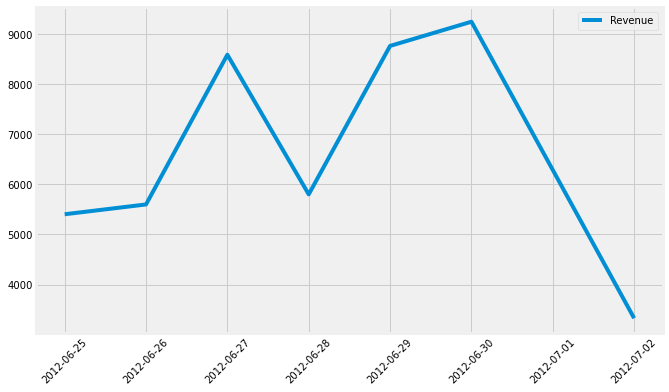

----------------------------------------------------------------------
14 ] Monthly Graph from MONDAY 2012-07-02 00:00:00 to MONDAY 2012-07-09 00:00:00


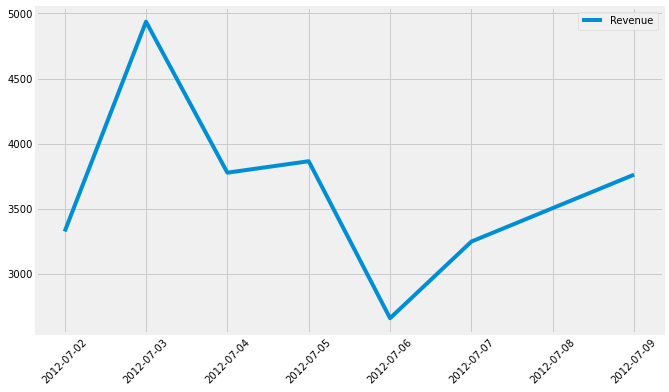

----------------------------------------------------------------------
15 ] Monthly Graph from MONDAY 2012-07-09 00:00:00 to MONDAY 2012-07-16 00:00:00


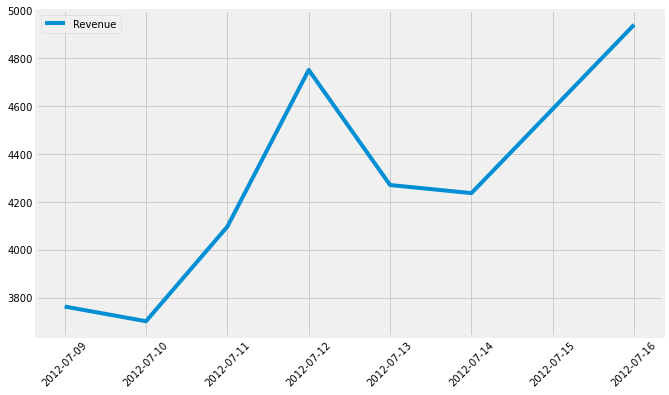

----------------------------------------------------------------------
16 ] Monthly Graph from MONDAY 2012-07-16 00:00:00 to MONDAY 2012-07-23 00:00:00


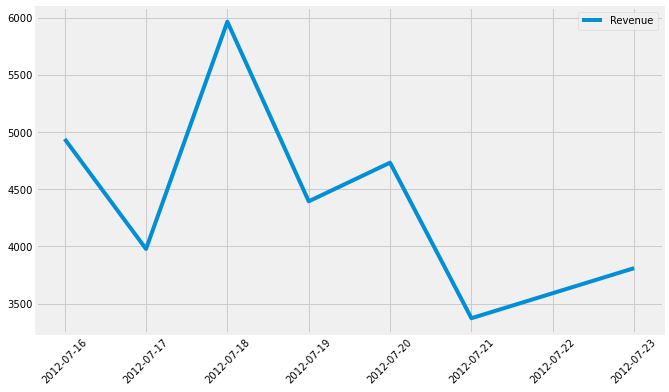

----------------------------------------------------------------------
17 ] Monthly Graph from MONDAY 2012-07-23 00:00:00 to MONDAY 2012-07-30 00:00:00


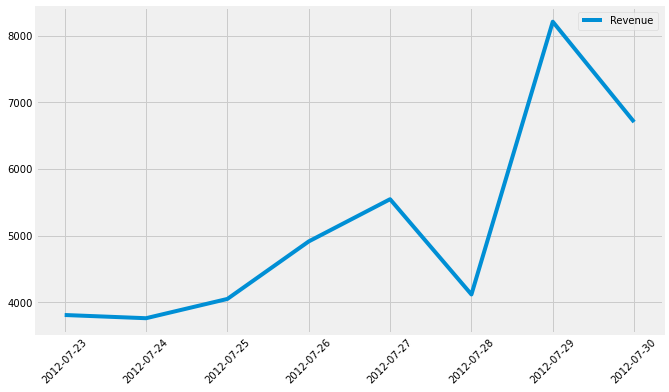

----------------------------------------------------------------------
18 ] Monthly Graph from MONDAY 2012-07-30 00:00:00 to MONDAY 2012-08-06 00:00:00


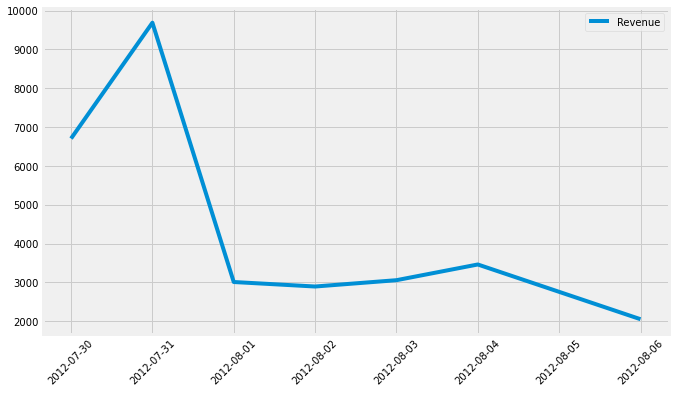

----------------------------------------------------------------------
19 ] Monthly Graph from MONDAY 2012-08-06 00:00:00 to MONDAY 2012-08-13 00:00:00


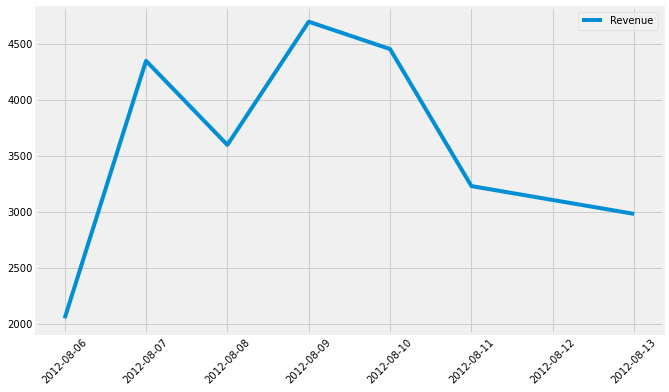

----------------------------------------------------------------------
20 ] Monthly Graph from MONDAY 2012-08-13 00:00:00 to MONDAY 2012-08-20 00:00:00


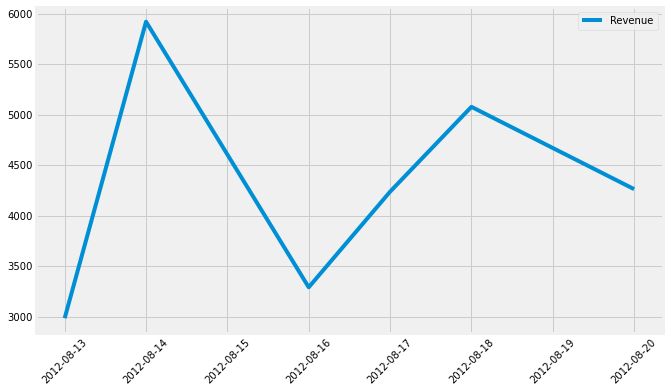

----------------------------------------------------------------------
21 ] Monthly Graph from MONDAY 2012-08-20 00:00:00 to MONDAY 2012-08-27 00:00:00


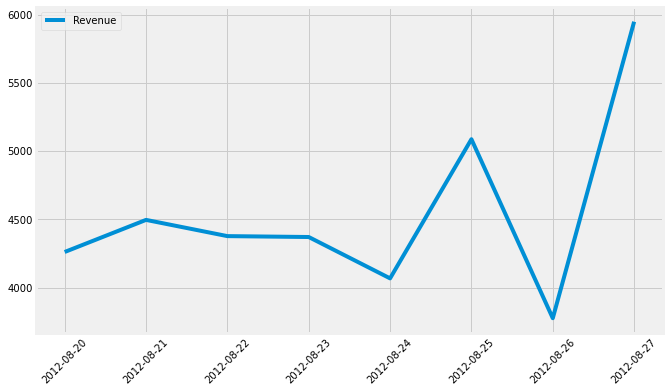

----------------------------------------------------------------------
22 ] Monthly Graph from MONDAY 2012-08-27 00:00:00 to MONDAY 2012-09-03 00:00:00


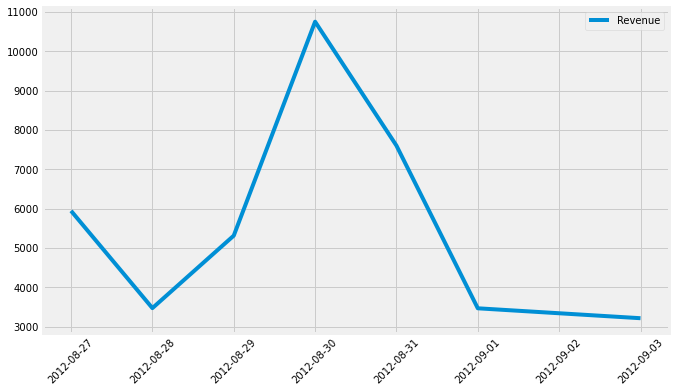

----------------------------------------------------------------------
23 ] Monthly Graph from MONDAY 2012-09-03 00:00:00 to MONDAY 2012-09-10 00:00:00


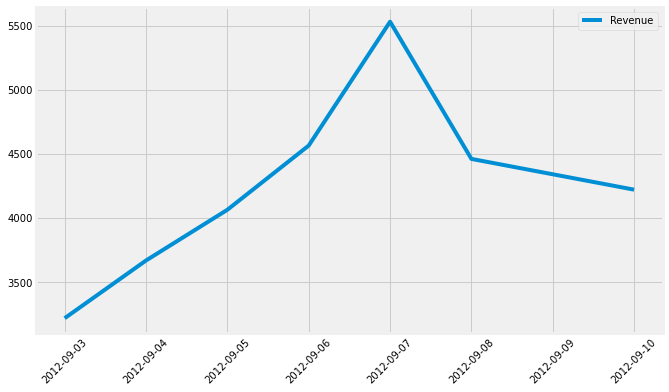

----------------------------------------------------------------------
24 ] Monthly Graph from MONDAY 2012-09-10 00:00:00 to MONDAY 2012-09-17 00:00:00


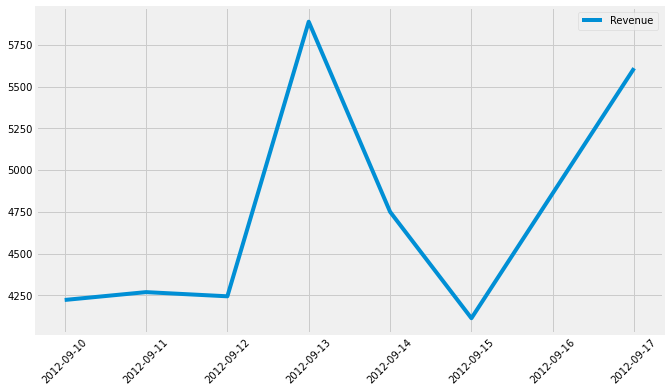

----------------------------------------------------------------------
25 ] Monthly Graph from MONDAY 2012-09-17 00:00:00 to MONDAY 2012-09-24 00:00:00


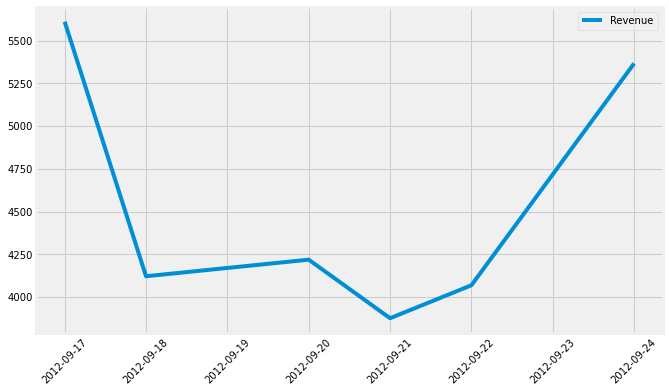

----------------------------------------------------------------------
26 ] Monthly Graph from MONDAY 2012-09-24 00:00:00 to MONDAY 2012-10-01 00:00:00


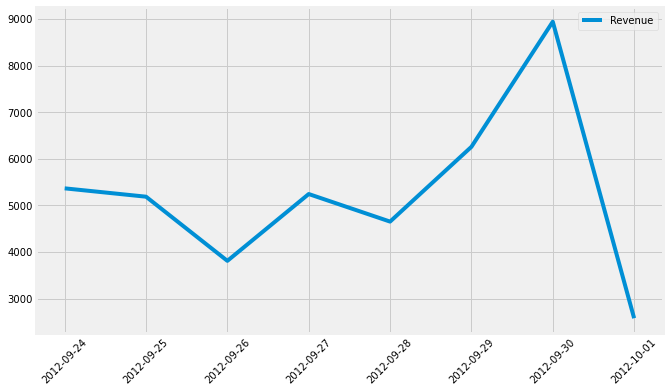

----------------------------------------------------------------------
27 ] Monthly Graph from MONDAY 2012-10-01 00:00:00 to MONDAY 2012-10-08 00:00:00


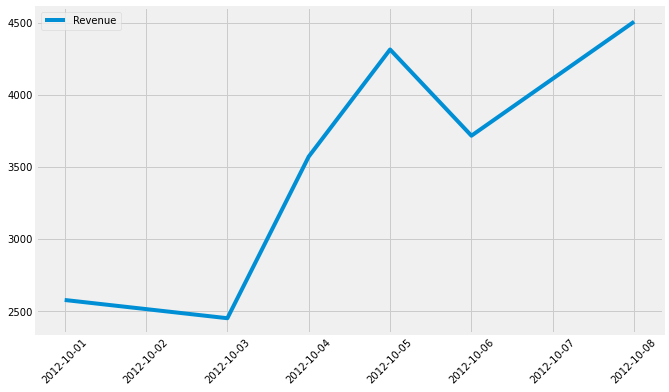

----------------------------------------------------------------------
28 ] Monthly Graph from MONDAY 2012-10-08 00:00:00 to MONDAY 2012-10-15 00:00:00


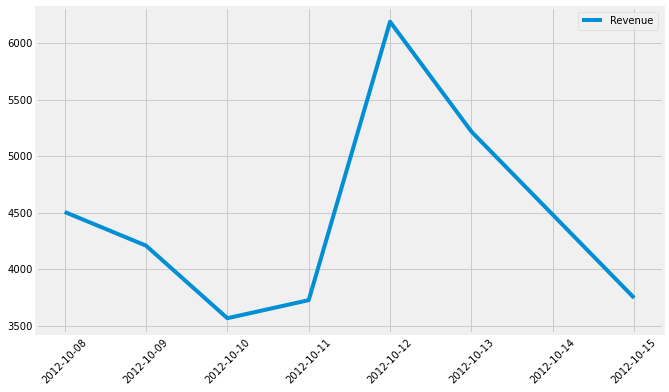

----------------------------------------------------------------------
29 ] Monthly Graph from MONDAY 2012-10-15 00:00:00 to MONDAY 2012-10-22 00:00:00


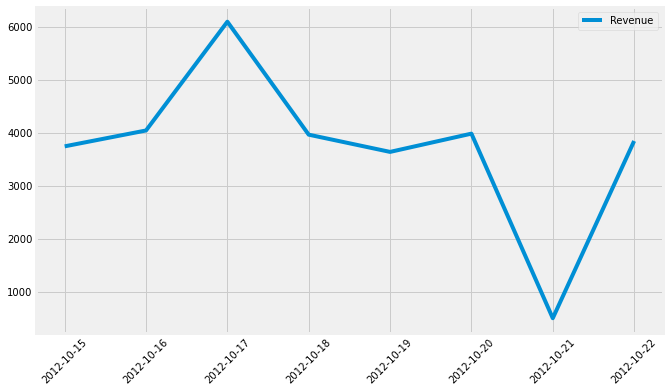

----------------------------------------------------------------------
30 ] Monthly Graph from MONDAY 2012-10-22 00:00:00 to MONDAY 2012-10-29 00:00:00


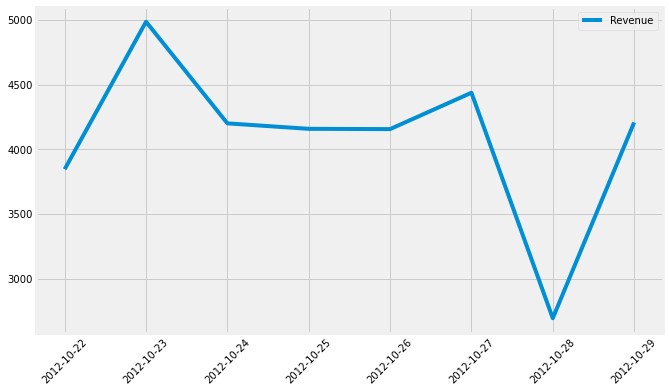

----------------------------------------------------------------------
31 ] Monthly Graph from MONDAY 2012-10-29 00:00:00 to MONDAY 2012-11-05 00:00:00


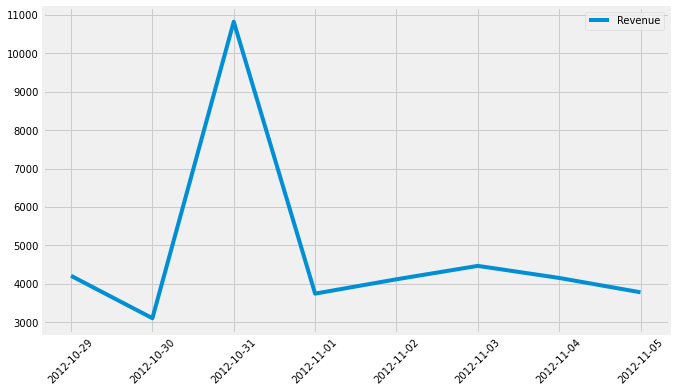

----------------------------------------------------------------------
32 ] Monthly Graph from MONDAY 2012-11-05 00:00:00 to MONDAY 2012-11-12 00:00:00


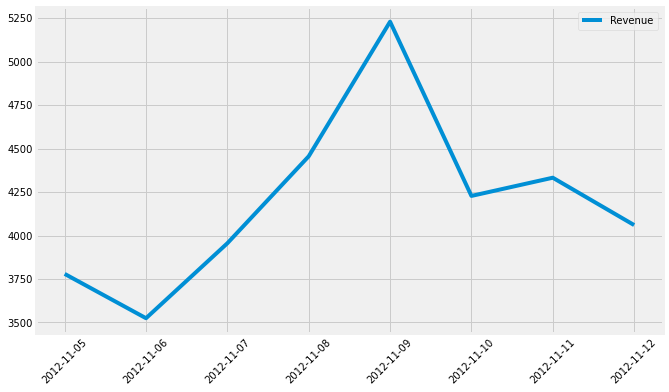

----------------------------------------------------------------------
33 ] Monthly Graph from MONDAY 2012-11-12 00:00:00 to MONDAY 2012-11-19 00:00:00


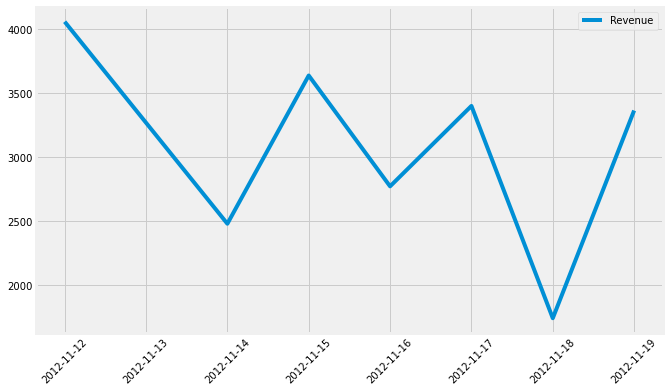

----------------------------------------------------------------------
34 ] Monthly Graph from MONDAY 2012-11-19 00:00:00 to MONDAY 2012-11-26 00:00:00


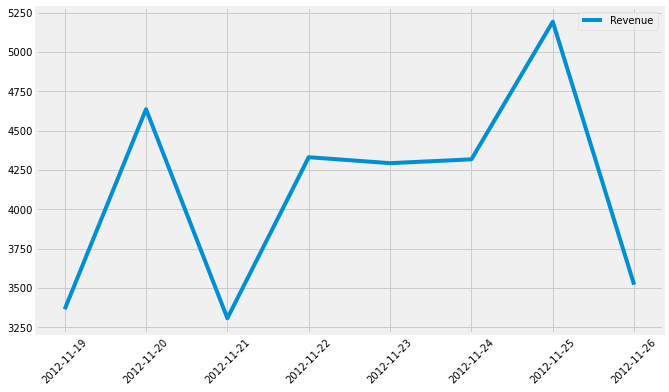

----------------------------------------------------------------------
35 ] Monthly Graph from MONDAY 2012-11-26 00:00:00 to MONDAY 2012-12-03 00:00:00


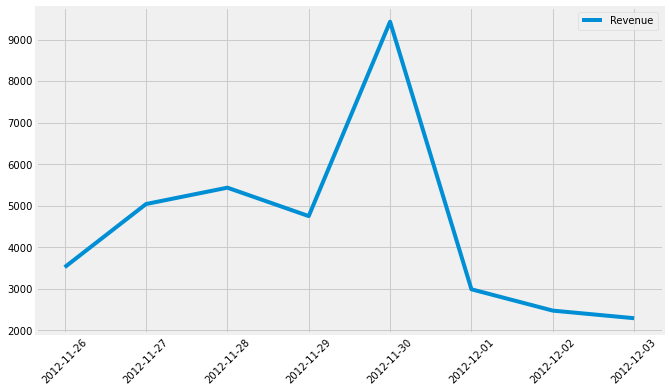

----------------------------------------------------------------------
36 ] Monthly Graph from MONDAY 2012-12-03 00:00:00 to MONDAY 2012-12-10 00:00:00


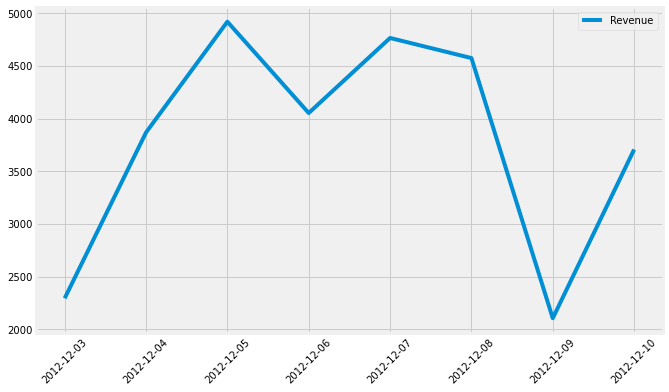

----------------------------------------------------------------------
37 ] Monthly Graph from MONDAY 2012-12-10 00:00:00 to MONDAY 2012-12-17 00:00:00


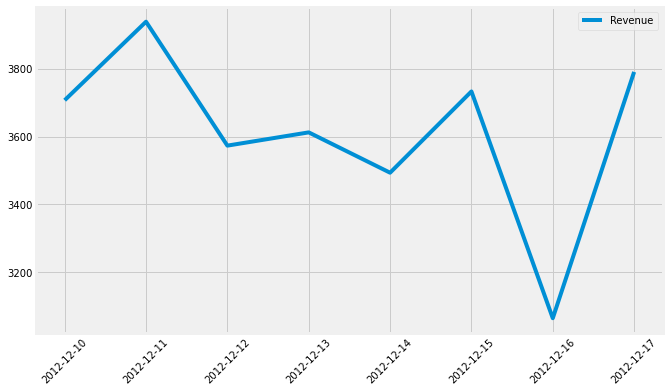

----------------------------------------------------------------------
38 ] Monthly Graph from MONDAY 2012-12-17 00:00:00 to MONDAY 2012-12-24 00:00:00


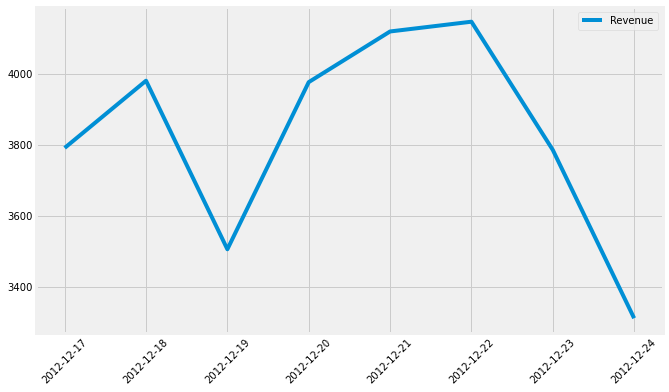

----------------------------------------------------------------------
39 ] Monthly Graph from MONDAY 2012-12-24 00:00:00 to MONDAY 2012-12-31 00:00:00


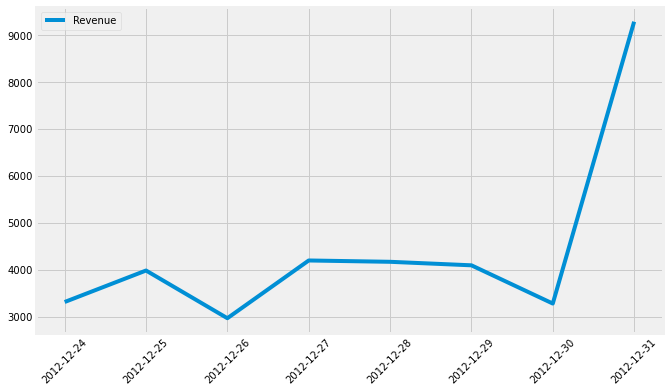

----------------------------------------------------------------------
40 ] Monthly Graph from MONDAY 2012-12-31 00:00:00 to MONDAY 2013-01-07 00:00:00


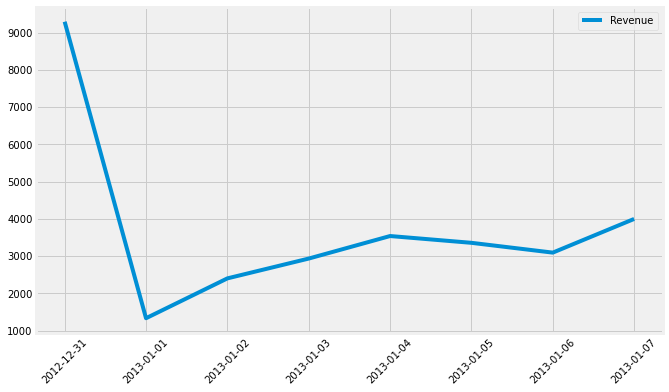

----------------------------------------------------------------------
41 ] Monthly Graph from MONDAY 2013-01-07 00:00:00 to MONDAY 2013-01-14 00:00:00


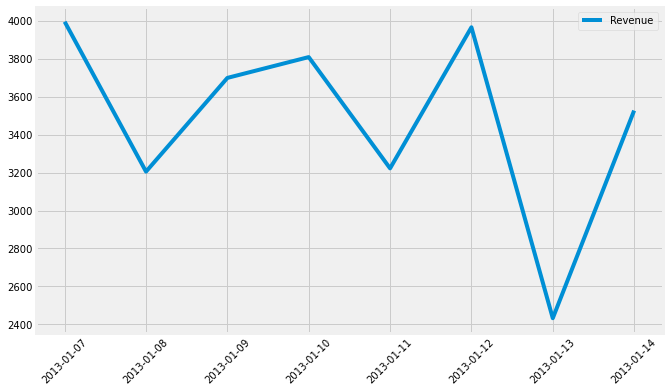

----------------------------------------------------------------------
42 ] Monthly Graph from MONDAY 2013-01-14 00:00:00 to MONDAY 2013-01-21 00:00:00


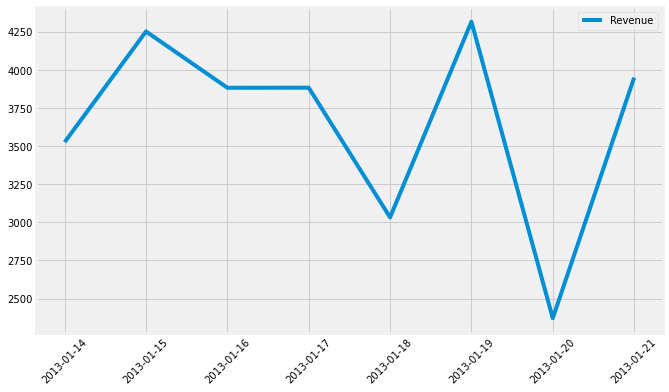

----------------------------------------------------------------------
43 ] Monthly Graph from MONDAY 2013-01-21 00:00:00 to MONDAY 2013-01-28 00:00:00


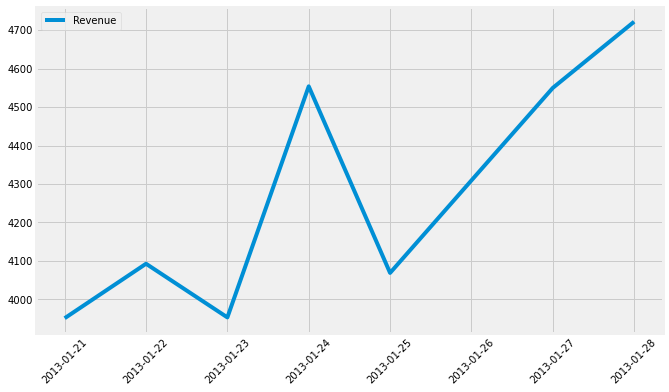

----------------------------------------------------------------------
44 ] Monthly Graph from MONDAY 2013-01-28 00:00:00 to MONDAY 2013-02-04 00:00:00


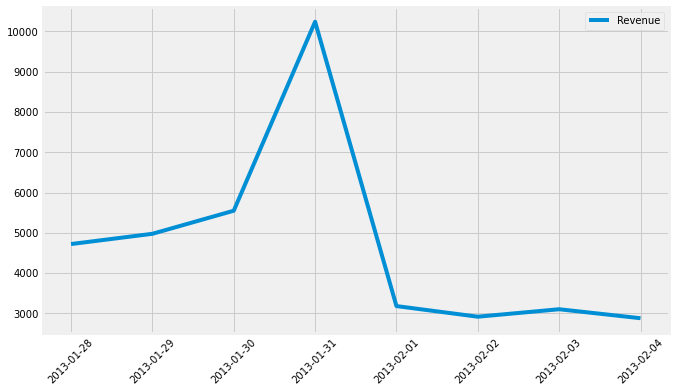

----------------------------------------------------------------------
45 ] Monthly Graph from MONDAY 2013-02-04 00:00:00 to MONDAY 2013-02-11 00:00:00


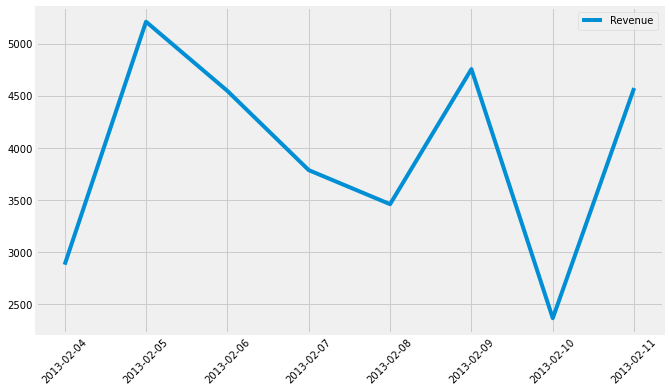

----------------------------------------------------------------------
46 ] Monthly Graph from MONDAY 2013-02-11 00:00:00 to MONDAY 2013-02-18 00:00:00


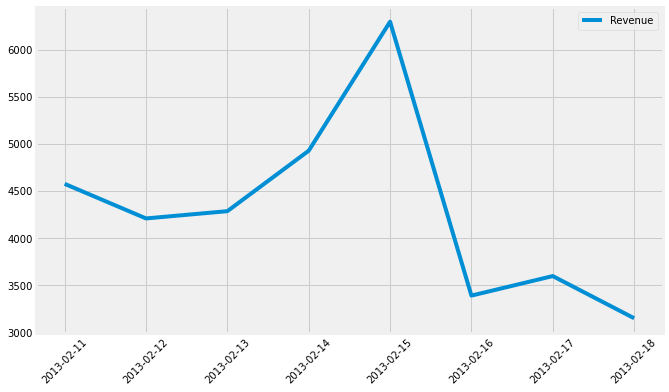

----------------------------------------------------------------------
47 ] Monthly Graph from MONDAY 2013-02-18 00:00:00 to MONDAY 2013-02-25 00:00:00


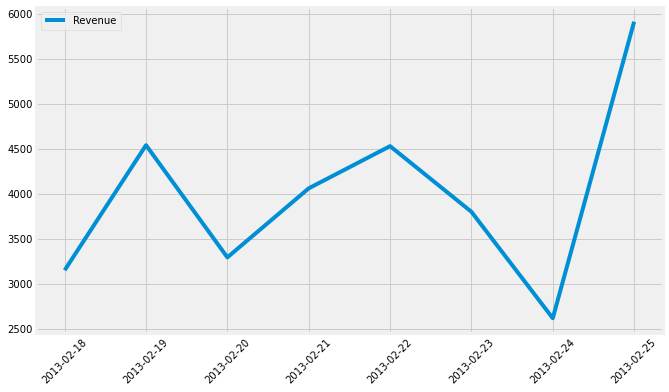

----------------------------------------------------------------------
48 ] Monthly Graph from MONDAY 2013-02-25 00:00:00 to MONDAY 2013-03-04 00:00:00


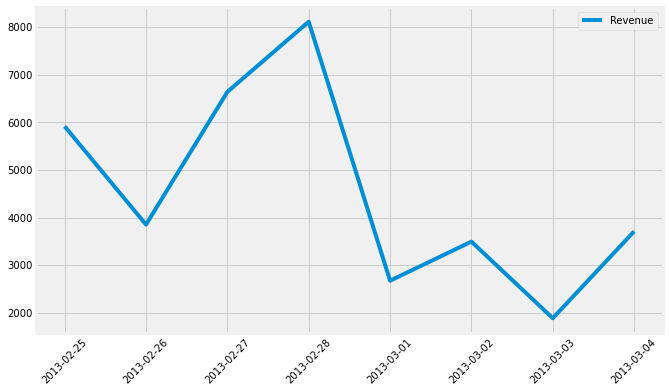

----------------------------------------------------------------------
49 ] Monthly Graph from MONDAY 2013-03-04 00:00:00 to MONDAY 2013-03-11 00:00:00


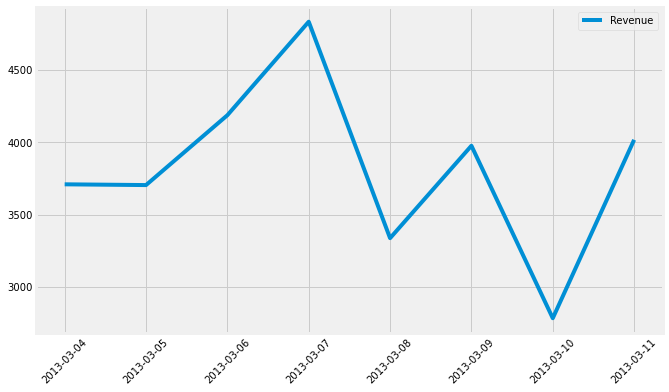

----------------------------------------------------------------------
50 ] Monthly Graph from MONDAY 2013-03-11 00:00:00 to MONDAY 2013-03-18 00:00:00


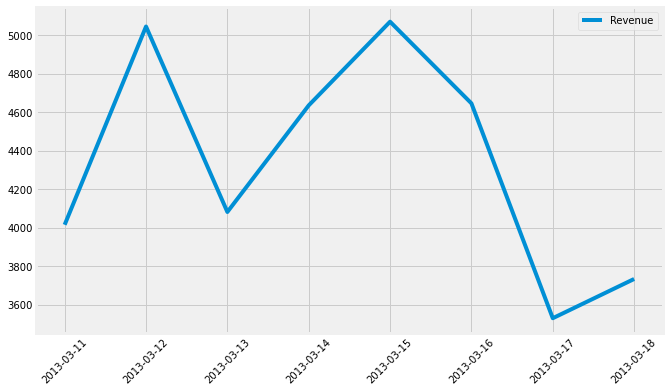

----------------------------------------------------------------------
51 ] Monthly Graph from MONDAY 2013-03-18 00:00:00 to MONDAY 2013-03-25 00:00:00


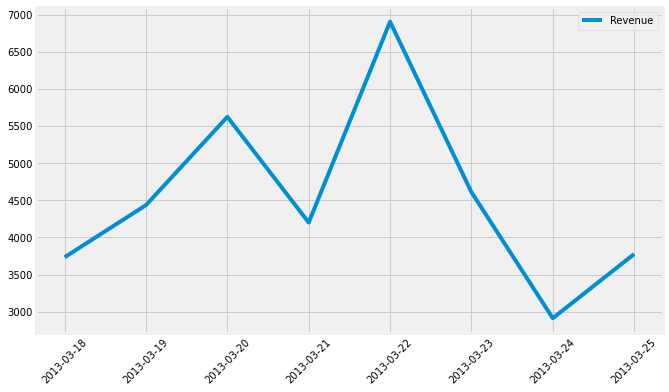

----------------------------------------------------------------------
52 ] Monthly Graph from MONDAY 2013-03-25 00:00:00 to MONDAY 2013-04-01 00:00:00


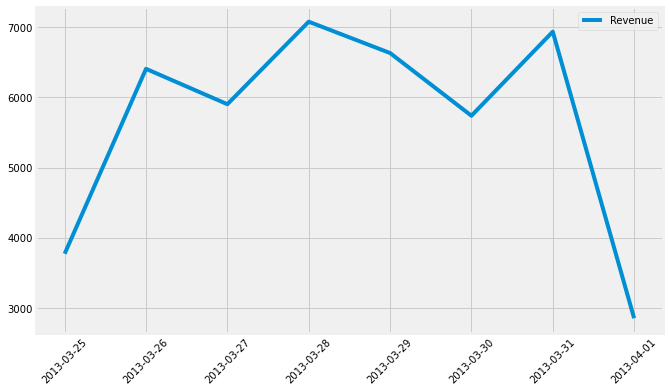

----------------------------------------------------------------------
53 ] Monthly Graph from MONDAY 2013-04-01 00:00:00 to MONDAY 2013-04-08 00:00:00


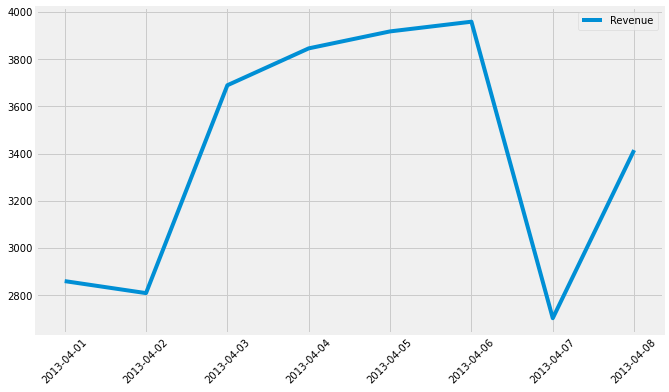

----------------------------------------------------------------------
54 ] Monthly Graph from MONDAY 2013-04-08 00:00:00 to MONDAY 2013-04-15 00:00:00


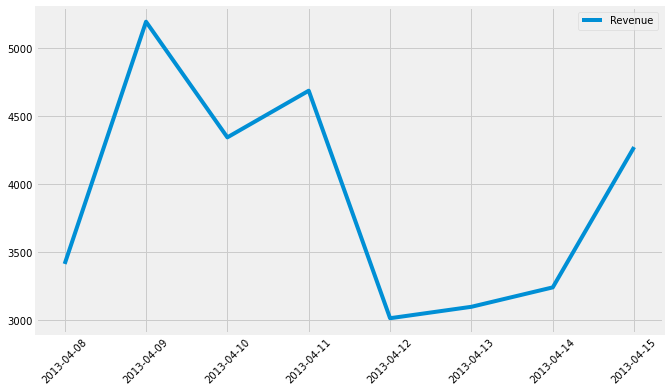

----------------------------------------------------------------------
55 ] Monthly Graph from MONDAY 2013-04-15 00:00:00 to MONDAY 2013-04-22 00:00:00


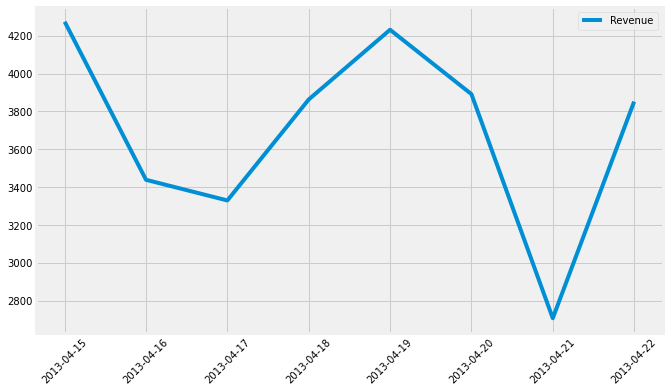

----------------------------------------------------------------------
56 ] Monthly Graph from MONDAY 2013-04-22 00:00:00 to MONDAY 2013-04-29 00:00:00


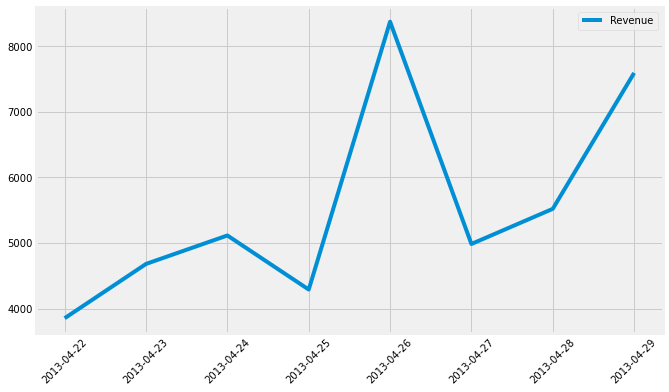

----------------------------------------------------------------------
57 ] Monthly Graph from MONDAY 2013-04-29 00:00:00 to MONDAY 2013-05-06 00:00:00


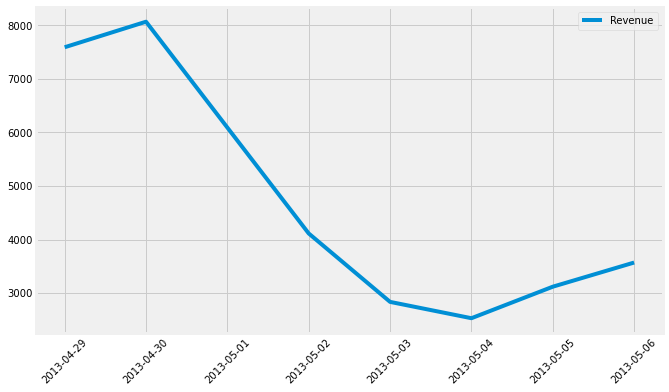

----------------------------------------------------------------------
58 ] Monthly Graph from MONDAY 2013-05-06 00:00:00 to MONDAY 2013-05-13 00:00:00


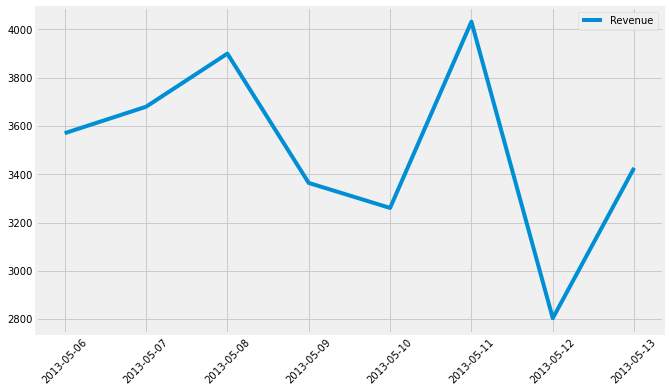

----------------------------------------------------------------------
59 ] Monthly Graph from MONDAY 2013-05-13 00:00:00 to MONDAY 2013-05-20 00:00:00


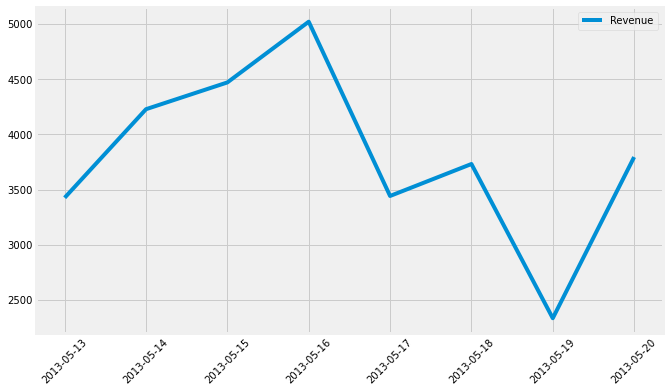

----------------------------------------------------------------------
60 ] Monthly Graph from MONDAY 2013-05-20 00:00:00 to MONDAY 2013-05-27 00:00:00


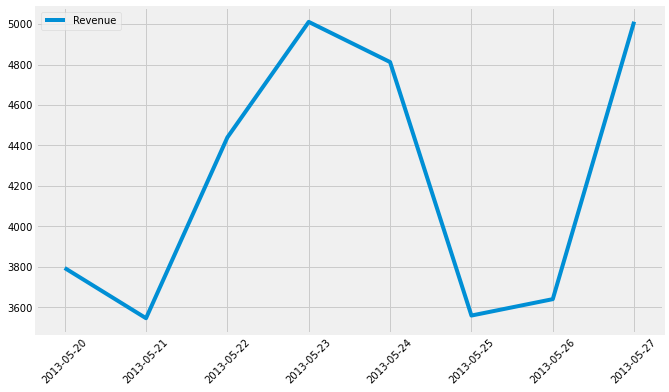

----------------------------------------------------------------------
61 ] Monthly Graph from MONDAY 2013-05-27 00:00:00 to MONDAY 2013-06-03 00:00:00


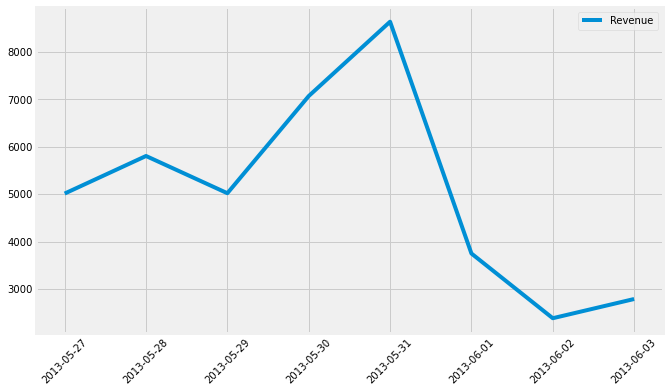

----------------------------------------------------------------------
62 ] Monthly Graph from MONDAY 2013-06-03 00:00:00 to MONDAY 2013-06-10 00:00:00


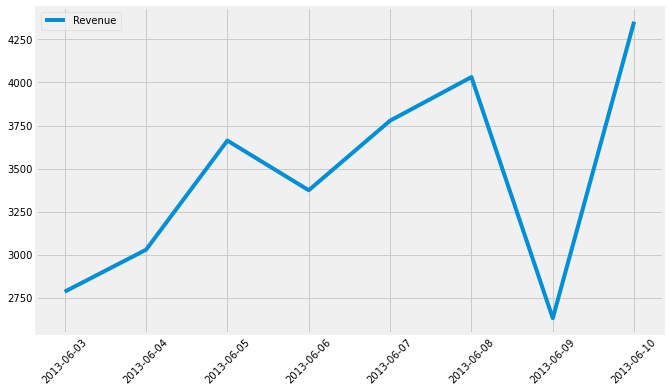

----------------------------------------------------------------------
63 ] Monthly Graph from MONDAY 2013-06-10 00:00:00 to MONDAY 2013-06-17 00:00:00


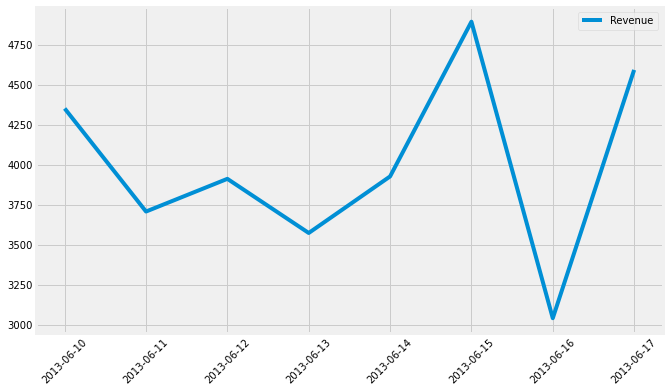

----------------------------------------------------------------------
64 ] Monthly Graph from MONDAY 2013-06-17 00:00:00 to MONDAY 2013-06-24 00:00:00


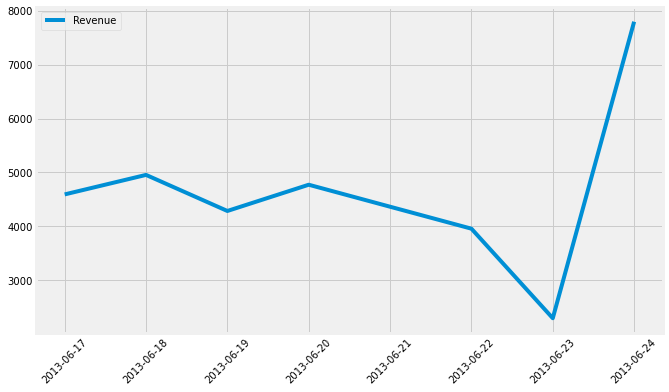

----------------------------------------------------------------------
65 ] Monthly Graph from MONDAY 2013-06-24 00:00:00 to MONDAY 2013-07-01 00:00:00


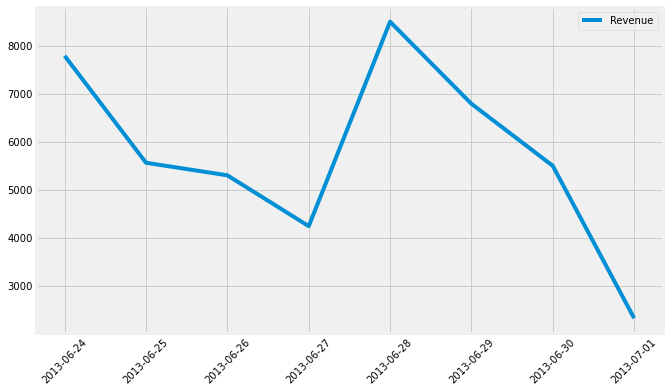

----------------------------------------------------------------------
66 ] Monthly Graph from MONDAY 2013-07-01 00:00:00 to MONDAY 2013-07-08 00:00:00


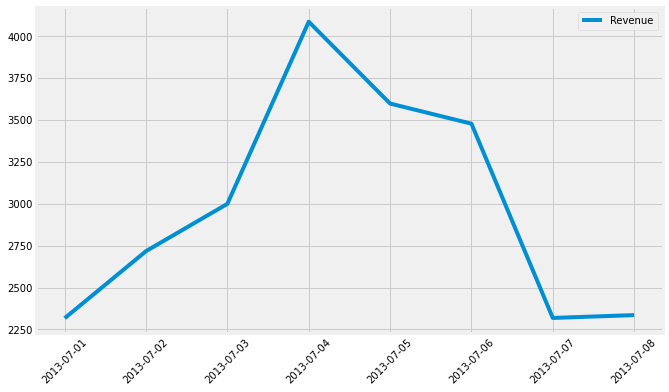

----------------------------------------------------------------------
67 ] Monthly Graph from MONDAY 2013-07-08 00:00:00 to MONDAY 2013-07-15 00:00:00


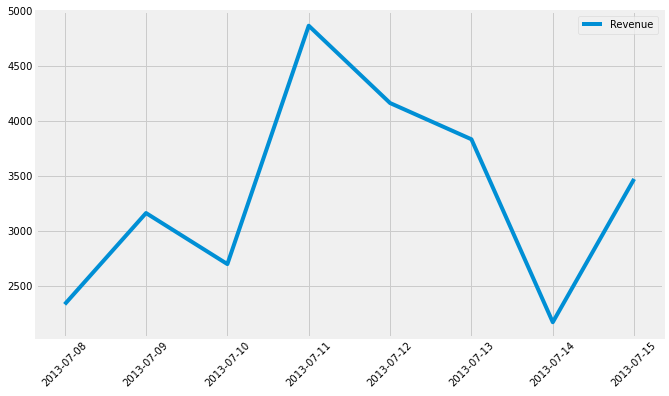

----------------------------------------------------------------------
68 ] Monthly Graph from MONDAY 2013-07-15 00:00:00 to MONDAY 2013-07-22 00:00:00


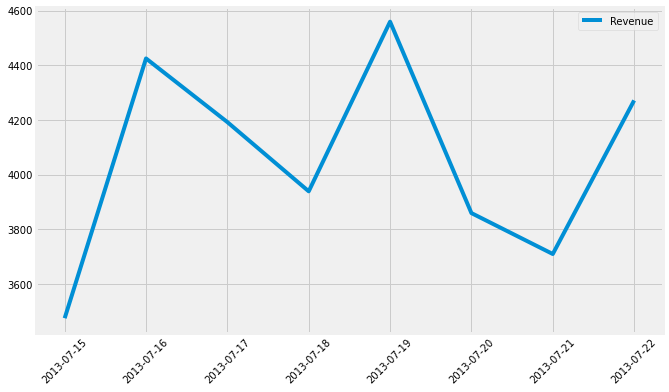

----------------------------------------------------------------------
69 ] Monthly Graph from MONDAY 2013-07-22 00:00:00 to MONDAY 2013-07-29 00:00:00


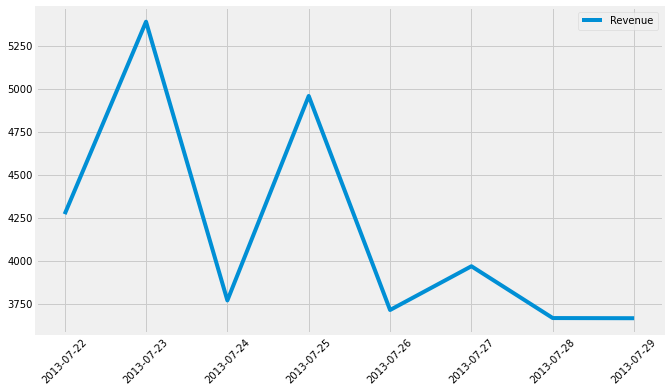

----------------------------------------------------------------------
70 ] Monthly Graph from MONDAY 2013-07-29 00:00:00 to MONDAY 2013-08-05 00:00:00


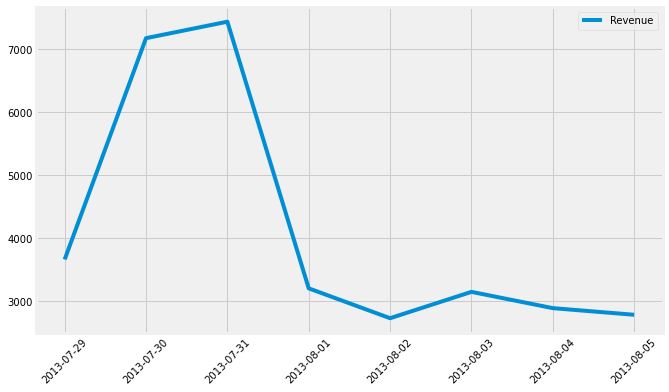

----------------------------------------------------------------------
71 ] Monthly Graph from MONDAY 2013-08-05 00:00:00 to MONDAY 2013-08-12 00:00:00


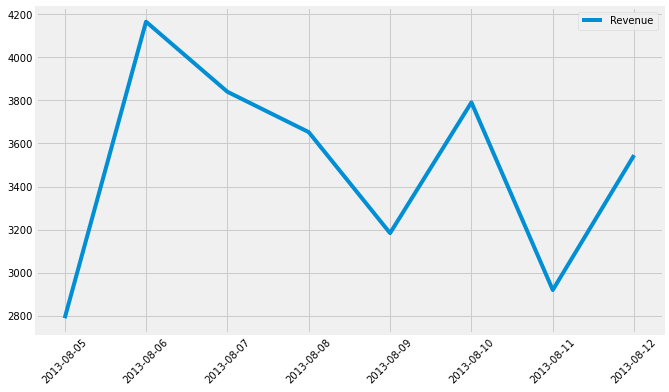

----------------------------------------------------------------------
72 ] Monthly Graph from MONDAY 2013-08-12 00:00:00 to MONDAY 2013-08-19 00:00:00


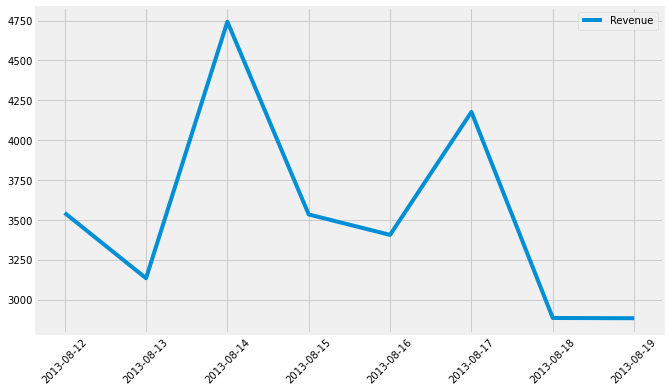

----------------------------------------------------------------------
73 ] Monthly Graph from MONDAY 2013-08-19 00:00:00 to MONDAY 2013-08-26 00:00:00


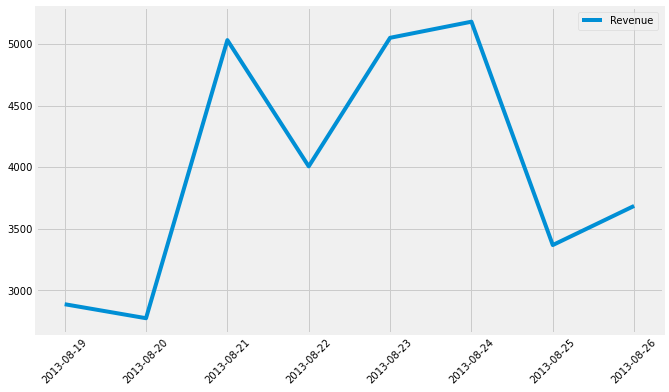

----------------------------------------------------------------------
74 ] Monthly Graph from MONDAY 2013-08-26 00:00:00 to MONDAY 2013-09-02 00:00:00


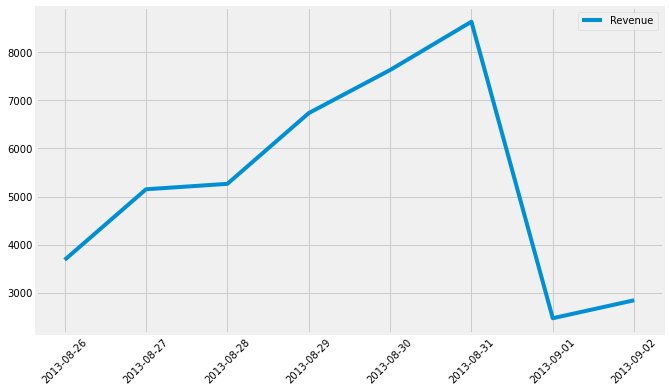

----------------------------------------------------------------------
75 ] Monthly Graph from MONDAY 2013-09-02 00:00:00 to MONDAY 2013-09-09 00:00:00


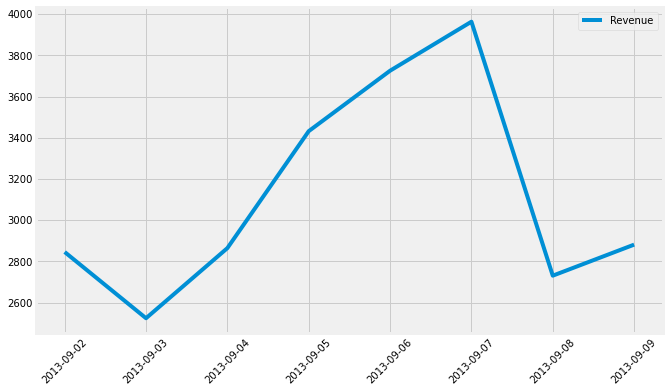

----------------------------------------------------------------------
76 ] Monthly Graph from MONDAY 2013-09-09 00:00:00 to MONDAY 2013-09-16 00:00:00


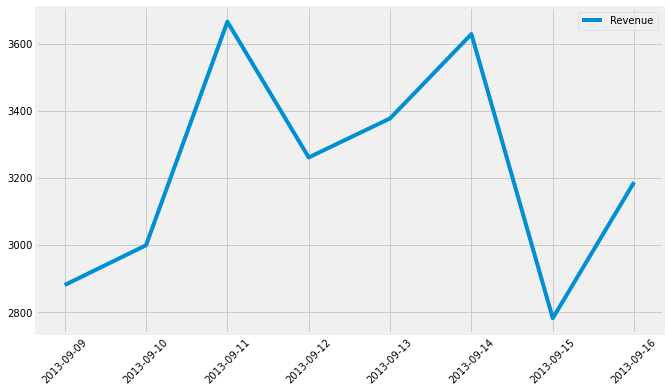

----------------------------------------------------------------------
77 ] Monthly Graph from MONDAY 2013-09-16 00:00:00 to MONDAY 2013-09-23 00:00:00


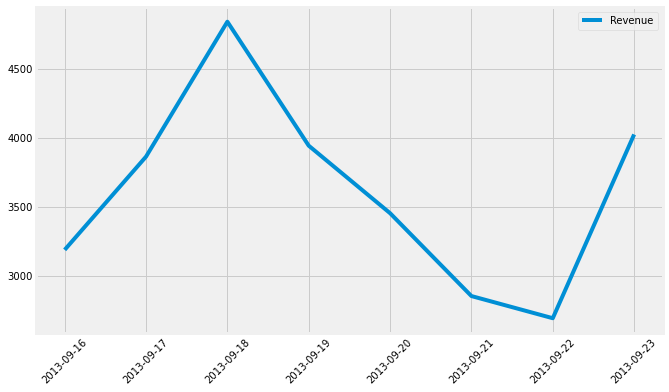

----------------------------------------------------------------------
78 ] Monthly Graph from MONDAY 2013-09-23 00:00:00 to MONDAY 2013-09-30 00:00:00


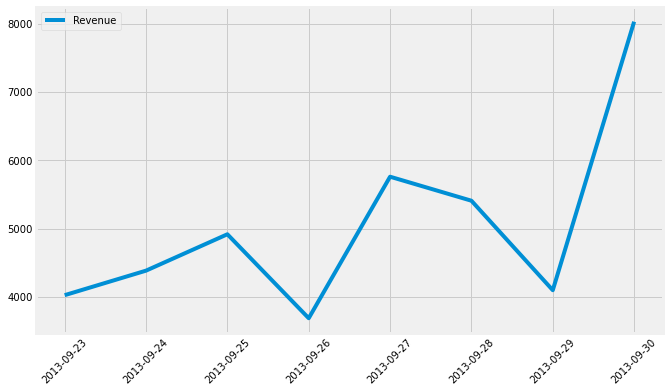

----------------------------------------------------------------------
79 ] Monthly Graph from MONDAY 2013-09-30 00:00:00 to MONDAY 2013-10-07 00:00:00


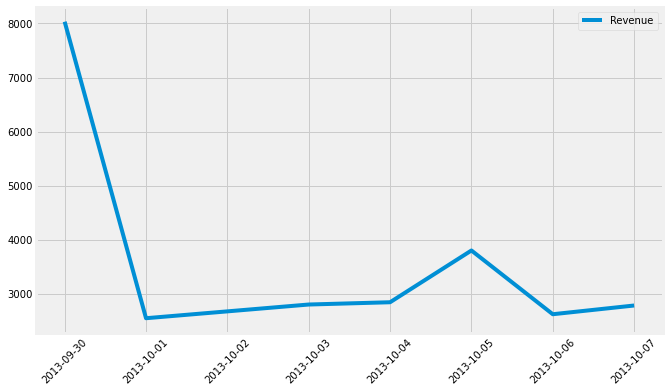

----------------------------------------------------------------------
80 ] Monthly Graph from MONDAY 2013-10-07 00:00:00 to MONDAY 2013-10-14 00:00:00


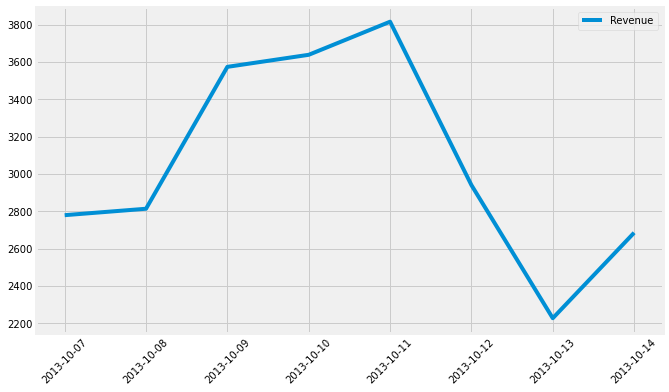

----------------------------------------------------------------------
81 ] Monthly Graph from MONDAY 2013-10-14 00:00:00 to MONDAY 2013-10-21 00:00:00


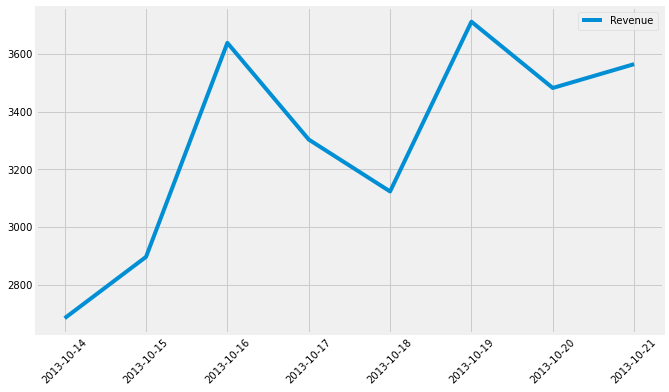

----------------------------------------------------------------------
82 ] Monthly Graph from MONDAY 2013-10-21 00:00:00 to MONDAY 2013-10-28 00:00:00


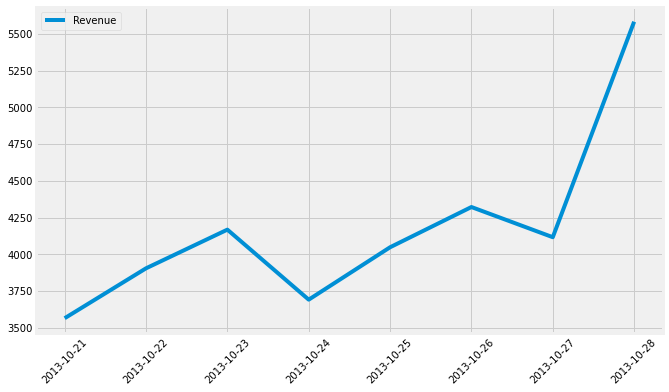

----------------------------------------------------------------------
83 ] Monthly Graph from MONDAY 2013-10-28 00:00:00 to MONDAY 2013-11-04 00:00:00


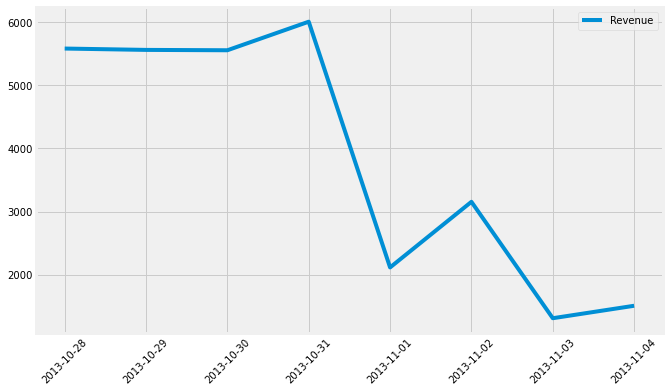

----------------------------------------------------------------------
84 ] Monthly Graph from MONDAY 2013-11-04 00:00:00 to MONDAY 2013-11-11 00:00:00


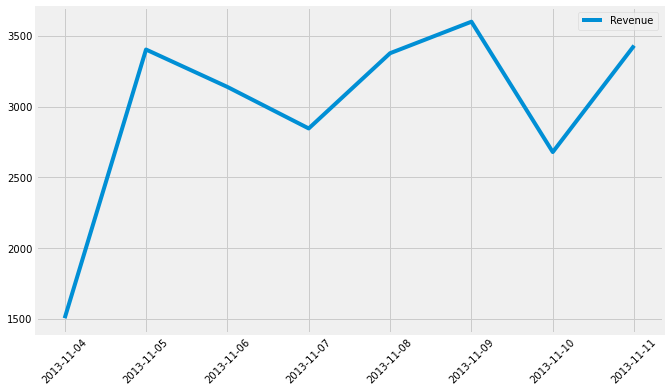

----------------------------------------------------------------------
85 ] Monthly Graph from MONDAY 2013-11-11 00:00:00 to MONDAY 2013-11-18 00:00:00


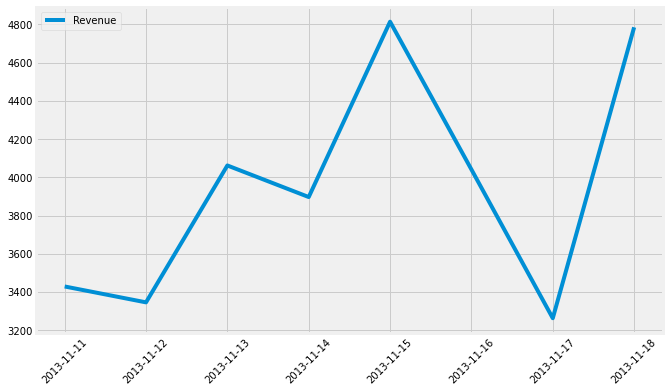

----------------------------------------------------------------------
86 ] Monthly Graph from MONDAY 2013-11-18 00:00:00 to MONDAY 2013-11-25 00:00:00


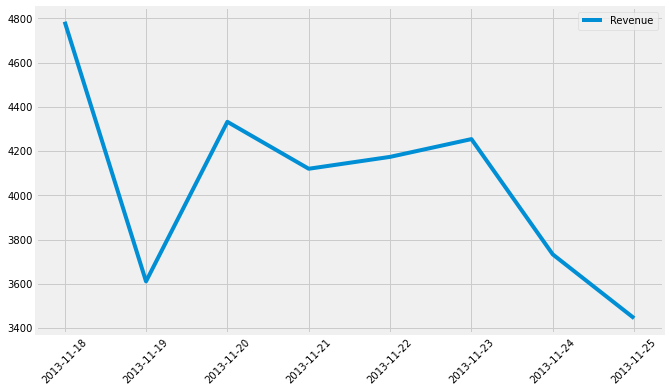

----------------------------------------------------------------------
87 ] Monthly Graph from MONDAY 2013-11-25 00:00:00 to MONDAY 2013-12-02 00:00:00


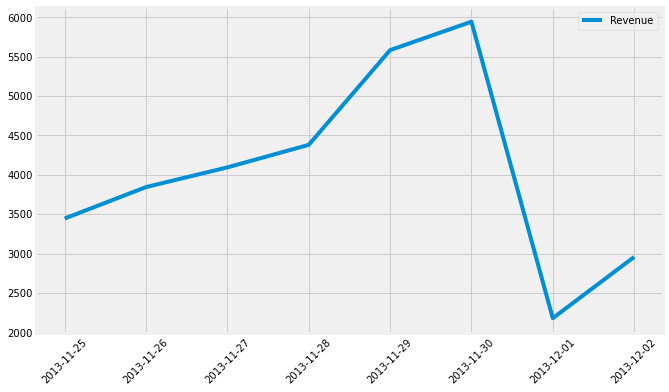

----------------------------------------------------------------------
88 ] Monthly Graph from MONDAY 2013-12-02 00:00:00 to MONDAY 2013-12-09 00:00:00


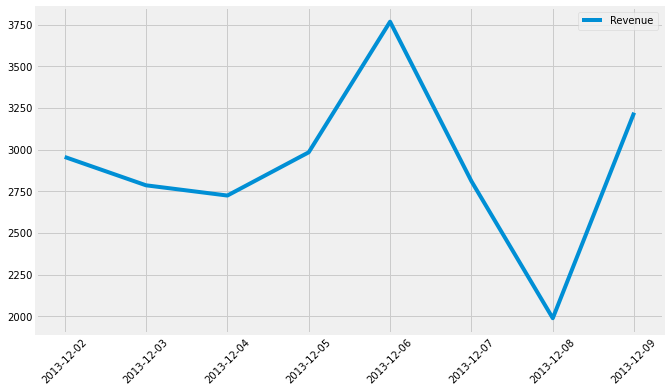

----------------------------------------------------------------------
89 ] Monthly Graph from MONDAY 2013-12-09 00:00:00 to MONDAY 2013-12-16 00:00:00


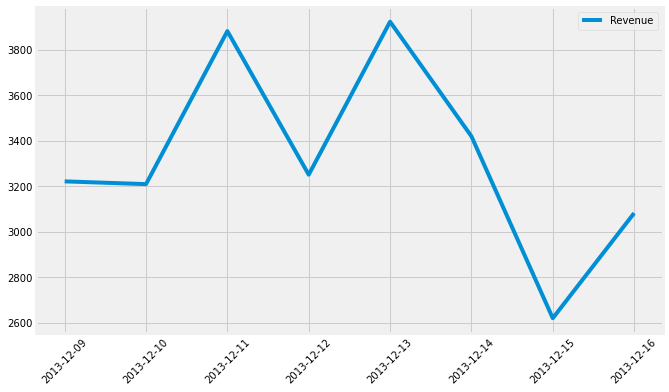

----------------------------------------------------------------------
90 ] Monthly Graph from MONDAY 2013-12-16 00:00:00 to MONDAY 2013-12-23 00:00:00


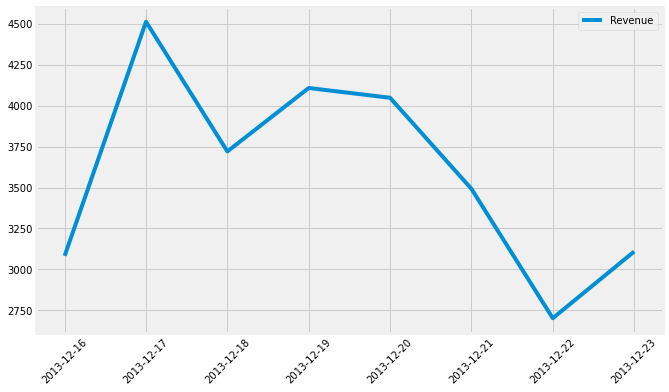

----------------------------------------------------------------------
91 ] Monthly Graph from MONDAY 2013-12-23 00:00:00 to MONDAY 2013-12-30 00:00:00


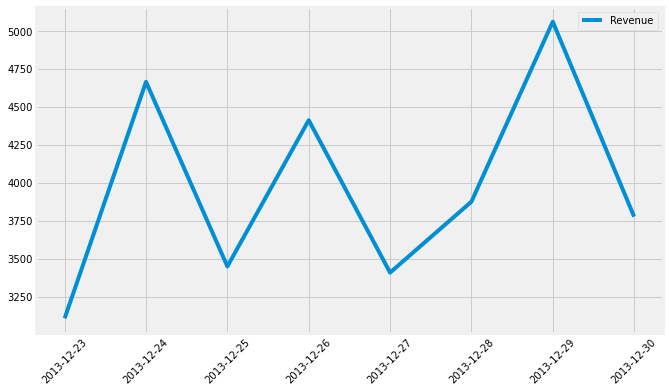

----------------------------------------------------------------------
92 ] Monthly Graph from MONDAY 2013-12-30 00:00:00 to MONDAY 2014-01-06 00:00:00


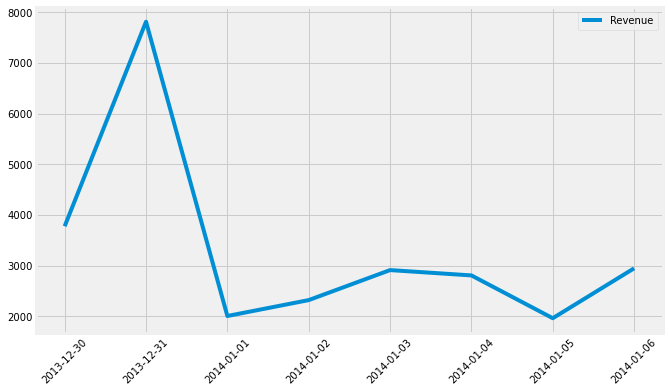

----------------------------------------------------------------------
93 ] Monthly Graph from MONDAY 2014-01-06 00:00:00 to MONDAY 2014-01-13 00:00:00


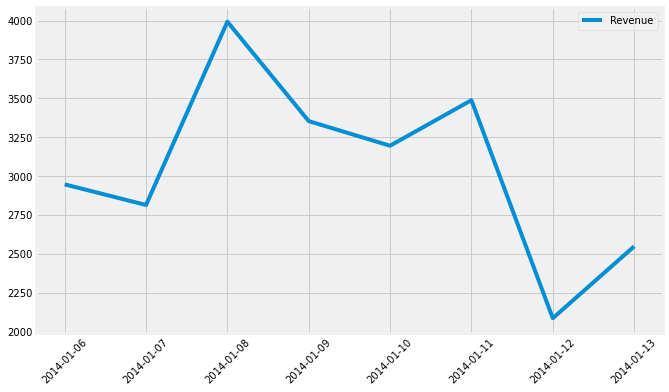

----------------------------------------------------------------------
94 ] Monthly Graph from MONDAY 2014-01-13 00:00:00 to MONDAY 2014-01-20 00:00:00


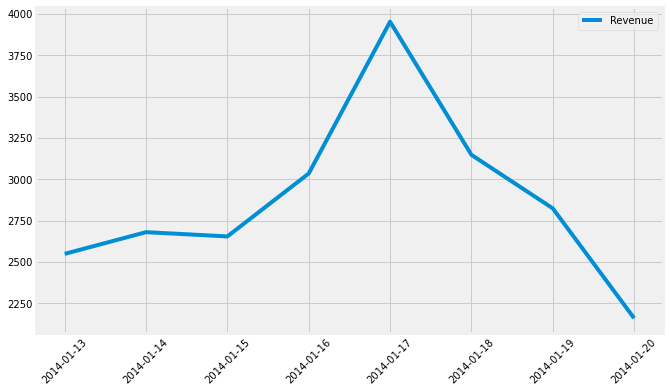

----------------------------------------------------------------------
95 ] Monthly Graph from MONDAY 2014-01-20 00:00:00 to MONDAY 2014-01-27 00:00:00


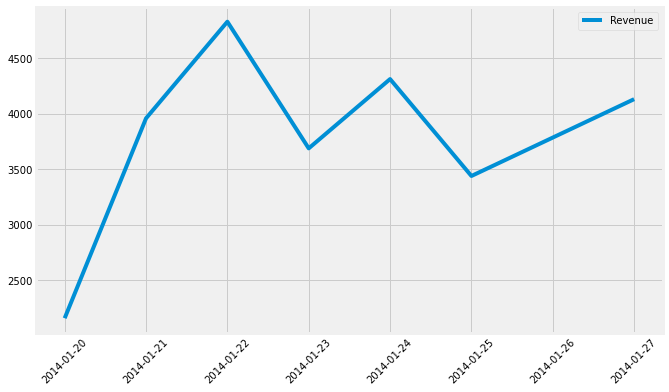

----------------------------------------------------------------------
96 ] Monthly Graph from MONDAY 2014-01-27 00:00:00 to MONDAY 2014-02-03 00:00:00


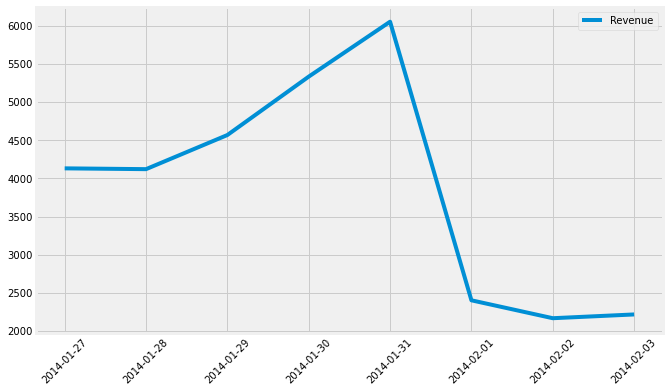

----------------------------------------------------------------------
97 ] Monthly Graph from MONDAY 2014-02-03 00:00:00 to MONDAY 2014-02-10 00:00:00


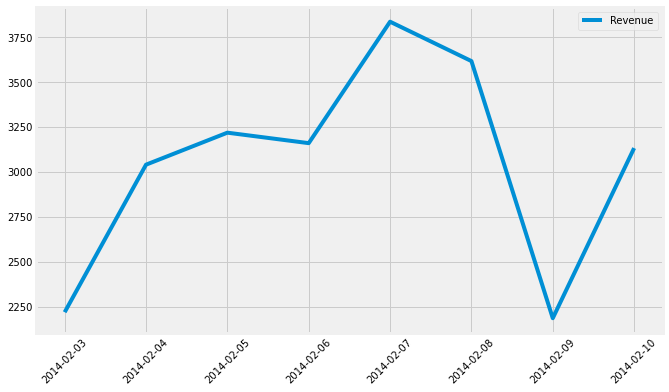

----------------------------------------------------------------------
98 ] Monthly Graph from MONDAY 2014-02-10 00:00:00 to MONDAY 2014-02-17 00:00:00


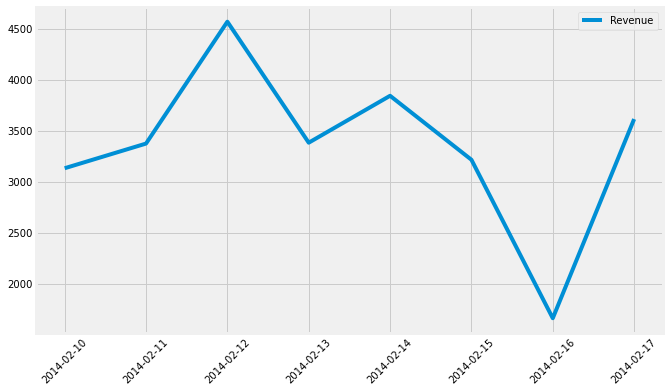

----------------------------------------------------------------------
99 ] Monthly Graph from MONDAY 2014-02-17 00:00:00 to MONDAY 2014-02-24 00:00:00


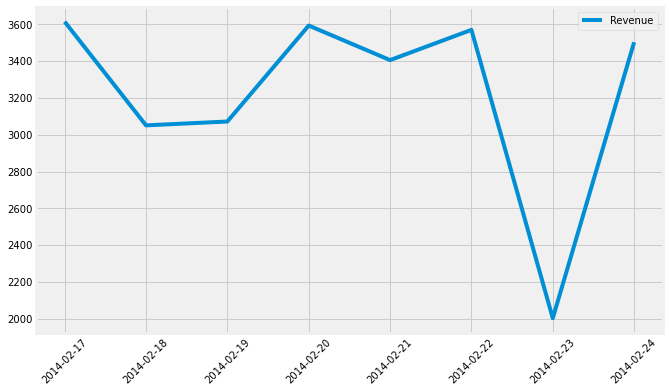

----------------------------------------------------------------------
100 ] Monthly Graph from MONDAY 2014-02-24 00:00:00 to MONDAY 2014-03-03 00:00:00


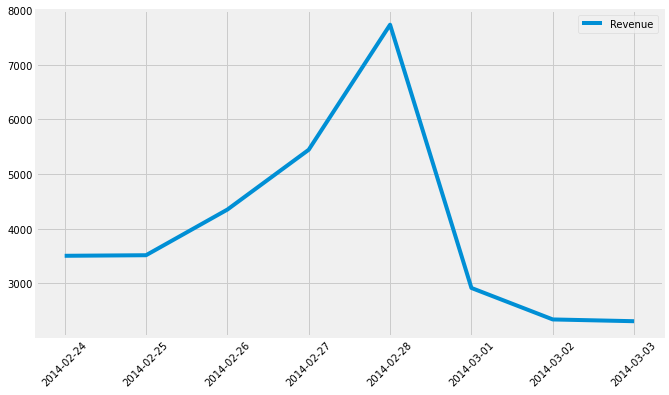

----------------------------------------------------------------------
101 ] Monthly Graph from MONDAY 2014-03-03 00:00:00 to MONDAY 2014-03-10 00:00:00


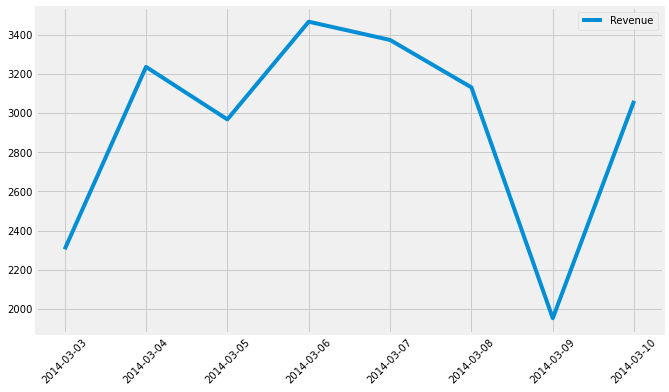

----------------------------------------------------------------------
102 ] Monthly Graph from MONDAY 2014-03-10 00:00:00 to MONDAY 2014-03-17 00:00:00


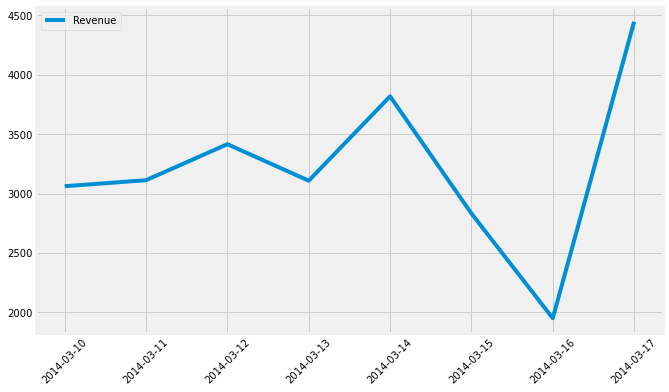

----------------------------------------------------------------------
103 ] Monthly Graph from MONDAY 2014-03-17 00:00:00 to MONDAY 2014-03-24 00:00:00


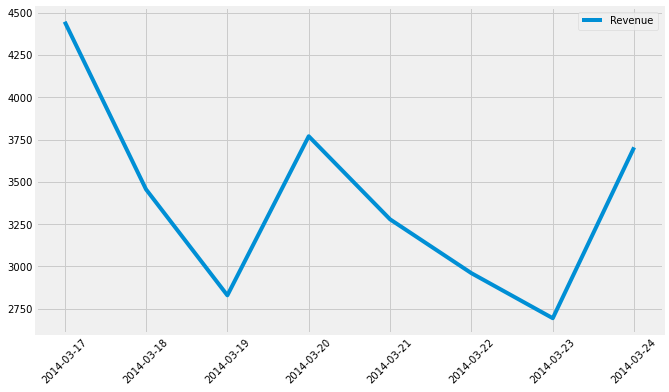

----------------------------------------------------------------------
104 ] Monthly Graph from MONDAY 2014-03-24 00:00:00 to MONDAY 2014-03-31 00:00:00


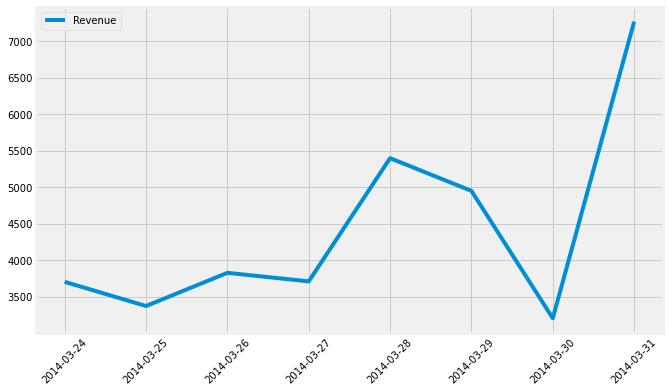

----------------------------------------------------------------------
105 ] Monthly Graph from MONDAY 2014-03-31 00:00:00 to MONDAY 2014-04-07 00:00:00


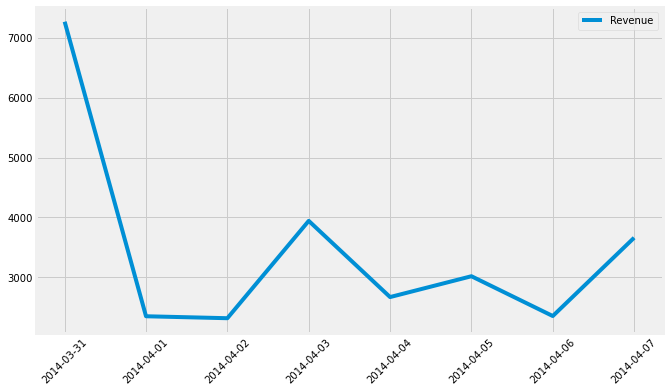

----------------------------------------------------------------------
106 ] Monthly Graph from MONDAY 2014-04-07 00:00:00 to MONDAY 2014-04-14 00:00:00


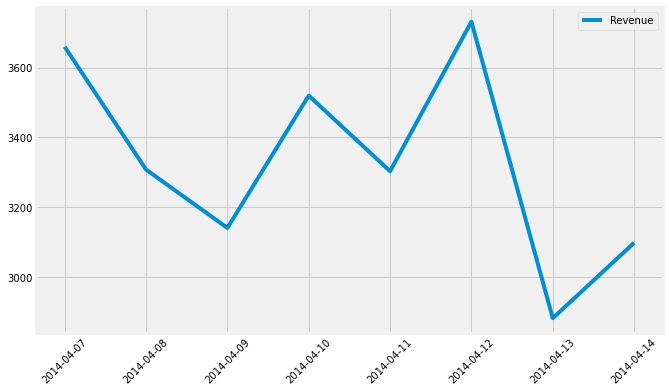

----------------------------------------------------------------------
107 ] Monthly Graph from MONDAY 2014-04-14 00:00:00 to MONDAY 2014-04-21 00:00:00


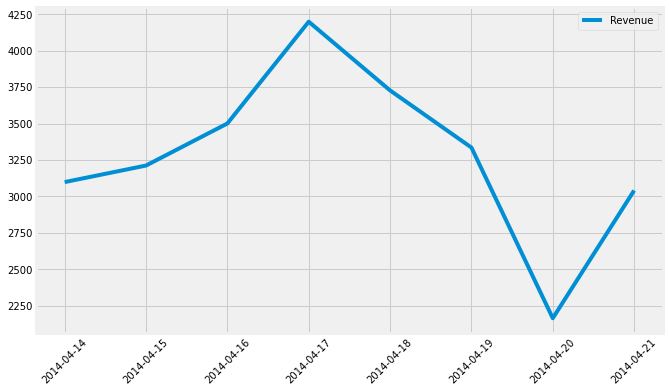

----------------------------------------------------------------------
108 ] Monthly Graph from MONDAY 2014-04-21 00:00:00 to MONDAY 2014-04-28 00:00:00


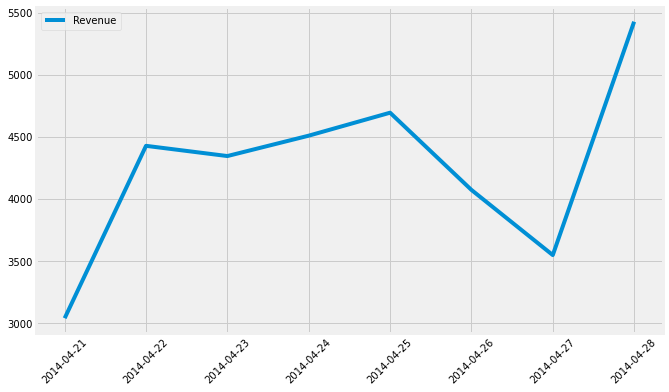

----------------------------------------------------------------------
109 ] Monthly Graph from MONDAY 2014-04-28 00:00:00 to MONDAY 2014-05-05 00:00:00


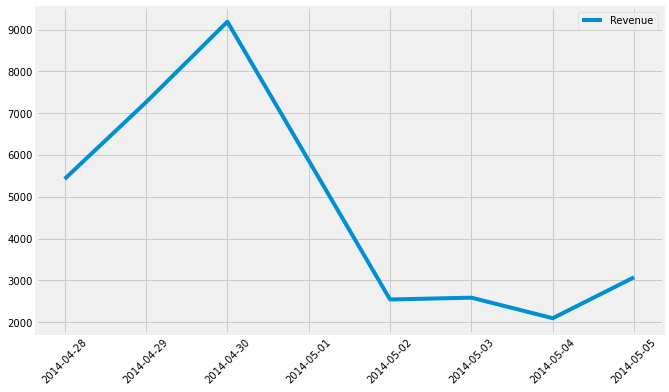

----------------------------------------------------------------------
110 ] Monthly Graph from MONDAY 2014-05-05 00:00:00 to MONDAY 2014-05-12 00:00:00


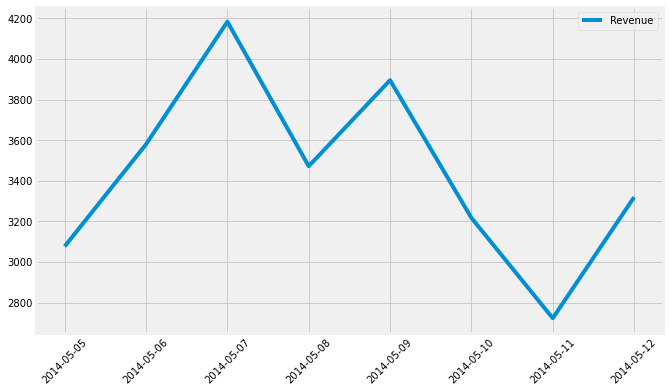

----------------------------------------------------------------------
111 ] Monthly Graph from MONDAY 2014-05-12 00:00:00 to MONDAY 2014-05-19 00:00:00


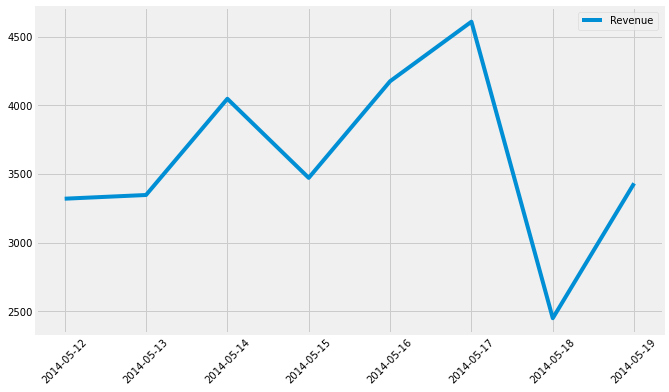

----------------------------------------------------------------------
112 ] Monthly Graph from MONDAY 2014-05-19 00:00:00 to MONDAY 2014-05-26 00:00:00


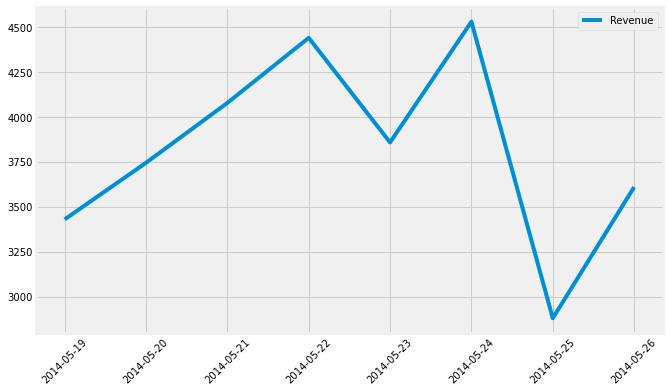

----------------------------------------------------------------------
113 ] Monthly Graph from MONDAY 2014-05-26 00:00:00 to MONDAY 2014-06-02 00:00:00


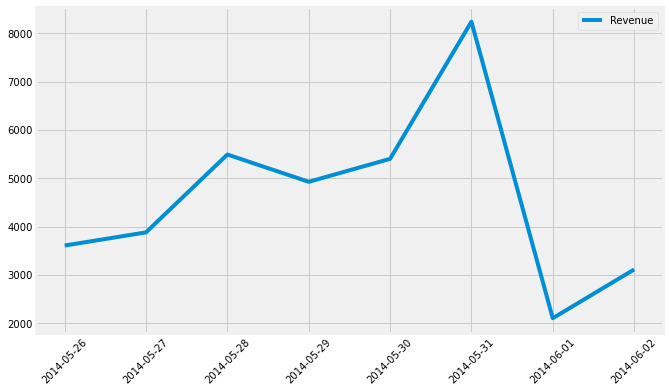

----------------------------------------------------------------------
114 ] Monthly Graph from MONDAY 2014-06-02 00:00:00 to MONDAY 2014-06-09 00:00:00


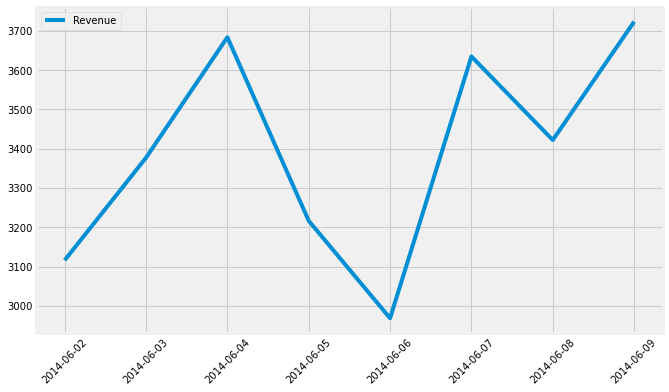

----------------------------------------------------------------------
115 ] Monthly Graph from MONDAY 2014-06-09 00:00:00 to MONDAY 2014-06-16 00:00:00


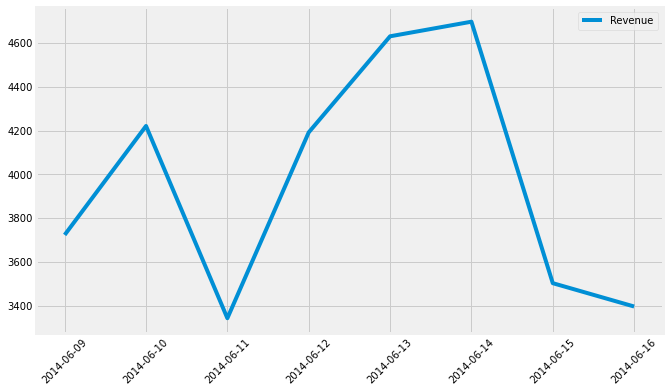

----------------------------------------------------------------------
116 ] Monthly Graph from MONDAY 2014-06-16 00:00:00 to MONDAY 2014-06-23 00:00:00


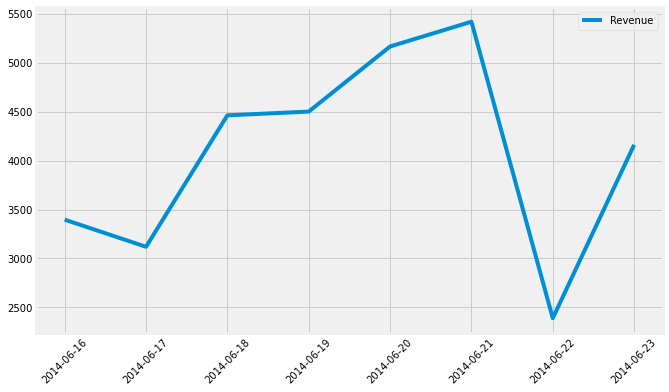

----------------------------------------------------------------------
117 ] Monthly Graph from MONDAY 2014-06-23 00:00:00 to MONDAY 2014-06-30 00:00:00


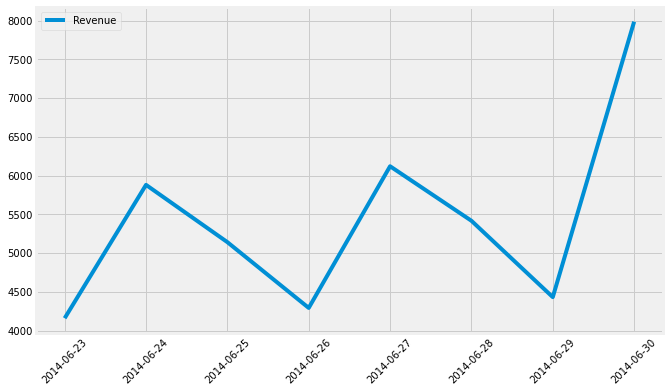

----------------------------------------------------------------------
118 ] Monthly Graph from MONDAY 2014-06-30 00:00:00 to MONDAY 2014-07-07 00:00:00


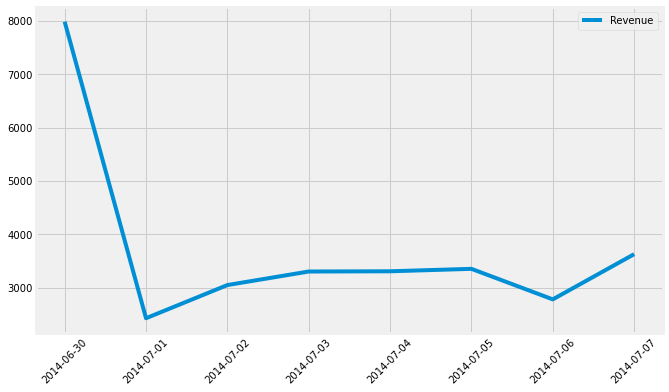

----------------------------------------------------------------------
119 ] Monthly Graph from MONDAY 2014-07-07 00:00:00 to MONDAY 2014-07-14 00:00:00


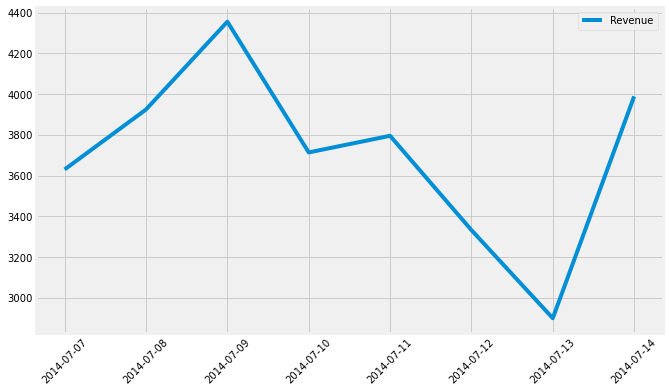

----------------------------------------------------------------------
120 ] Monthly Graph from MONDAY 2014-07-14 00:00:00 to MONDAY 2014-07-21 00:00:00


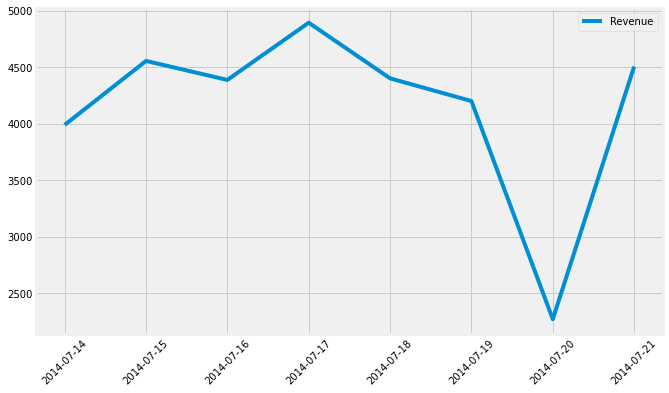

----------------------------------------------------------------------
121 ] Monthly Graph from MONDAY 2014-07-21 00:00:00 to MONDAY 2014-07-28 00:00:00


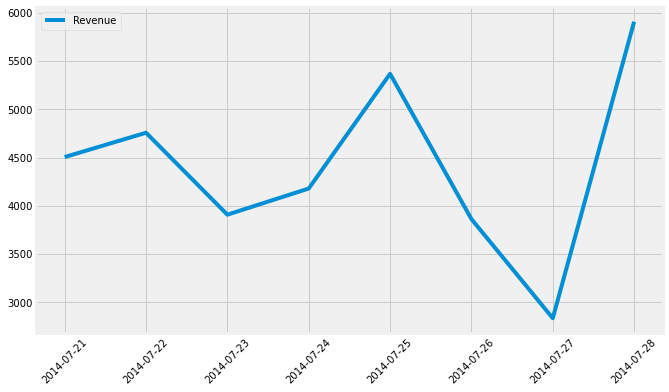

----------------------------------------------------------------------
122 ] Monthly Graph from MONDAY 2014-07-28 00:00:00 to MONDAY 2014-08-04 00:00:00


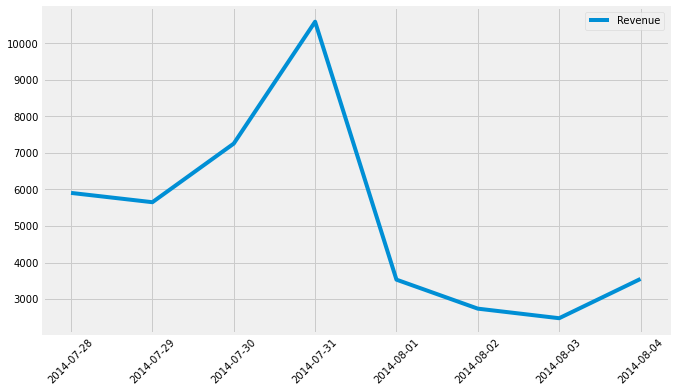

----------------------------------------------------------------------
123 ] Monthly Graph from MONDAY 2014-08-04 00:00:00 to MONDAY 2014-08-11 00:00:00


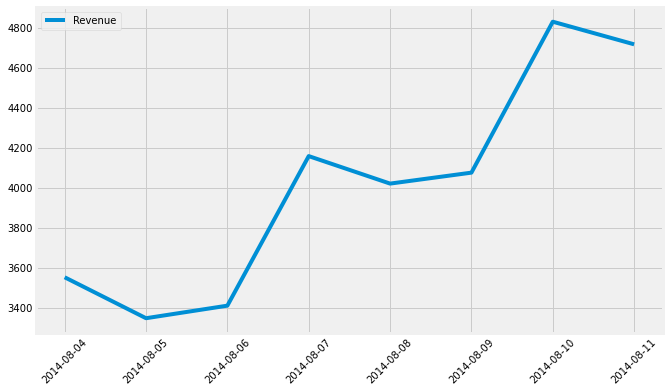

----------------------------------------------------------------------
124 ] Monthly Graph from MONDAY 2014-08-11 00:00:00 to MONDAY 2014-08-18 00:00:00


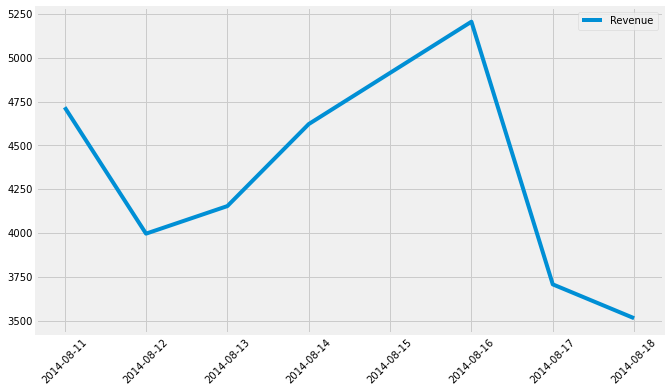

----------------------------------------------------------------------
125 ] Monthly Graph from MONDAY 2014-08-18 00:00:00 to MONDAY 2014-08-25 00:00:00


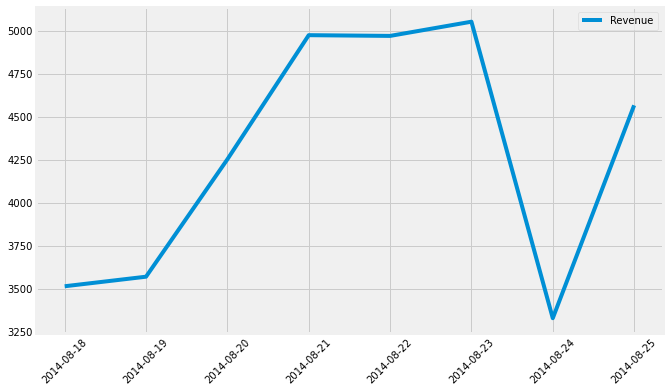

----------------------------------------------------------------------
126 ] Monthly Graph from MONDAY 2014-08-25 00:00:00 to MONDAY 2014-09-01 00:00:00


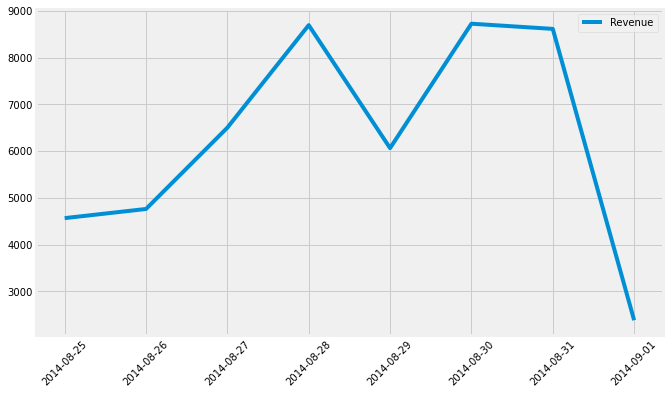

----------------------------------------------------------------------
127 ] Monthly Graph from MONDAY 2014-09-01 00:00:00 to MONDAY 2014-09-08 00:00:00


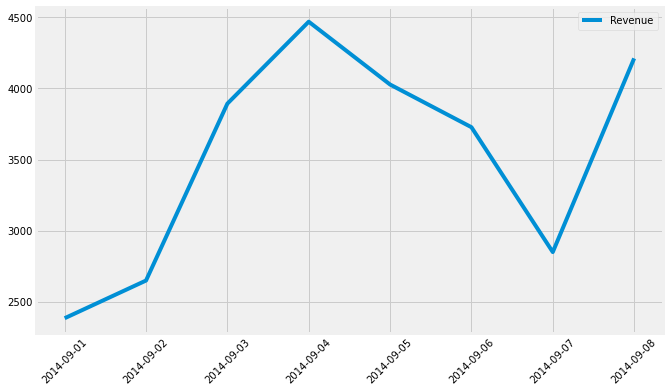

----------------------------------------------------------------------
128 ] Monthly Graph from MONDAY 2014-09-08 00:00:00 to MONDAY 2014-09-15 00:00:00


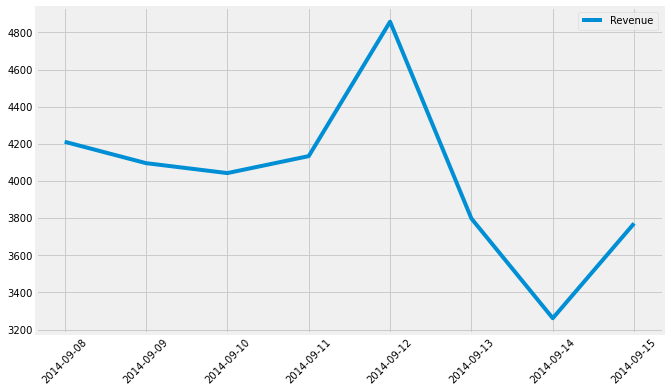

----------------------------------------------------------------------
129 ] Monthly Graph from MONDAY 2014-09-15 00:00:00 to MONDAY 2014-09-22 00:00:00


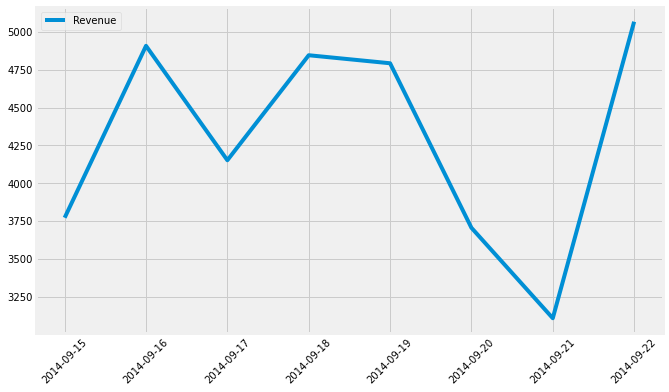

----------------------------------------------------------------------
130 ] Monthly Graph from MONDAY 2014-09-22 00:00:00 to MONDAY 2014-09-29 00:00:00


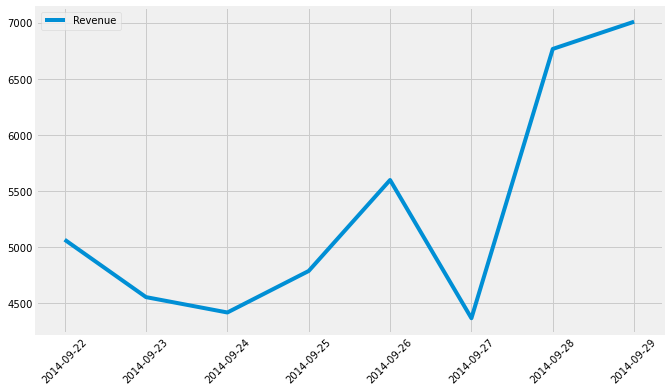

----------------------------------------------------------------------
131 ] Monthly Graph from MONDAY 2014-09-29 00:00:00 to MONDAY 2014-10-06 00:00:00


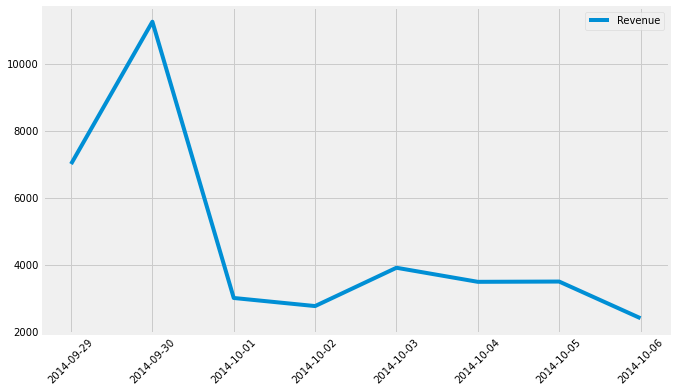

----------------------------------------------------------------------
132 ] Monthly Graph from MONDAY 2014-10-06 00:00:00 to MONDAY 2014-10-13 00:00:00


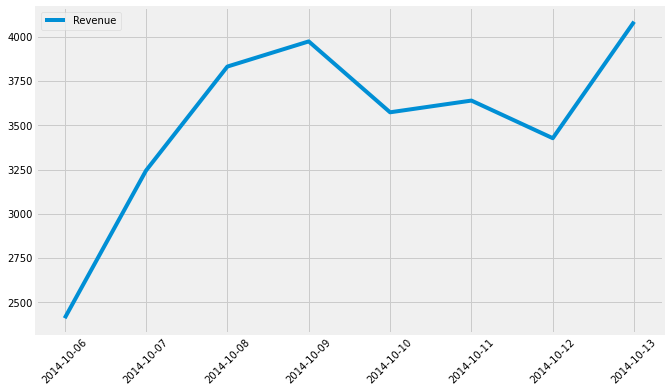

----------------------------------------------------------------------
133 ] Monthly Graph from MONDAY 2014-10-13 00:00:00 to MONDAY 2014-10-20 00:00:00


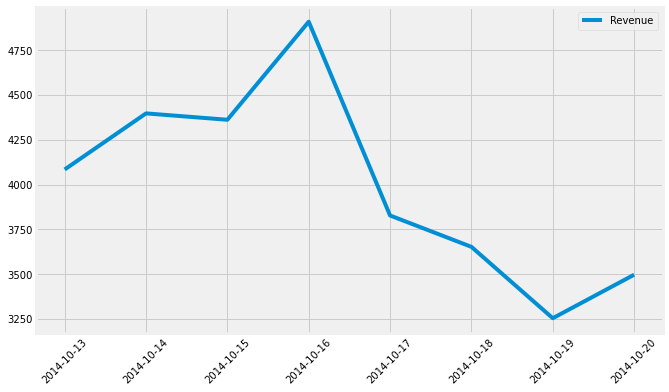

----------------------------------------------------------------------
134 ] Monthly Graph from MONDAY 2014-10-20 00:00:00 to MONDAY 2014-10-27 00:00:00


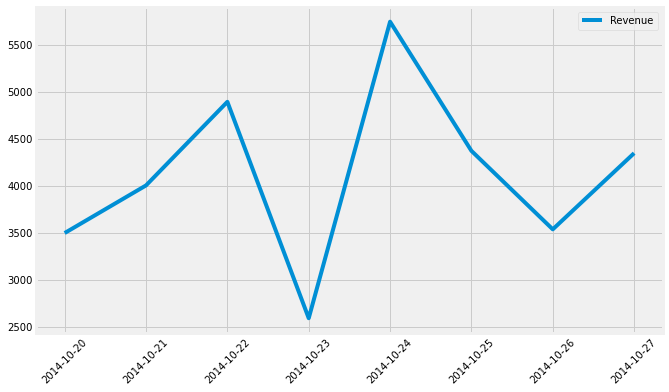

----------------------------------------------------------------------
135 ] Monthly Graph from MONDAY 2014-10-27 00:00:00 to MONDAY 2014-11-03 00:00:00


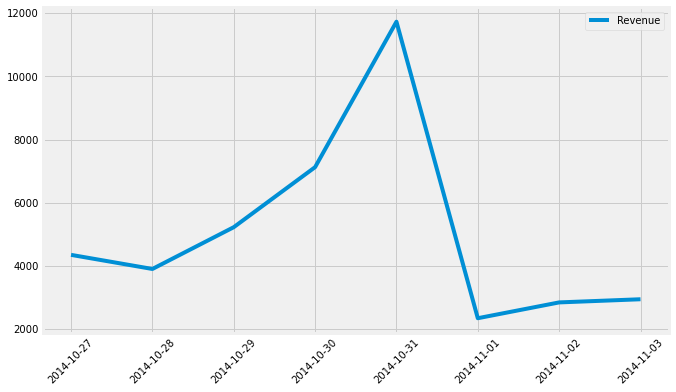

----------------------------------------------------------------------
136 ] Monthly Graph from MONDAY 2014-11-03 00:00:00 to MONDAY 2014-11-10 00:00:00


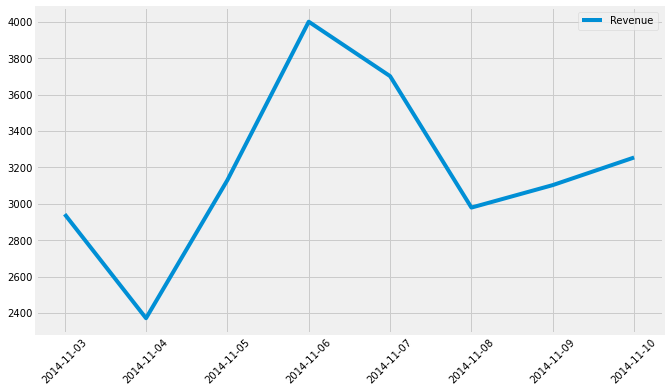

----------------------------------------------------------------------
137 ] Monthly Graph from MONDAY 2014-11-10 00:00:00 to MONDAY 2014-11-17 00:00:00


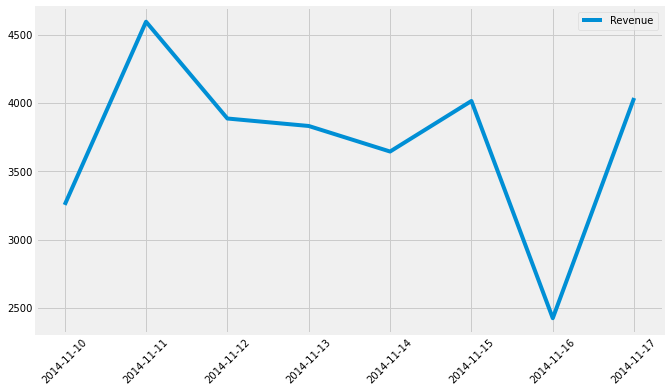

----------------------------------------------------------------------
138 ] Monthly Graph from MONDAY 2014-11-17 00:00:00 to MONDAY 2014-11-24 00:00:00


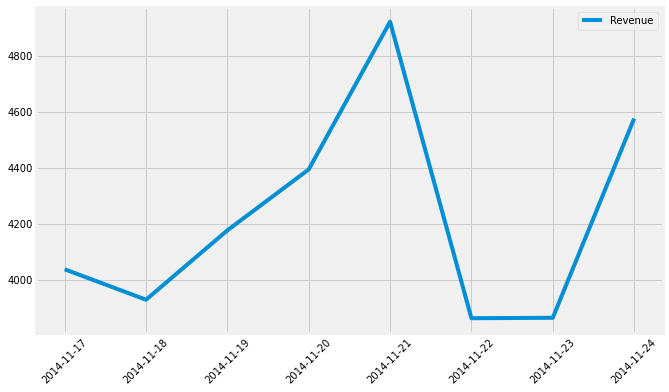

----------------------------------------------------------------------
139 ] Monthly Graph from MONDAY 2014-11-24 00:00:00 to MONDAY 2014-12-01 00:00:00


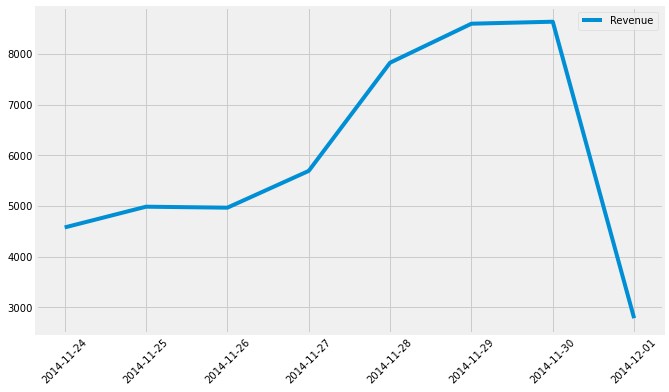

----------------------------------------------------------------------
140 ] Monthly Graph from MONDAY 2014-12-01 00:00:00 to MONDAY 2014-12-08 00:00:00


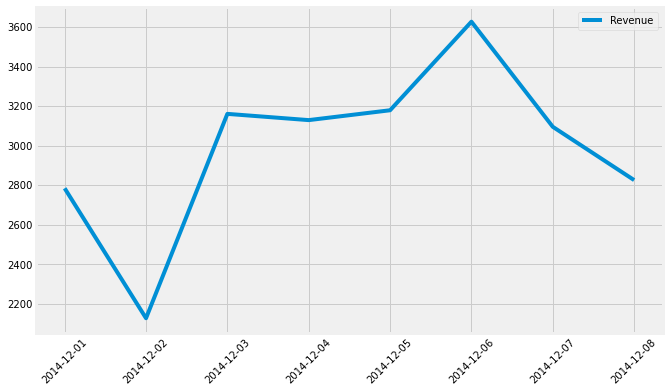

----------------------------------------------------------------------
141 ] Monthly Graph from MONDAY 2014-12-08 00:00:00 to MONDAY 2014-12-15 00:00:00


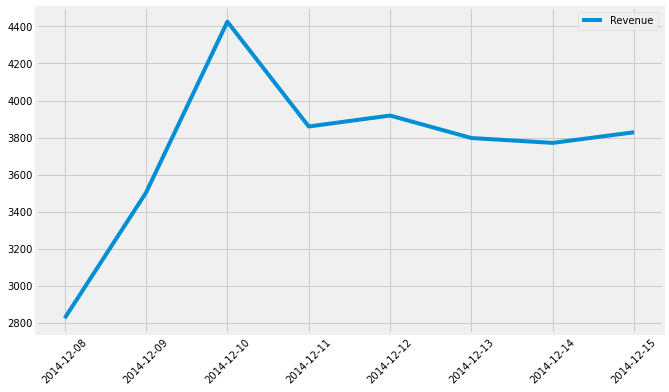

----------------------------------------------------------------------
142 ] Monthly Graph from MONDAY 2014-12-15 00:00:00 to MONDAY 2014-12-22 00:00:00


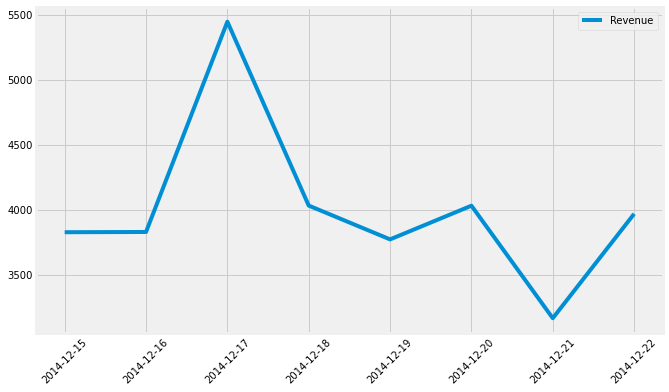

----------------------------------------------------------------------
143 ] Monthly Graph from MONDAY 2014-12-22 00:00:00 to MONDAY 2014-12-29 00:00:00


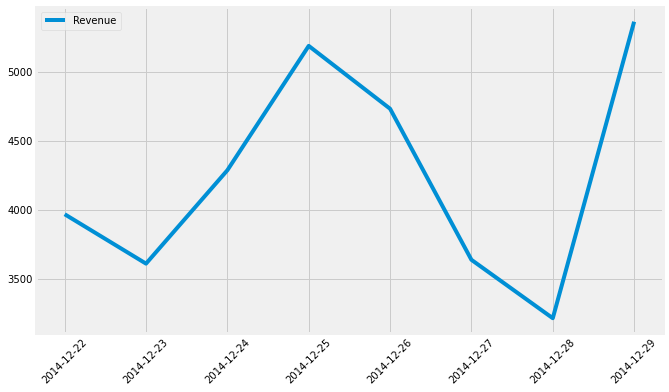

----------------------------------------------------------------------
144 ] Monthly Graph from MONDAY 2014-12-29 00:00:00 to MONDAY 2015-01-05 00:00:00


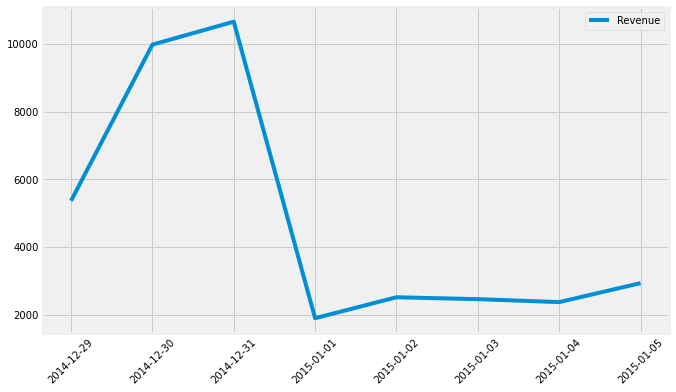

----------------------------------------------------------------------
145 ] Monthly Graph from MONDAY 2015-01-05 00:00:00 to MONDAY 2015-01-12 00:00:00


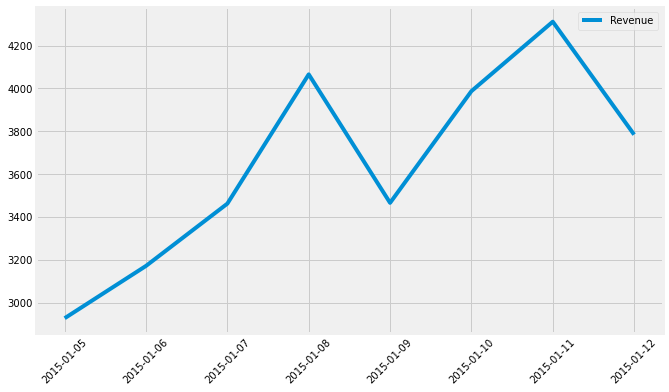

----------------------------------------------------------------------
146 ] Monthly Graph from MONDAY 2015-01-12 00:00:00 to MONDAY 2015-01-19 00:00:00


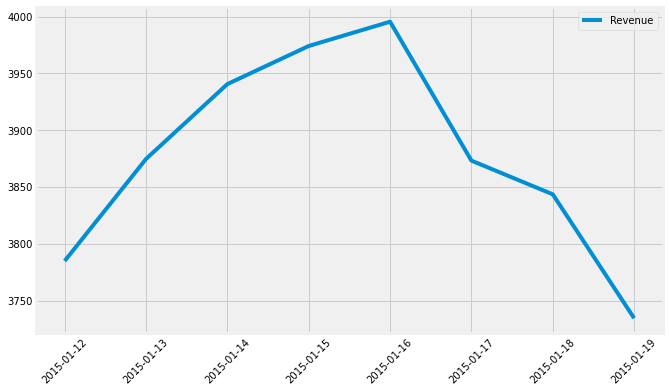

----------------------------------------------------------------------
147 ] Monthly Graph from MONDAY 2015-01-19 00:00:00 to MONDAY 2015-01-26 00:00:00


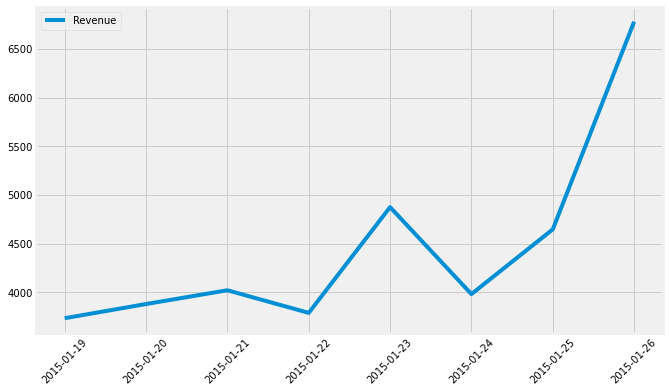

----------------------------------------------------------------------
148 ] Monthly Graph from MONDAY 2015-01-26 00:00:00 to MONDAY 2015-02-02 00:00:00


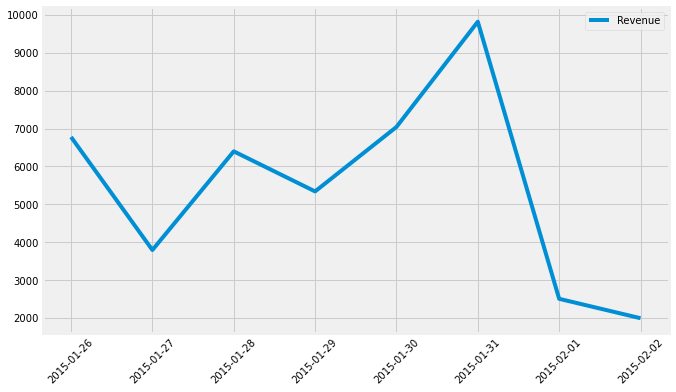

----------------------------------------------------------------------
149 ] Monthly Graph from MONDAY 2015-02-02 00:00:00 to MONDAY 2015-02-09 00:00:00


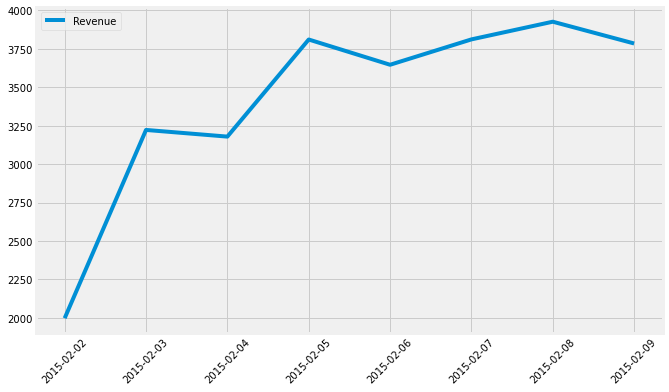

----------------------------------------------------------------------
150 ] Monthly Graph from MONDAY 2015-02-09 00:00:00 to MONDAY 2015-02-16 00:00:00


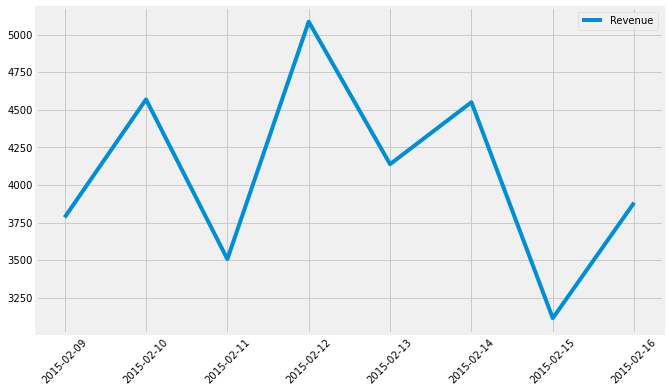

----------------------------------------------------------------------
151 ] Monthly Graph from MONDAY 2015-02-16 00:00:00 to MONDAY 2015-02-23 00:00:00


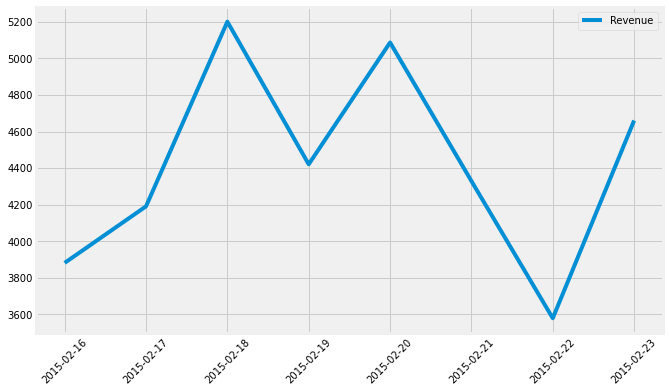

----------------------------------------------------------------------
152 ] Monthly Graph from MONDAY 2015-02-23 00:00:00 to MONDAY 2015-03-02 00:00:00


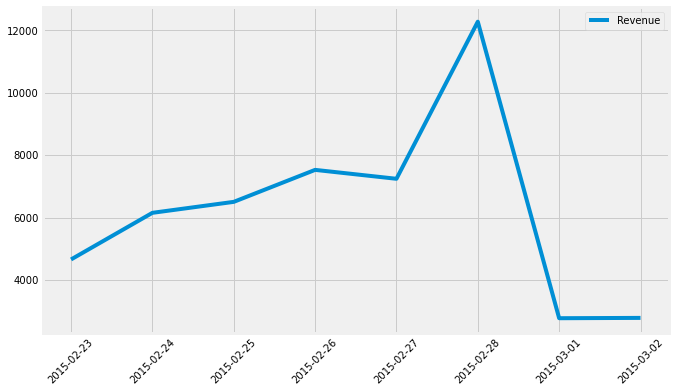

----------------------------------------------------------------------
153 ] Monthly Graph from MONDAY 2015-03-02 00:00:00 to MONDAY 2015-03-09 00:00:00


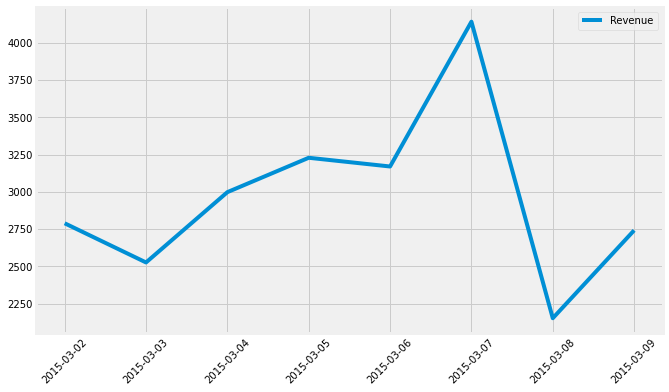

----------------------------------------------------------------------
154 ] Monthly Graph from MONDAY 2015-03-09 00:00:00 to MONDAY 2015-03-16 00:00:00


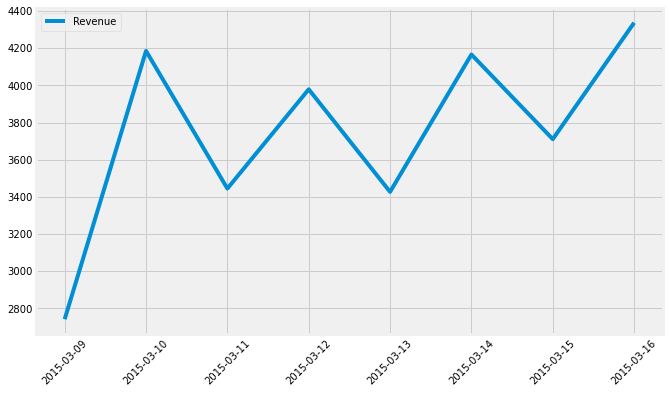

----------------------------------------------------------------------
155 ] Monthly Graph from MONDAY 2015-03-16 00:00:00 to MONDAY 2015-03-23 00:00:00


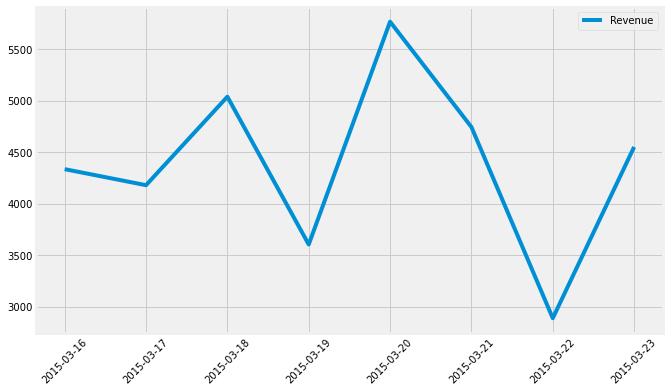

----------------------------------------------------------------------
156 ] Monthly Graph from MONDAY 2015-03-23 00:00:00 to MONDAY 2015-03-30 00:00:00


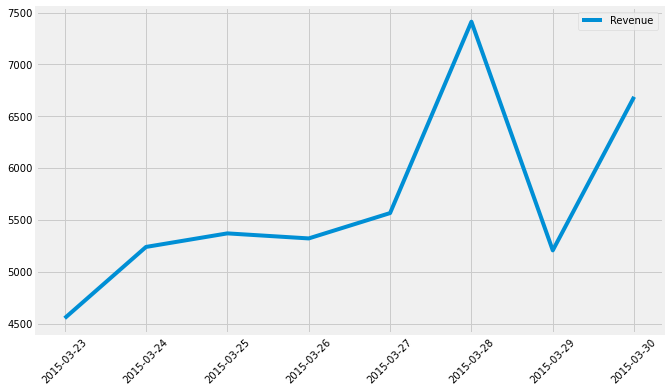

----------------------------------------------------------------------
157 ] Monthly Graph from MONDAY 2015-03-30 00:00:00 to MONDAY 2015-04-06 00:00:00


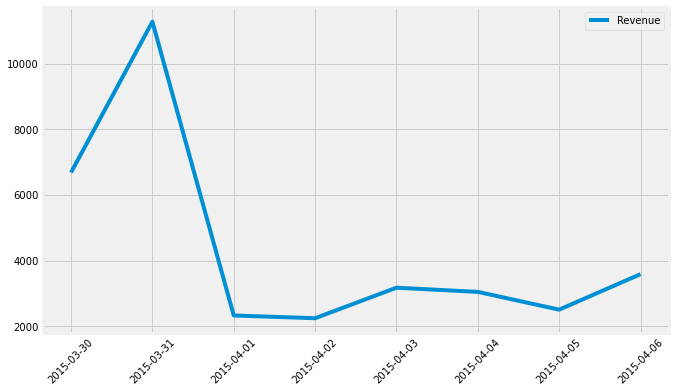

----------------------------------------------------------------------
158 ] Monthly Graph from MONDAY 2015-04-06 00:00:00 to MONDAY 2015-04-13 00:00:00


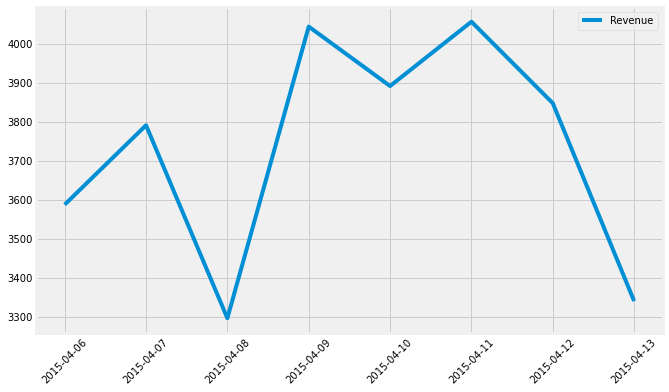

----------------------------------------------------------------------
159 ] Monthly Graph from MONDAY 2015-04-13 00:00:00 to MONDAY 2015-04-20 00:00:00


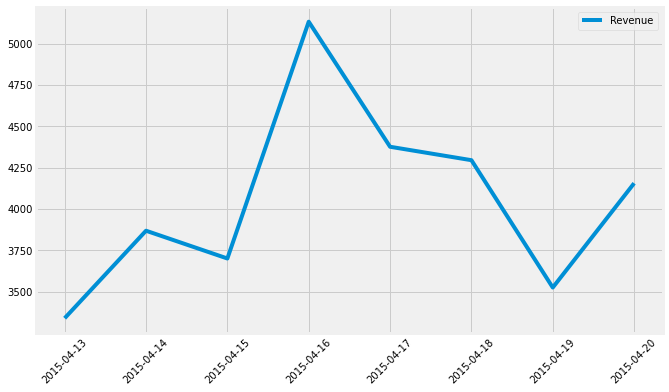

----------------------------------------------------------------------
160 ] Monthly Graph from MONDAY 2015-04-20 00:00:00 to MONDAY 2015-04-27 00:00:00


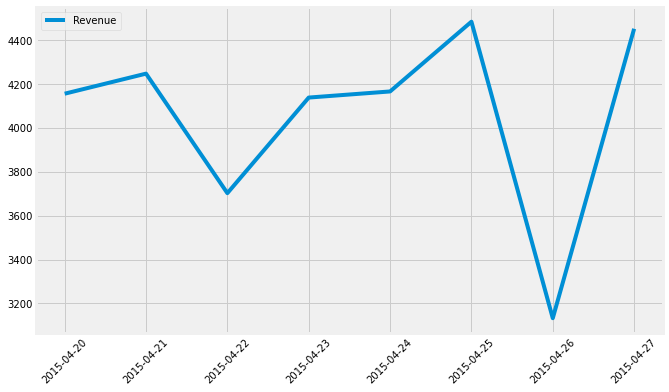

----------------------------------------------------------------------
161 ] Monthly Graph from MONDAY 2015-04-27 00:00:00 to MONDAY 2015-05-04 00:00:00


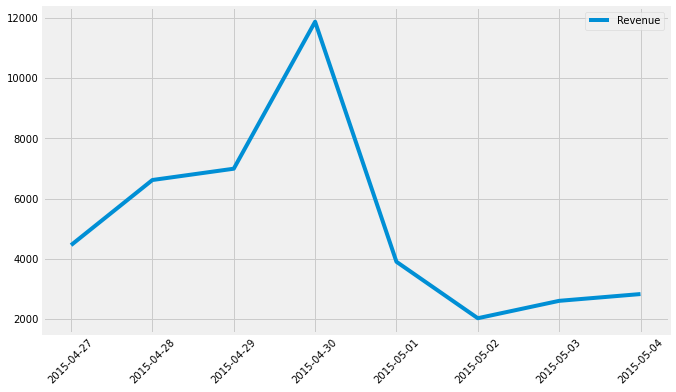

----------------------------------------------------------------------
162 ] Monthly Graph from MONDAY 2015-05-04 00:00:00 to MONDAY 2015-05-11 00:00:00


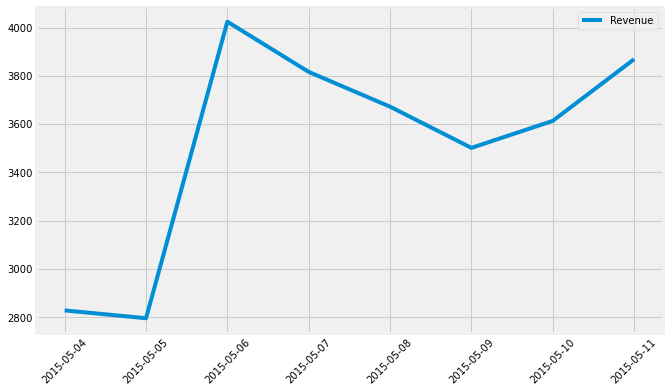

----------------------------------------------------------------------
163 ] Monthly Graph from MONDAY 2015-05-11 00:00:00 to MONDAY 2015-05-18 00:00:00


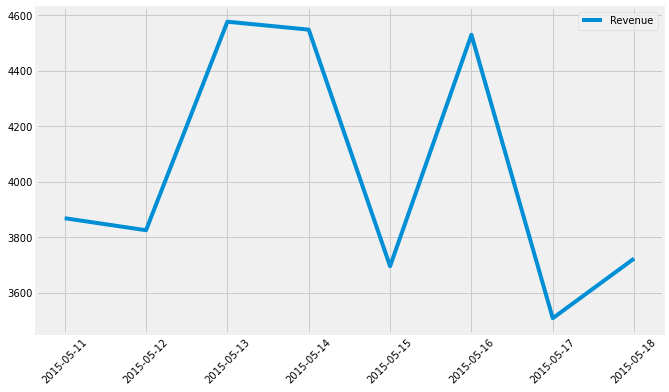

----------------------------------------------------------------------
164 ] Monthly Graph from MONDAY 2015-05-18 00:00:00 to MONDAY 2015-05-25 00:00:00


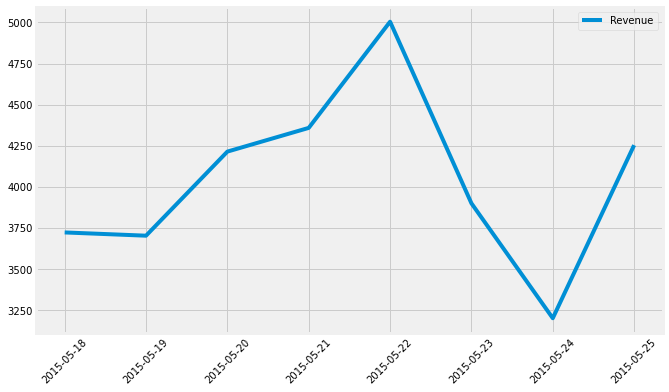

----------------------------------------------------------------------
165 ] Monthly Graph from MONDAY 2015-05-25 00:00:00 to MONDAY 2015-06-01 00:00:00


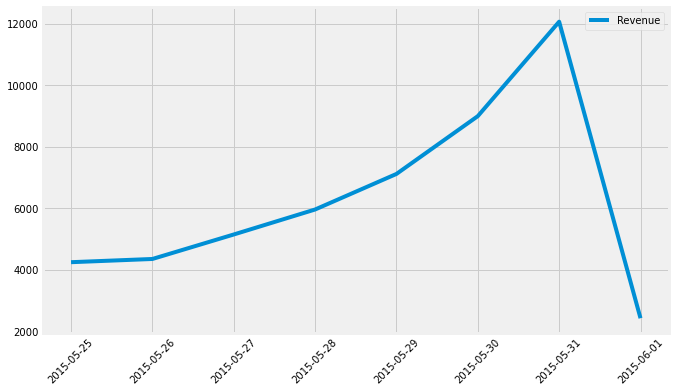

----------------------------------------------------------------------
166 ] Monthly Graph from MONDAY 2015-06-01 00:00:00 to MONDAY 2015-06-08 00:00:00


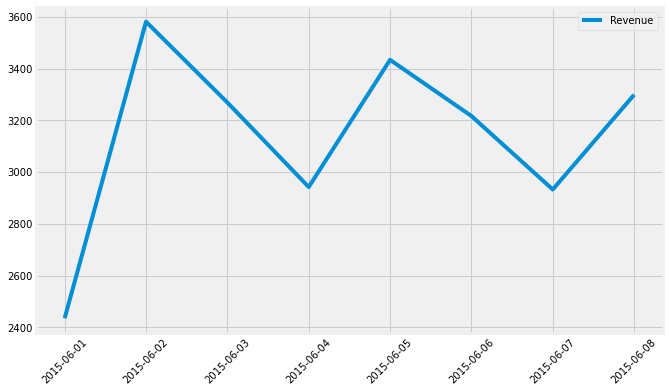

----------------------------------------------------------------------
167 ] Monthly Graph from MONDAY 2015-06-08 00:00:00 to MONDAY 2015-06-15 00:00:00


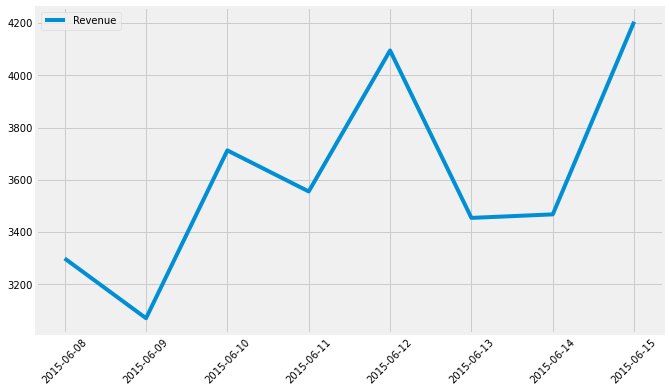

----------------------------------------------------------------------
168 ] Monthly Graph from MONDAY 2015-06-15 00:00:00 to MONDAY 2015-06-22 00:00:00


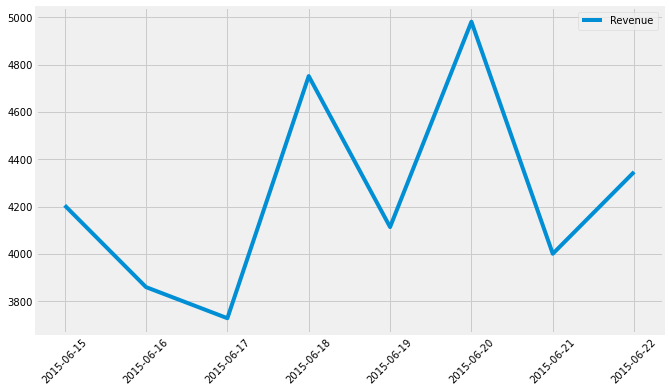

----------------------------------------------------------------------
169 ] Monthly Graph from MONDAY 2015-06-22 00:00:00 to MONDAY 2015-06-29 00:00:00


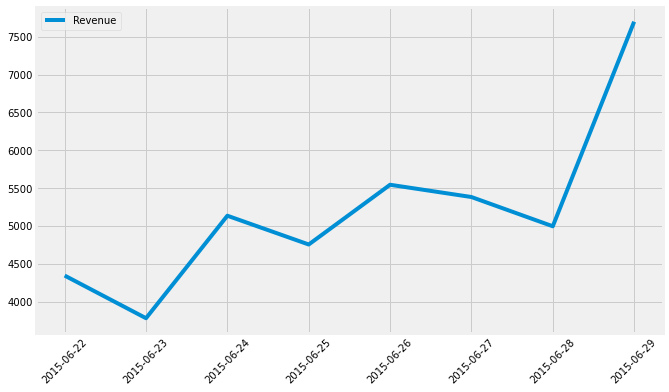

----------------------------------------------------------------------
170 ] Monthly Graph from MONDAY 2015-06-29 00:00:00 to MONDAY 2015-07-06 00:00:00


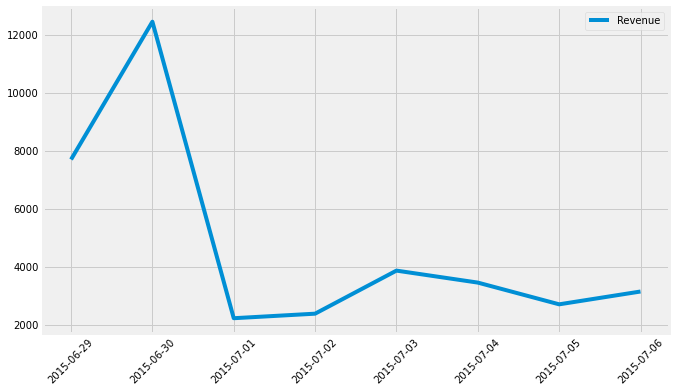

----------------------------------------------------------------------
171 ] Monthly Graph from MONDAY 2015-07-06 00:00:00 to MONDAY 2015-07-13 00:00:00


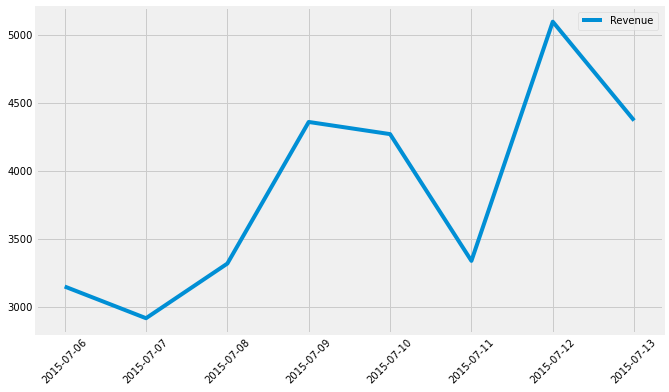

----------------------------------------------------------------------
172 ] Monthly Graph from MONDAY 2015-07-13 00:00:00 to MONDAY 2015-07-20 00:00:00


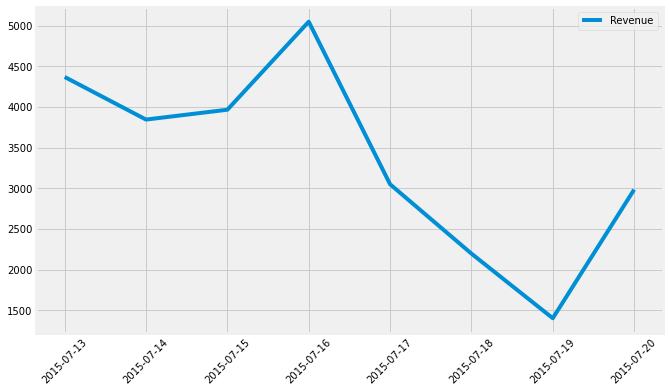

----------------------------------------------------------------------
173 ] Monthly Graph from MONDAY 2015-07-20 00:00:00 to MONDAY 2015-07-27 00:00:00


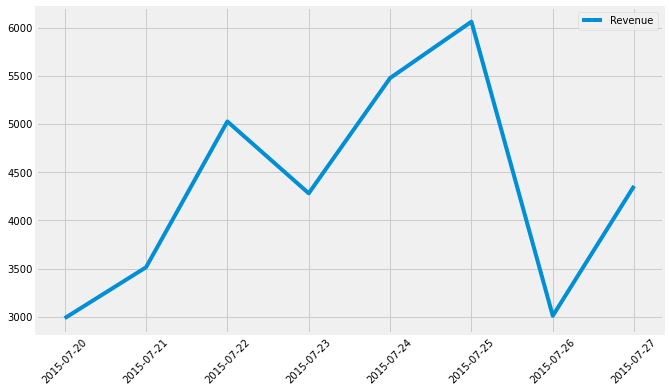

----------------------------------------------------------------------
174 ] Monthly Graph from MONDAY 2015-07-27 00:00:00 to MONDAY 2015-08-03 00:00:00


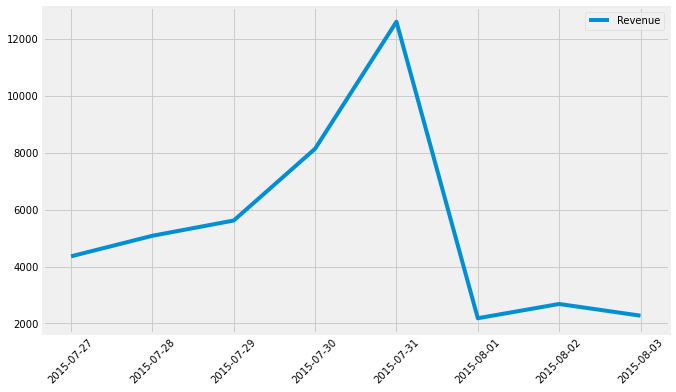

----------------------------------------------------------------------
175 ] Monthly Graph from MONDAY 2015-08-03 00:00:00 to MONDAY 2015-08-10 00:00:00


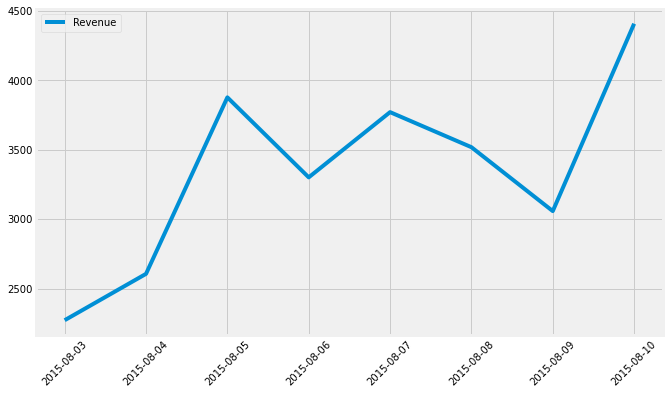

----------------------------------------------------------------------
176 ] Monthly Graph from MONDAY 2015-08-10 00:00:00 to MONDAY 2015-08-17 00:00:00


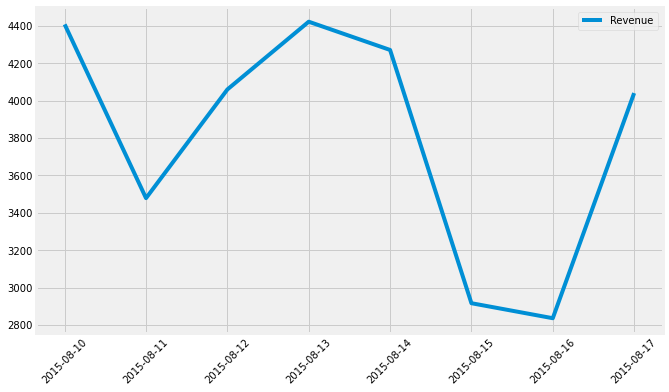

----------------------------------------------------------------------
177 ] Monthly Graph from MONDAY 2015-08-17 00:00:00 to MONDAY 2015-08-24 00:00:00


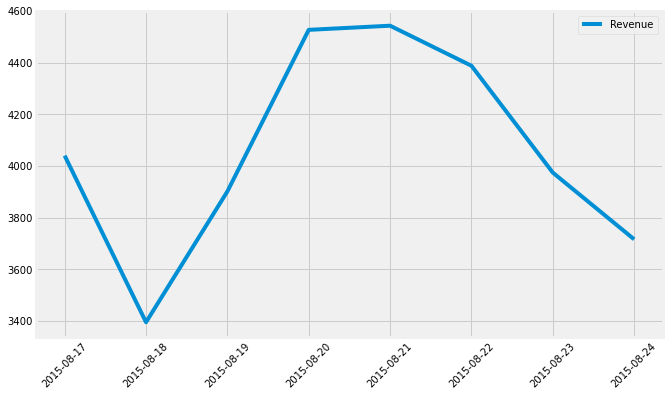

----------------------------------------------------------------------
178 ] Monthly Graph from MONDAY 2015-08-24 00:00:00 to MONDAY 2015-08-31 00:00:00


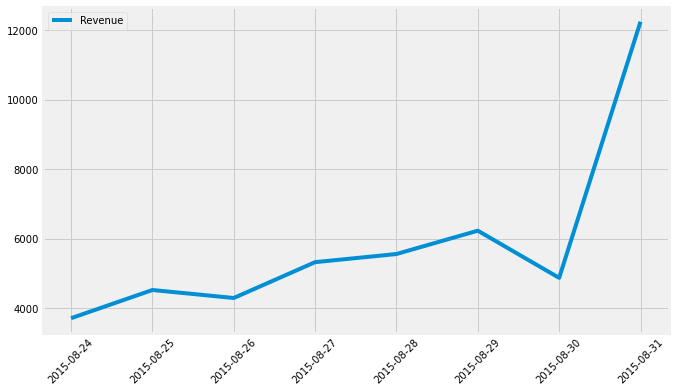

----------------------------------------------------------------------
179 ] Monthly Graph from MONDAY 2015-08-31 00:00:00 to MONDAY 2015-09-07 00:00:00


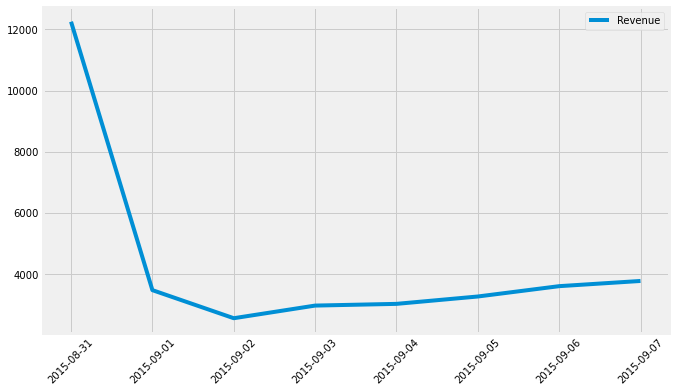

----------------------------------------------------------------------
180 ] Monthly Graph from MONDAY 2015-09-07 00:00:00 to MONDAY 2015-09-14 00:00:00


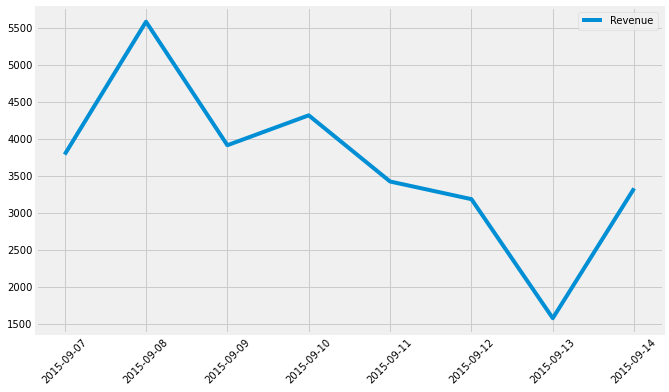

----------------------------------------------------------------------
181 ] Monthly Graph from MONDAY 2015-09-14 00:00:00 to MONDAY 2015-09-21 00:00:00


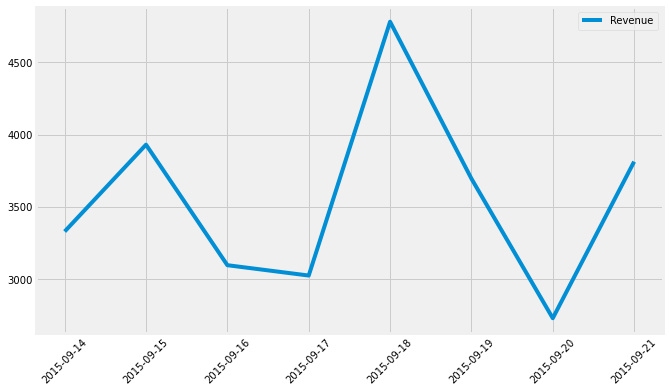

----------------------------------------------------------------------
182 ] Monthly Graph from MONDAY 2015-09-21 00:00:00 to MONDAY 2015-09-28 00:00:00


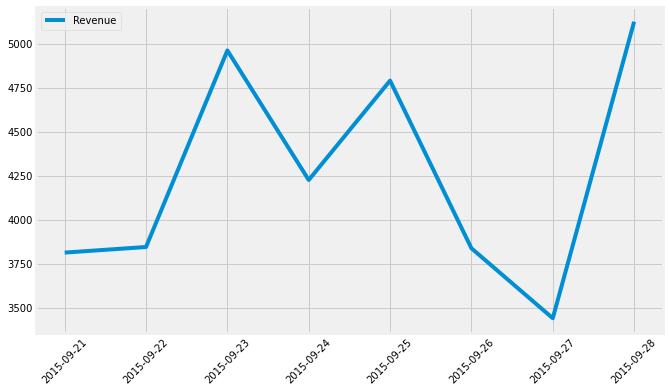

----------------------------------------------------------------------
183 ] Monthly Graph from MONDAY 2015-09-28 00:00:00 to MONDAY 2015-10-05 00:00:00


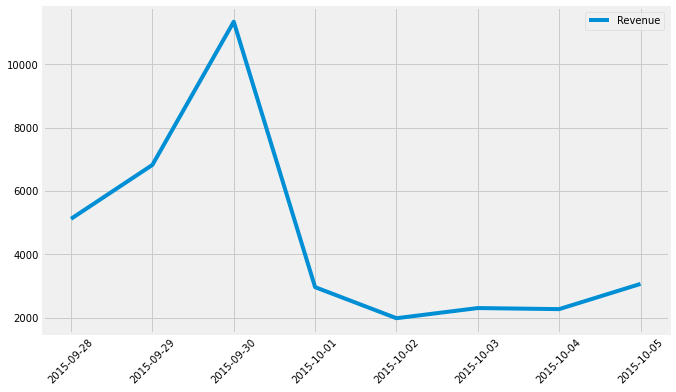

----------------------------------------------------------------------
184 ] Monthly Graph from MONDAY 2015-10-05 00:00:00 to MONDAY 2015-10-12 00:00:00


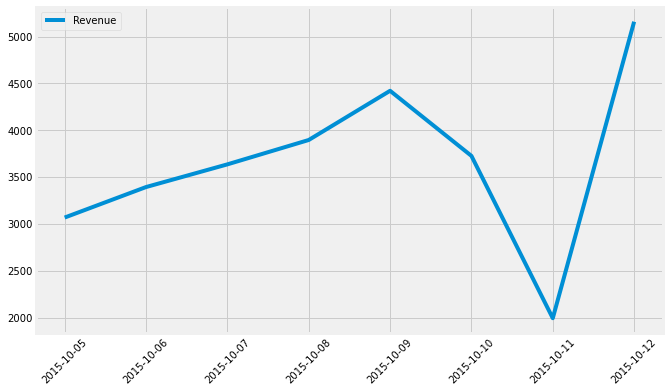

----------------------------------------------------------------------
185 ] Monthly Graph from MONDAY 2015-10-12 00:00:00 to MONDAY 2015-10-19 00:00:00


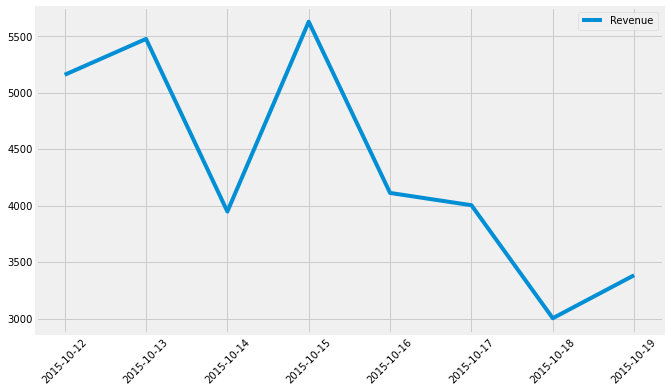

----------------------------------------------------------------------
186 ] Monthly Graph from MONDAY 2015-10-19 00:00:00 to MONDAY 2015-10-26 00:00:00


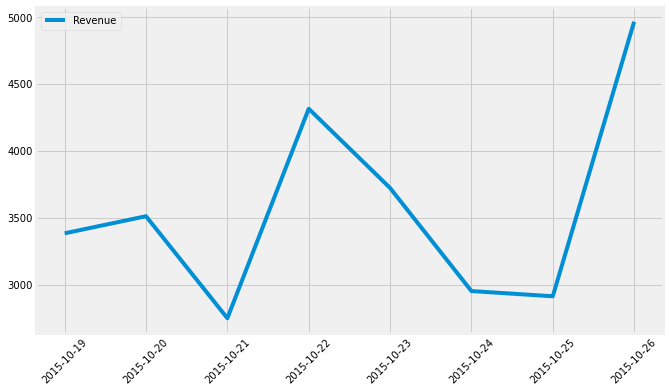

----------------------------------------------------------------------
187 ] Monthly Graph from MONDAY 2015-10-26 00:00:00 to MONDAY 2015-11-02 00:00:00


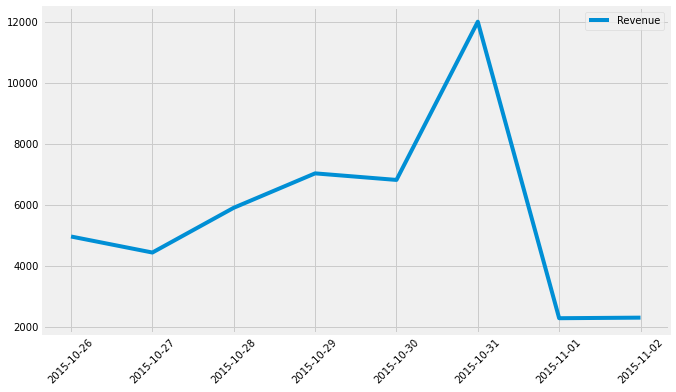

----------------------------------------------------------------------
188 ] Monthly Graph from MONDAY 2015-11-02 00:00:00 to MONDAY 2015-11-09 00:00:00


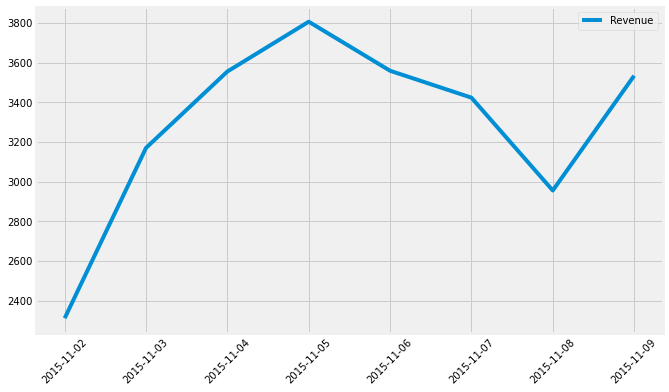

----------------------------------------------------------------------
189 ] Monthly Graph from MONDAY 2015-11-09 00:00:00 to MONDAY 2015-11-16 00:00:00


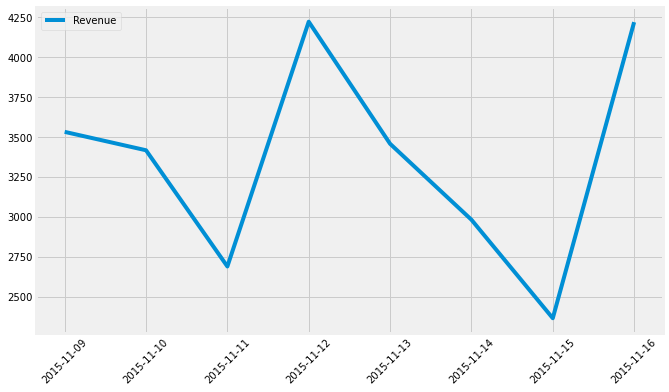

----------------------------------------------------------------------
190 ] Monthly Graph from MONDAY 2015-11-16 00:00:00 to MONDAY 2015-11-23 00:00:00


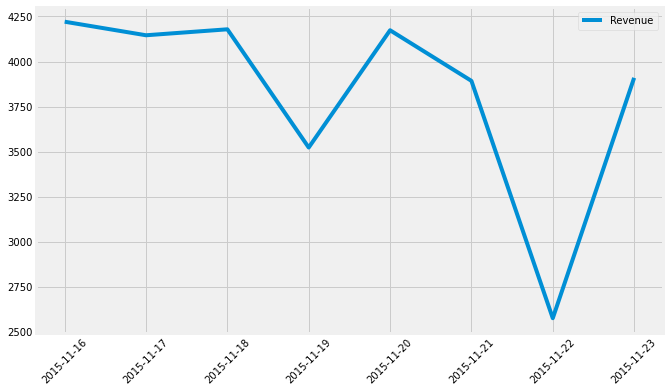

----------------------------------------------------------------------
191 ] Monthly Graph from MONDAY 2015-11-23 00:00:00 to MONDAY 2015-11-30 00:00:00


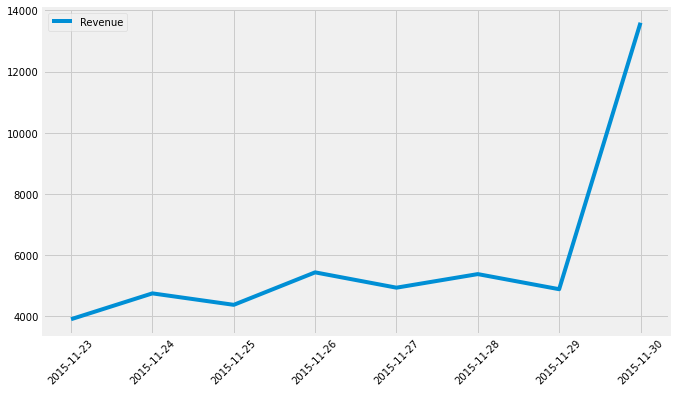

----------------------------------------------------------------------
192 ] Monthly Graph from MONDAY 2015-11-30 00:00:00 to MONDAY 2015-12-07 00:00:00


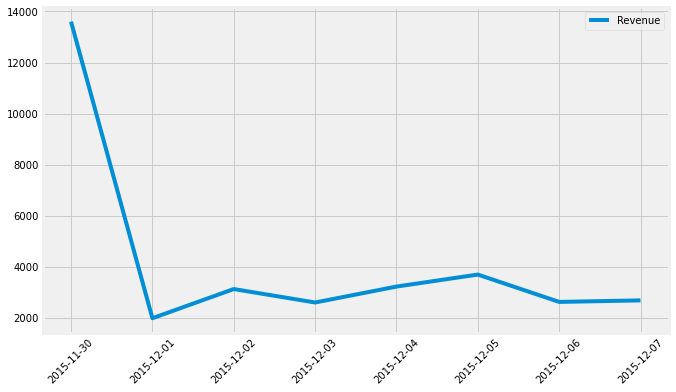

----------------------------------------------------------------------
193 ] Monthly Graph from MONDAY 2015-12-07 00:00:00 to MONDAY 2015-12-14 00:00:00


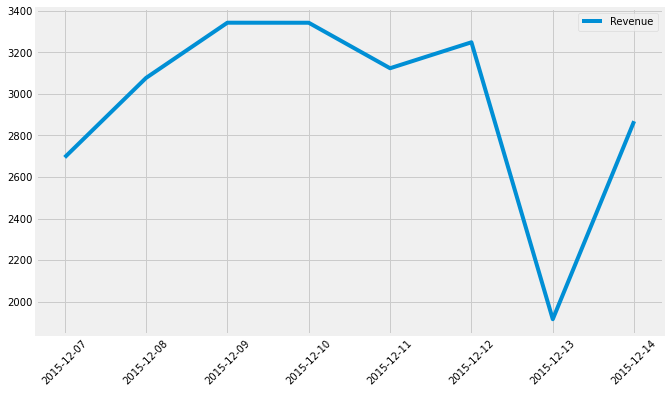

----------------------------------------------------------------------
194 ] Monthly Graph from MONDAY 2015-12-14 00:00:00 to MONDAY 2015-12-21 00:00:00


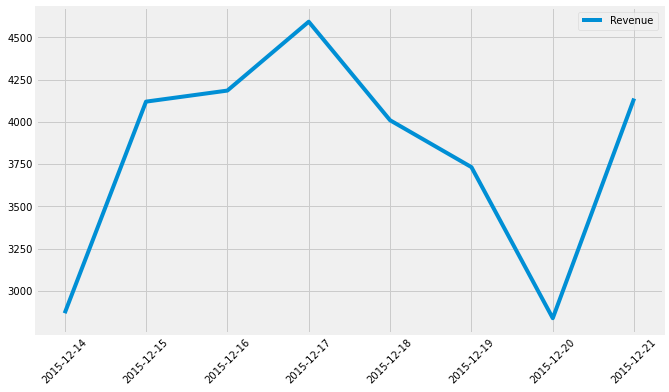

----------------------------------------------------------------------
195 ] Monthly Graph from MONDAY 2015-12-21 00:00:00 to MONDAY 2015-12-28 00:00:00


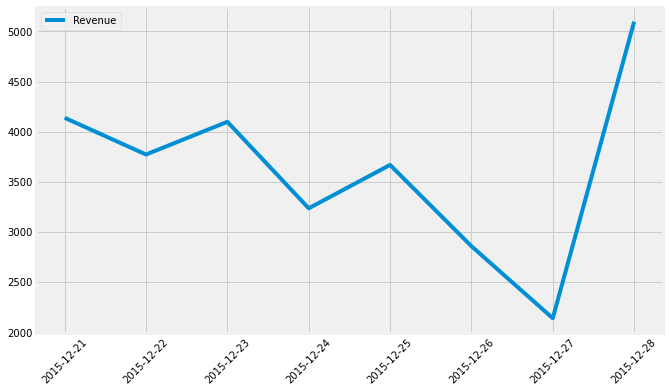

----------------------------------------------------------------------
196 ] Monthly Graph from MONDAY 2015-12-28 00:00:00 to MONDAY 2016-01-04 00:00:00


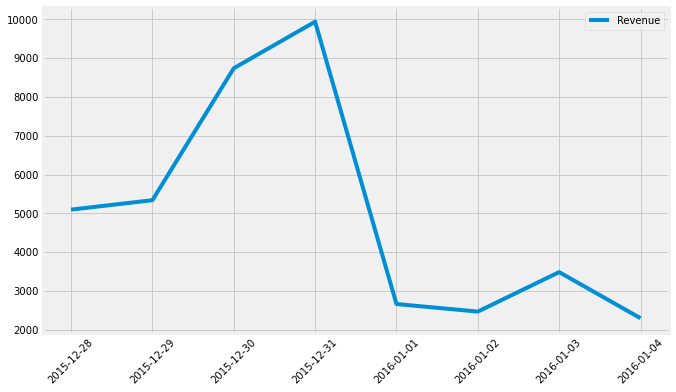

----------------------------------------------------------------------
197 ] Monthly Graph from MONDAY 2016-01-04 00:00:00 to MONDAY 2016-01-11 00:00:00


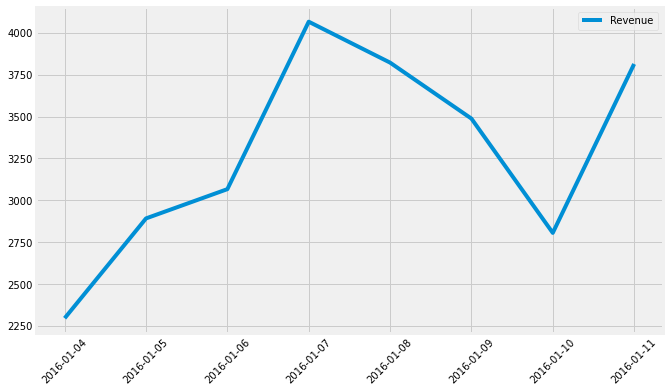

----------------------------------------------------------------------
198 ] Monthly Graph from MONDAY 2016-01-11 00:00:00 to MONDAY 2016-01-18 00:00:00


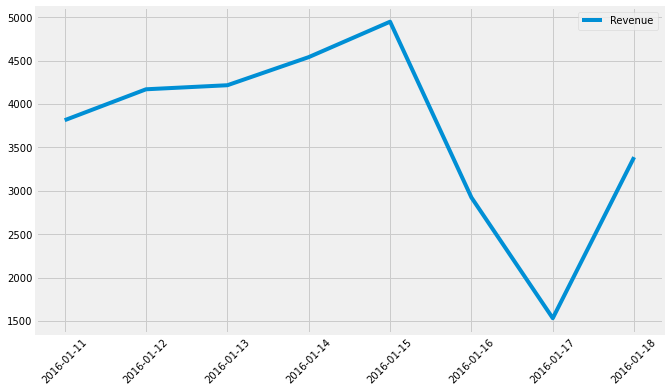

----------------------------------------------------------------------
199 ] Monthly Graph from MONDAY 2016-01-18 00:00:00 to MONDAY 2016-01-25 00:00:00


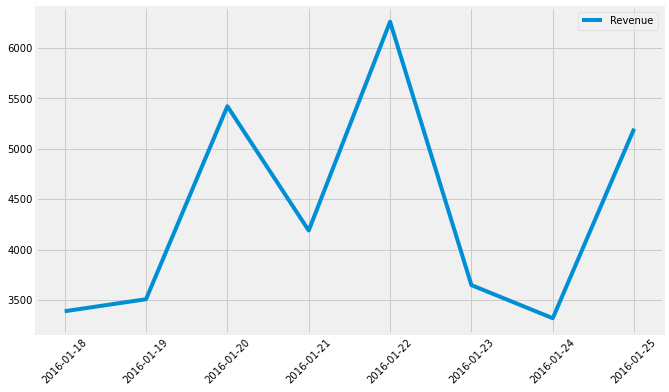

----------------------------------------------------------------------
200 ] Monthly Graph from MONDAY 2016-01-25 00:00:00 to MONDAY 2016-02-01 00:00:00


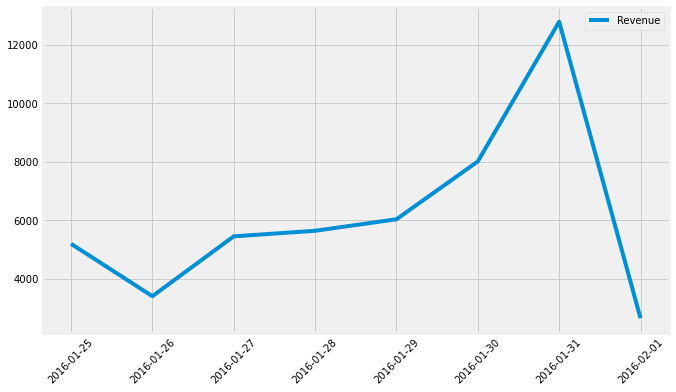

----------------------------------------------------------------------
201 ] Monthly Graph from MONDAY 2016-02-01 00:00:00 to MONDAY 2016-02-08 00:00:00


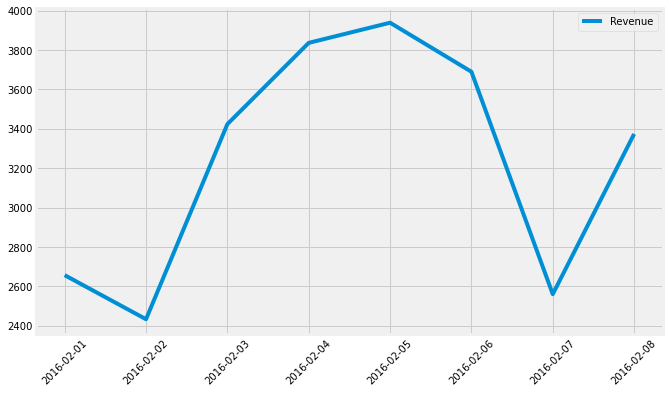

----------------------------------------------------------------------
202 ] Monthly Graph from MONDAY 2016-02-08 00:00:00 to MONDAY 2016-02-15 00:00:00


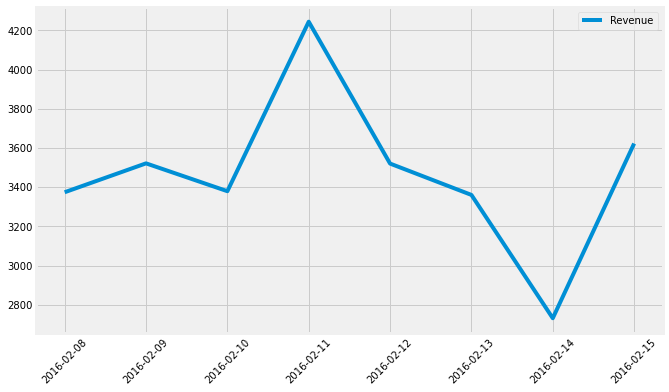

----------------------------------------------------------------------
203 ] Monthly Graph from MONDAY 2016-02-15 00:00:00 to MONDAY 2016-02-22 00:00:00


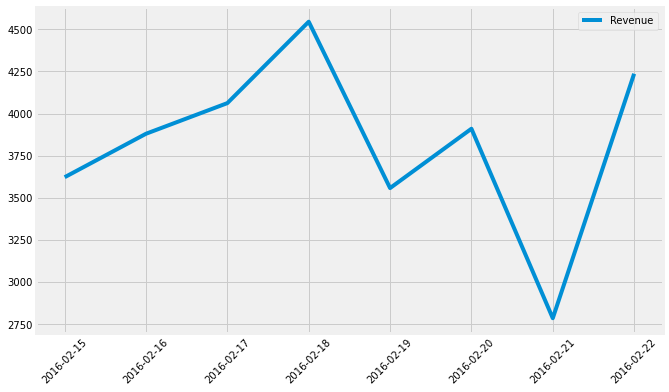

----------------------------------------------------------------------
204 ] Monthly Graph from MONDAY 2016-02-22 00:00:00 to MONDAY 2016-02-29 00:00:00


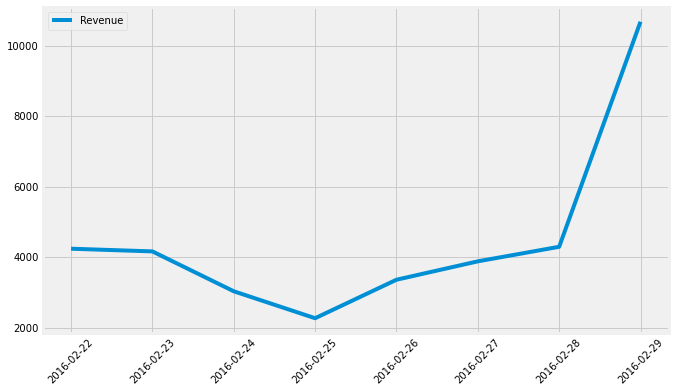

----------------------------------------------------------------------
205 ] Monthly Graph from MONDAY 2016-02-29 00:00:00 to MONDAY 2016-03-07 00:00:00


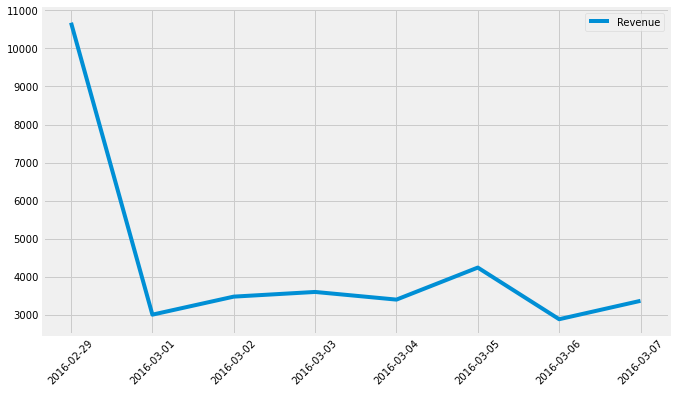

----------------------------------------------------------------------
206 ] Monthly Graph from MONDAY 2016-03-07 00:00:00 to MONDAY 2016-03-14 00:00:00


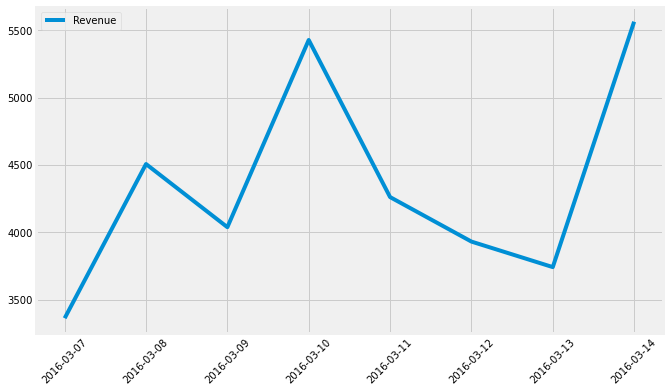

----------------------------------------------------------------------
207 ] Monthly Graph from MONDAY 2016-03-14 00:00:00 to MONDAY 2016-03-21 00:00:00


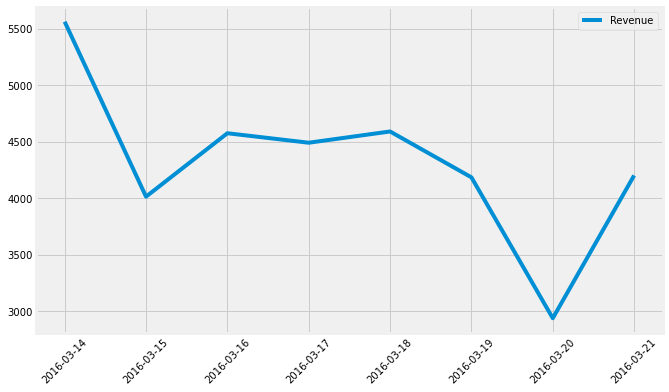

----------------------------------------------------------------------
208 ] Monthly Graph from MONDAY 2016-03-21 00:00:00 to MONDAY 2016-03-28 00:00:00


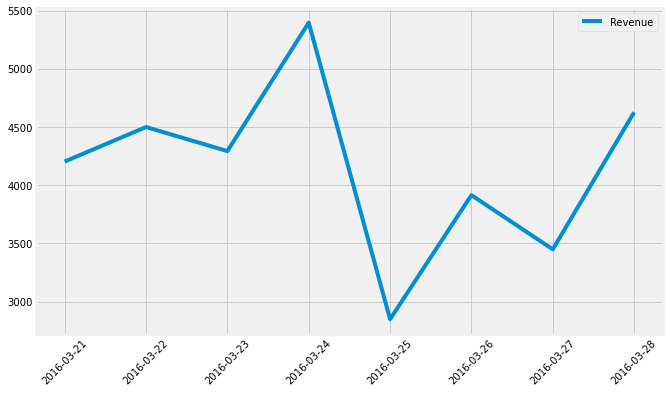

----------------------------------------------------------------------
209 ] Monthly Graph from MONDAY 2016-03-28 00:00:00 to MONDAY 2016-04-04 00:00:00


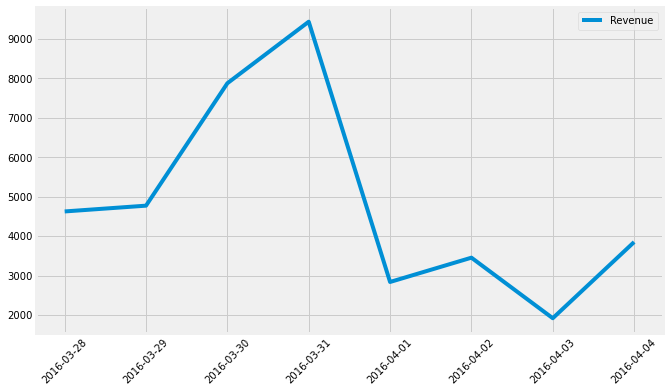

----------------------------------------------------------------------
210 ] Monthly Graph from MONDAY 2016-04-04 00:00:00 to MONDAY 2016-04-11 00:00:00


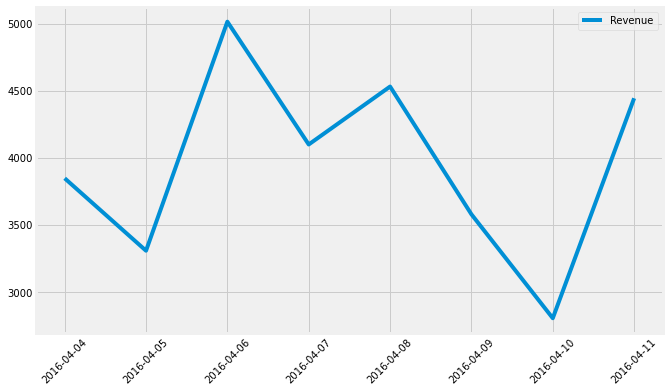

----------------------------------------------------------------------
211 ] Monthly Graph from MONDAY 2016-04-11 00:00:00 to MONDAY 2016-04-18 00:00:00


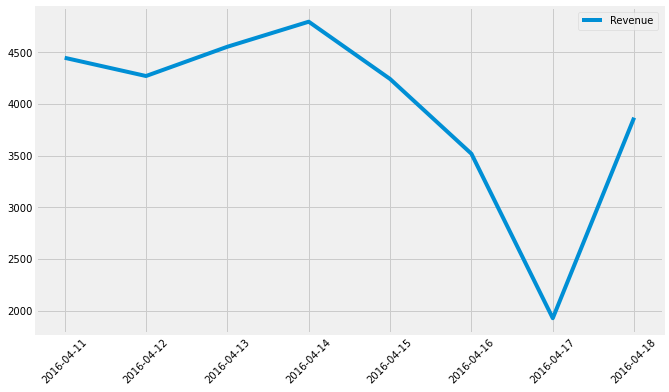

----------------------------------------------------------------------
212 ] Monthly Graph from MONDAY 2016-04-18 00:00:00 to MONDAY 2016-04-25 00:00:00


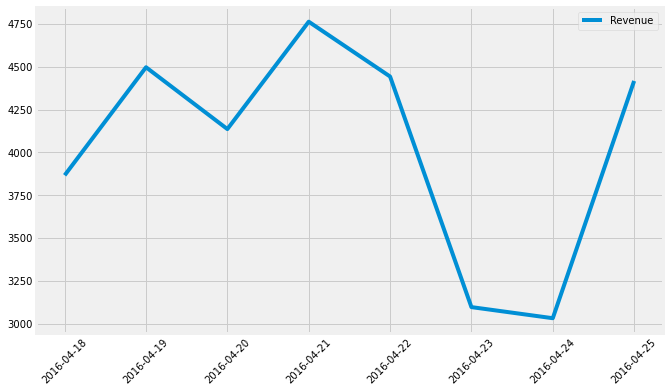

----------------------------------------------------------------------
213 ] Monthly Graph from MONDAY 2016-04-25 00:00:00 to MONDAY 2016-05-02 00:00:00


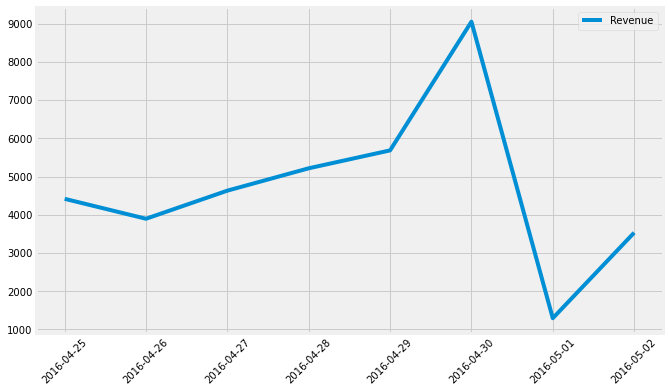

----------------------------------------------------------------------
214 ] Monthly Graph from MONDAY 2016-05-02 00:00:00 to MONDAY 2016-05-09 00:00:00


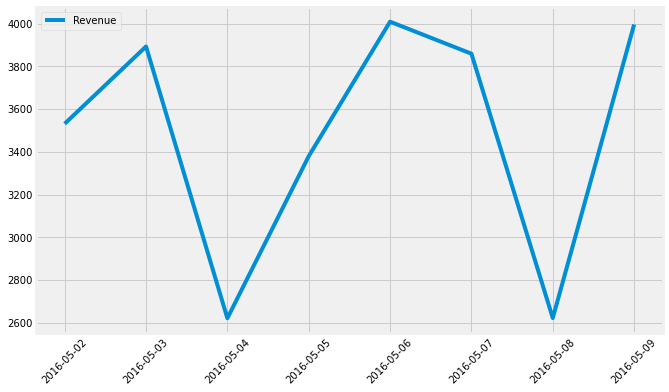

----------------------------------------------------------------------
215 ] Monthly Graph from MONDAY 2016-05-09 00:00:00 to MONDAY 2016-05-16 00:00:00


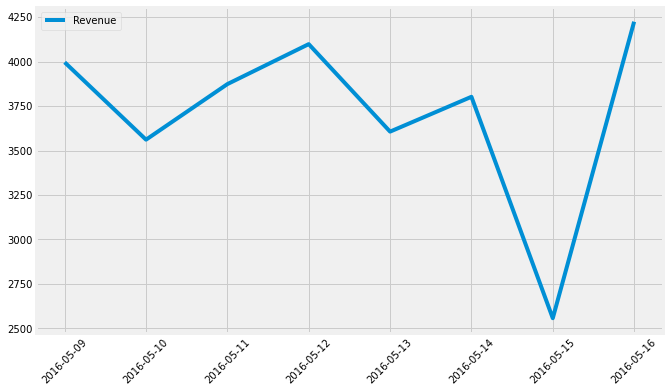

----------------------------------------------------------------------
216 ] Monthly Graph from MONDAY 2016-05-16 00:00:00 to MONDAY 2016-05-23 00:00:00


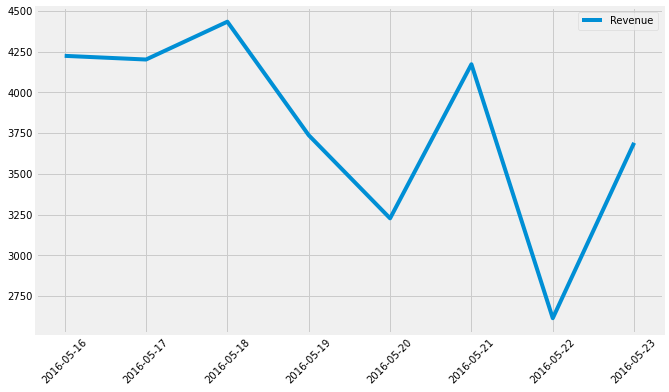

----------------------------------------------------------------------
217 ] Monthly Graph from MONDAY 2016-05-23 00:00:00 to MONDAY 2016-05-30 00:00:00


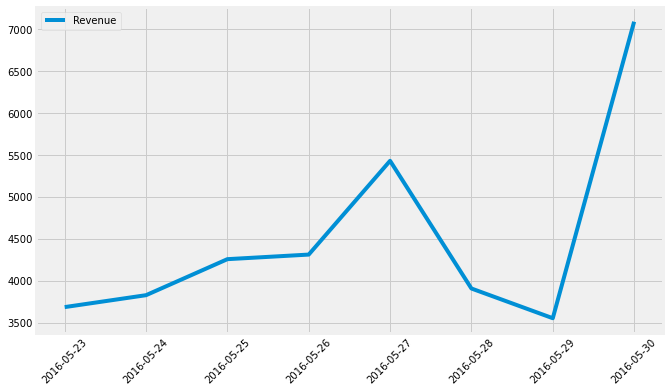

----------------------------------------------------------------------
218 ] Monthly Graph from MONDAY 2016-05-30 00:00:00 to MONDAY 2016-06-06 00:00:00


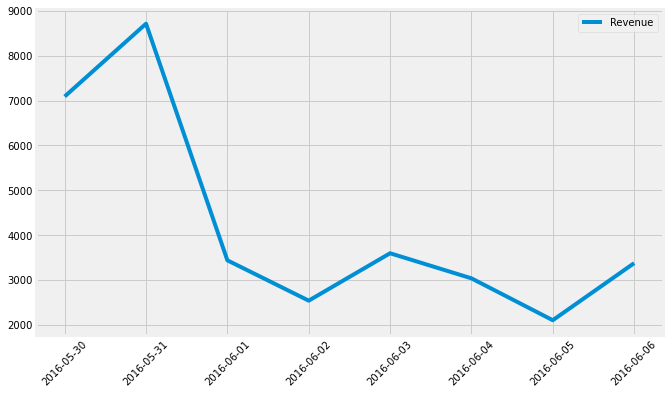

----------------------------------------------------------------------
219 ] Monthly Graph from MONDAY 2016-06-06 00:00:00 to MONDAY 2016-06-13 00:00:00


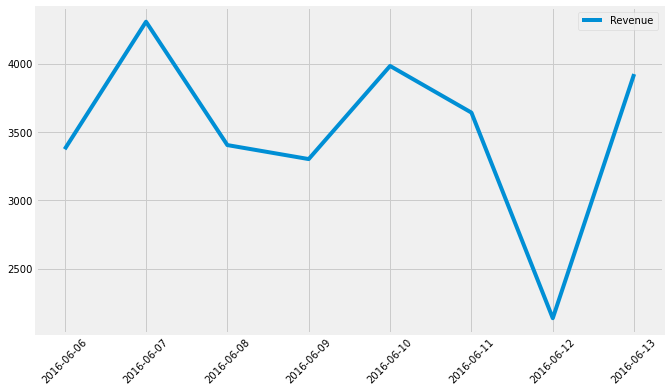

----------------------------------------------------------------------
220 ] Monthly Graph from MONDAY 2016-06-13 00:00:00 to MONDAY 2016-06-20 00:00:00


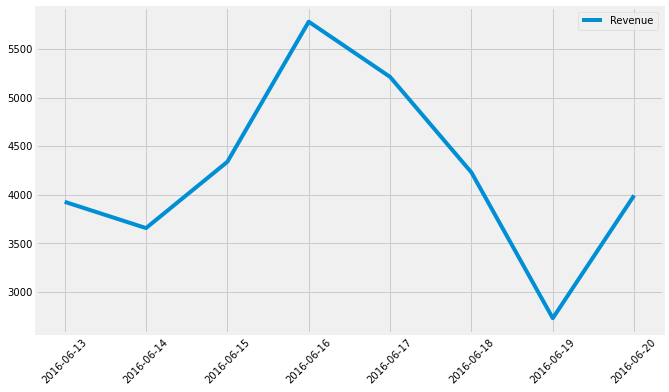

----------------------------------------------------------------------
221 ] Monthly Graph from MONDAY 2016-06-20 00:00:00 to MONDAY 2016-06-27 00:00:00


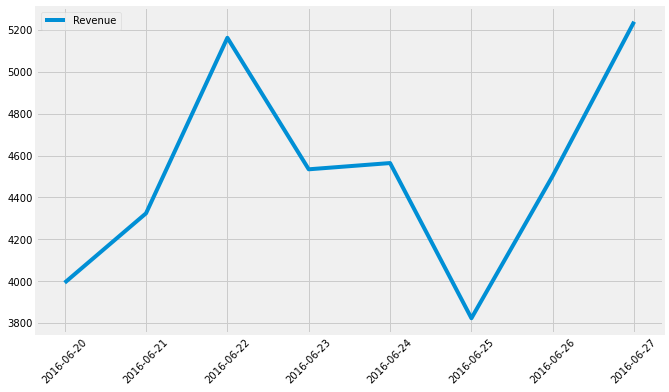

----------------------------------------------------------------------
222 ] Monthly Graph from MONDAY 2016-06-27 00:00:00 to MONDAY 2016-07-04 00:00:00


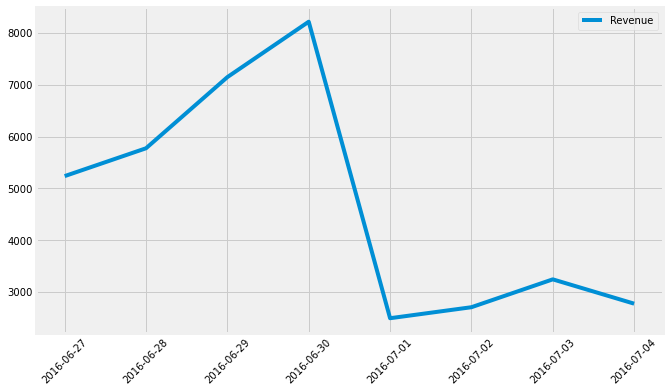

----------------------------------------------------------------------
223 ] Monthly Graph from MONDAY 2016-07-04 00:00:00 to MONDAY 2016-07-11 00:00:00


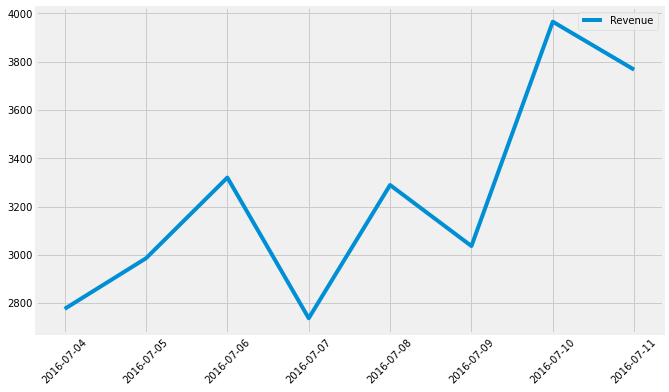

----------------------------------------------------------------------
224 ] Monthly Graph from MONDAY 2016-07-11 00:00:00 to MONDAY 2016-07-18 00:00:00


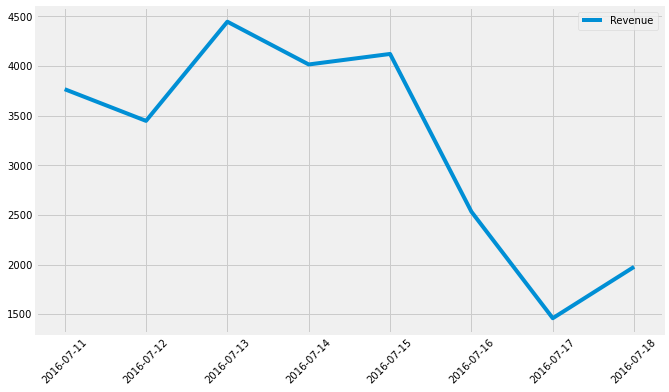

----------------------------------------------------------------------
225 ] Monthly Graph from MONDAY 2016-07-18 00:00:00 to MONDAY 2016-07-25 00:00:00


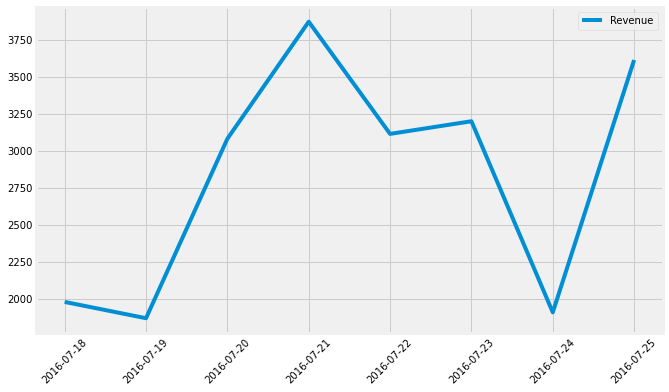

----------------------------------------------------------------------
226 ] Monthly Graph from MONDAY 2016-07-25 00:00:00 to MONDAY 2016-08-01 00:00:00


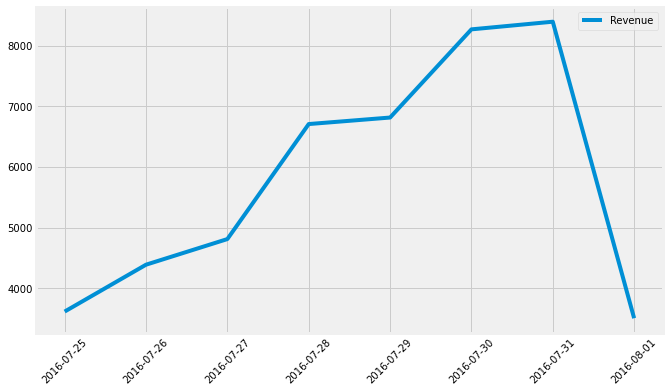

----------------------------------------------------------------------
227 ] Monthly Graph from MONDAY 2016-08-01 00:00:00 to MONDAY 2016-08-08 00:00:00


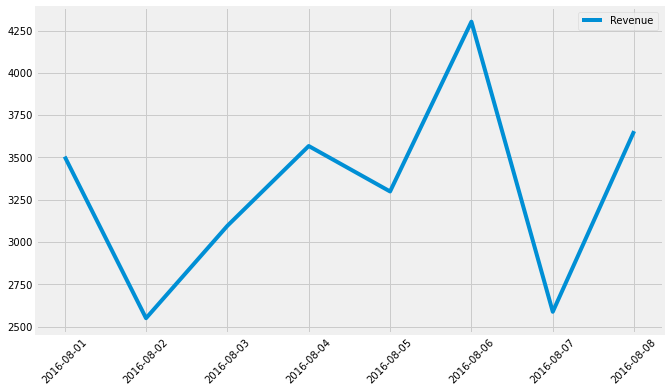

----------------------------------------------------------------------
228 ] Monthly Graph from MONDAY 2016-08-08 00:00:00 to MONDAY 2016-08-15 00:00:00


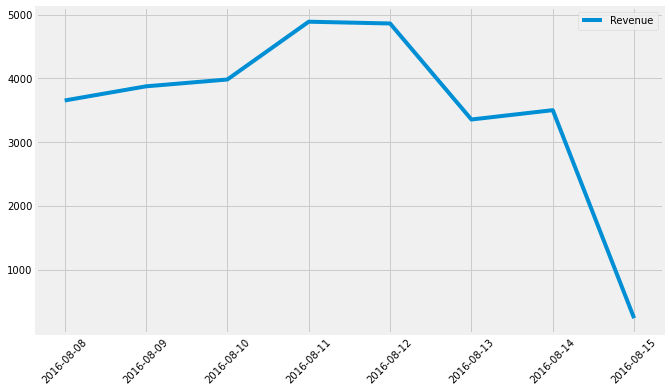

----------------------------------------------------------------------
229 ] Monthly Graph from MONDAY 2016-08-15 00:00:00 to MONDAY 2016-08-22 00:00:00


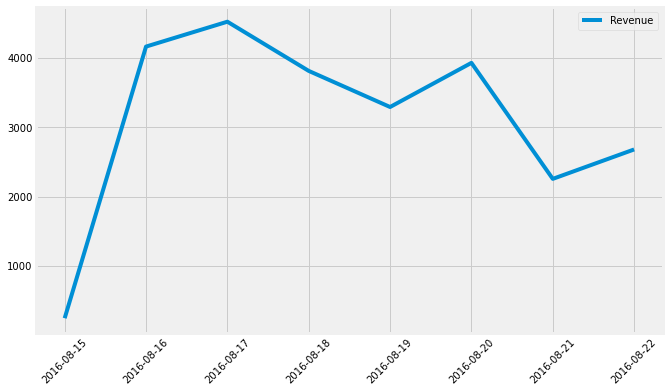

----------------------------------------------------------------------
230 ] Monthly Graph from MONDAY 2016-08-22 00:00:00 to MONDAY 2016-08-29 00:00:00


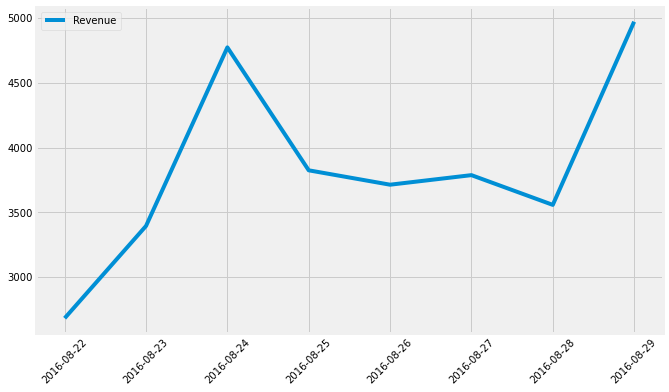

----------------------------------------------------------------------
231 ] Monthly Graph from MONDAY 2016-08-29 00:00:00 to MONDAY 2016-09-05 00:00:00


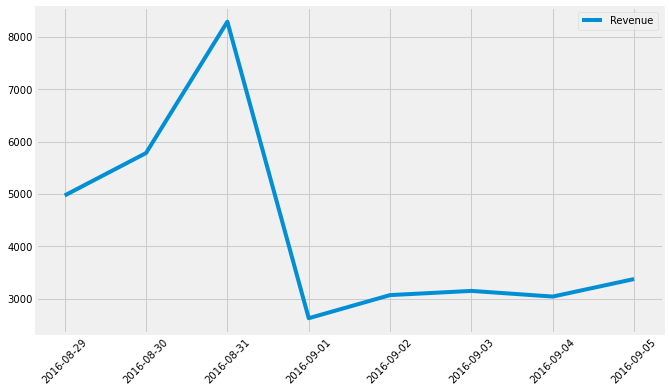

----------------------------------------------------------------------
232 ] Monthly Graph from MONDAY 2016-09-05 00:00:00 to MONDAY 2016-09-12 00:00:00


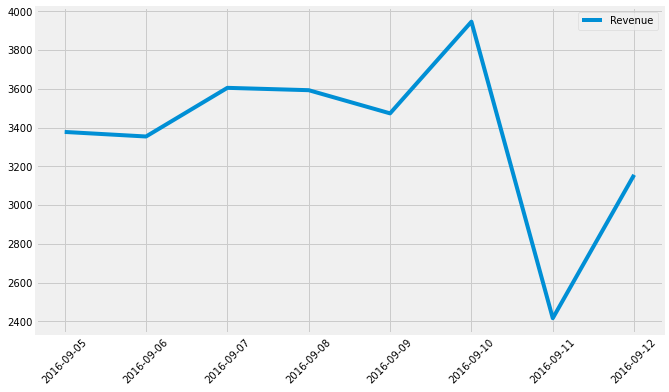

----------------------------------------------------------------------
233 ] Monthly Graph from MONDAY 2016-09-12 00:00:00 to MONDAY 2016-09-19 00:00:00


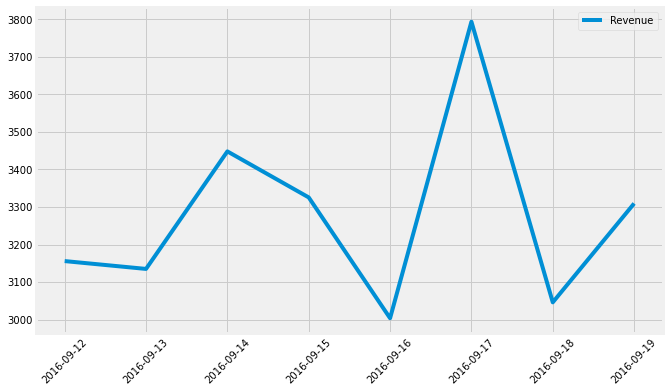

----------------------------------------------------------------------
234 ] Monthly Graph from MONDAY 2016-09-19 00:00:00 to MONDAY 2016-09-26 00:00:00


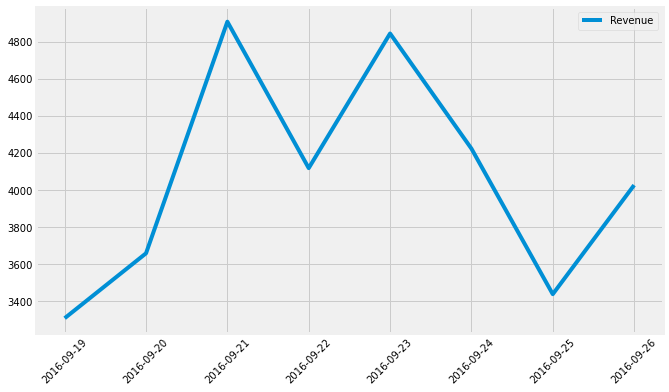

----------------------------------------------------------------------
235 ] Monthly Graph from MONDAY 2016-09-26 00:00:00 to MONDAY 2016-10-03 00:00:00


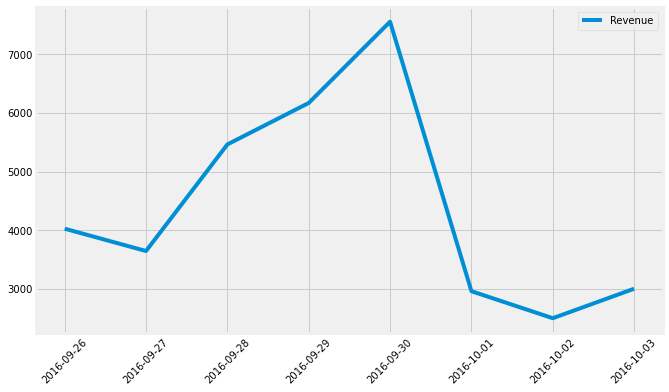

----------------------------------------------------------------------
236 ] Monthly Graph from MONDAY 2016-10-03 00:00:00 to MONDAY 2016-10-10 00:00:00


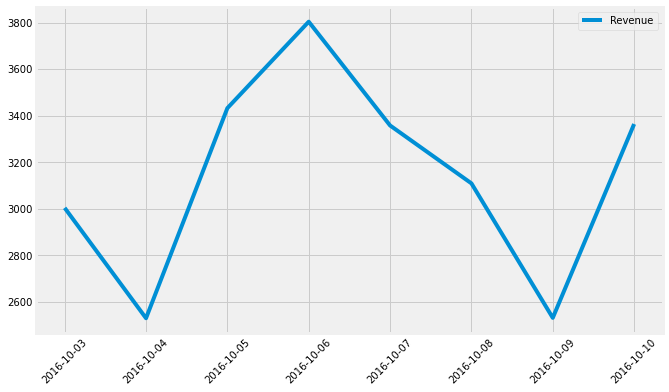

----------------------------------------------------------------------
237 ] Monthly Graph from MONDAY 2016-10-10 00:00:00 to MONDAY 2016-10-17 00:00:00


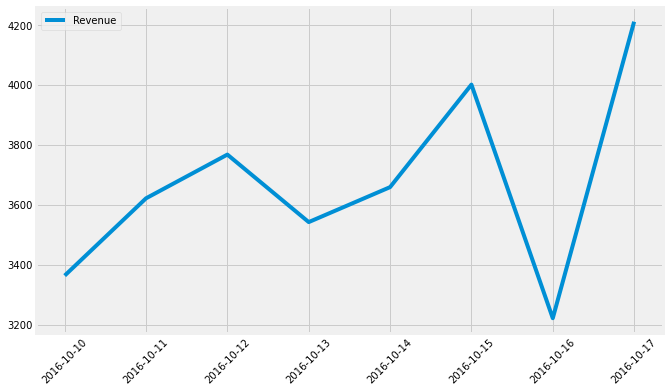

----------------------------------------------------------------------
238 ] Monthly Graph from MONDAY 2016-10-17 00:00:00 to MONDAY 2016-10-24 00:00:00


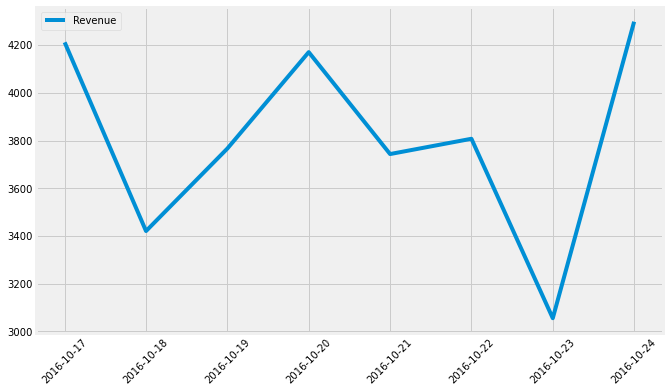

----------------------------------------------------------------------
239 ] Monthly Graph from MONDAY 2016-10-24 00:00:00 to MONDAY 2016-10-31 00:00:00


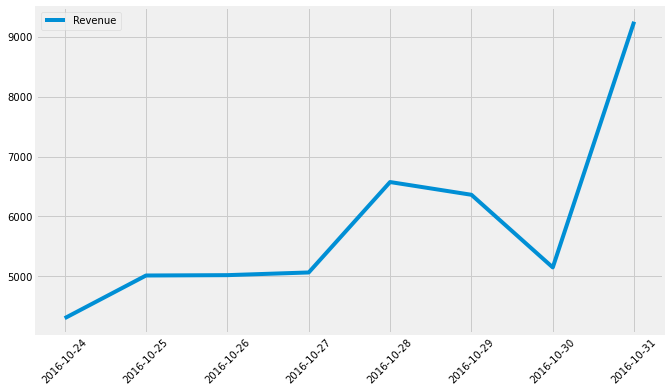

----------------------------------------------------------------------


In [10]:
# Weekly analysis
interval_W = pd.date_range('2012-04-02', '2016-11-01', freq='7D')
print(interval_W,'\n')

for i in range(len(interval_W)-1):
    print(i+1,'] Weekly Graph from MONDAY',interval_W[i],'to MONDAY', interval_W[i+1])
    plt.figure(figsize=(10,6))
    plt.plot(df.set_index('Invoice_DateTime')
             [interval_W[i]:interval_W[i+1]])
    plt.legend(['Revenue'])
    plt.xticks(rotation=45)
    plt.show()
    print('-'*70)

From 239 graphs of weekly analysis, it is clear that most of revenue is generated on FRIDAYs & SATURDAYs except for any holidays before them.

# Spliting into train and test data sets

In [11]:
data = df.set_index('Invoice_DateTime')
data

,Revenue
Invoice_DateTime,
2012-04-02,2525.442000
2012-04-03,3455.840652
2012-04-04,2958.108205
2012-04-05,4157.551163
2012-04-06,5010.062245
...,...
2016-10-27,5062.880110
2016-10-28,6574.271255
2016-10-29,6361.319492


In [12]:
data.isna().sum()

Revenue    0
dtype: int64

In [13]:
train = data[:'2015']
train = train.reset_index()
test = data['2016']
test = test.reset_index()
print(train, '\n', test)

     Invoice_DateTime      Revenue
0          2012-04-02  2525.442000
1          2012-04-03  3455.840652
2          2012-04-04  2958.108205
3          2012-04-05  4157.551163
4          2012-04-06  5010.062245
...               ...          ...
1364       2015-12-27  2139.333882
1365       2015-12-28  5096.386796
1366       2015-12-29  5338.874308
1367       2015-12-30  8739.405382
1368       2015-12-31  9939.558859

[1369 rows x 2 columns] 
     Invoice_DateTime      Revenue
0         2016-01-01  2663.124545
1         2016-01-02  2467.712630
2         2016-01-03  3485.232697
3         2016-01-04  2297.138691
4         2016-01-05  2892.438031
..               ...          ...
300       2016-10-27  5062.880110
301       2016-10-28  6574.271255
302       2016-10-29  6361.319492
303       2016-10-30  5147.095915
304       2016-10-31  9254.432914

[305 rows x 2 columns]


Taking data from 02-04-2012 to 31-12-2015 for training the model and data from 01-01-2016 to 31-10-2016 for testing.

In [14]:
train.columns = ['ds','y']

In [15]:
train

,ds,y
0,2012-04-02,2525.442000
1,2012-04-03,3455.840652
2,2012-04-04,2958.108205
3,2012-04-05,4157.551163
4,2012-04-06,5010.062245
...,...,...
1364,2015-12-27,2139.333882
1365,2015-12-28,5096.386796
1366,2015-12-29,5338.874308
1367,2015-12-30,8739.405382


# Prediction with Prophet

In [16]:
# prophet with daily_seasonality
model = Prophet(daily_seasonality=True)
model.fit(train)

INFO:numexpr.utils:NumExpr defaulting to 8 threads.


In [17]:
future_dates = model.make_future_dataframe(305, freq='D', include_history=False)
future_dates

,ds
0,2016-01-01
1,2016-01-02
2,2016-01-03
3,2016-01-04
4,2016-01-05
...,...
300,2016-10-27
301,2016-10-28
302,2016-10-29
303,2016-10-30


In [18]:
forecast = model.predict(future_dates)
predictions= forecast[['ds','yhat','yhat_lower','yhat_upper']]
predictions

,ds,yhat,yhat_lower,yhat_upper
0,2016-01-01,4446.147295,2532.025262,6210.933169
1,2016-01-02,4176.288004,2181.831561,5965.321784
2,2016-01-03,3368.079040,1423.684899,5238.796846
3,2016-01-04,4004.372615,2069.944478,5847.863963
4,2016-01-05,4189.462786,2289.073529,6045.131479
...,...,...,...,...
300,2016-10-27,4538.674008,2651.972188,6477.745622
301,2016-10-28,4532.743687,2663.690346,6472.688385
302,2016-10-29,4251.762208,2367.181327,6063.036797
303,2016-10-30,3436.946652,1596.448973,5321.126150


In [19]:
pred = predictions.yhat
actual = test.Revenue

In [20]:
results(actual, pred)

explained_variance:  0.025
r2:  -0.0418
MAE:  1059.3834
MSE:  2184788.0017
RMSE:  1478.1028
RMSLE:  0.3659


In [21]:
# prophet with weekly_seasonality
model_w = Prophet(weekly_seasonality=True)
model_w.fit(train)

forecast_w = model_w.predict(future_dates)
predictions_w= forecast_w[['ds','yhat','yhat_lower','yhat_upper']]
predictions_w

pred_w = predictions_w.yhat

results(actual, pred_w)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


explained_variance:  0.0253
r2:  -0.0437
MAE:  1062.4853
MSE:  2188862.574
RMSE:  1479.4805
RMSLE:  0.3664


In [22]:
# prophet with yearly_seasonality
model_y = Prophet(yearly_seasonality=True)
model_y.fit(train)

forecast_y = model_y.predict(future_dates)
predictions_y= forecast_y[['ds','yhat','yhat_lower','yhat_upper']]
predictions_y

pred_y = predictions_y.yhat

results(actual, pred_y)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


explained_variance:  0.0253
r2:  -0.0437
MAE:  1062.4853
MSE:  2188862.574
RMSE:  1479.4805
RMSLE:  0.3664


In [23]:
train.y = np.log(train.y)
train

,ds,y
0,2012-04-02,7.834171
1,2012-04-03,8.147821
2,2012-04-04,7.992305
3,2012-04-05,8.332682
4,2012-04-06,8.519204
...,...,...
1364,2015-12-27,7.668250
1365,2015-12-28,8.536287
1366,2015-12-29,8.582770
1367,2015-12-30,9.075597


# selected

In [24]:
# prophet with daily_seasonality and log of revenue
model_log = Prophet(daily_seasonality=True)
model_log.fit(train)

forecast_log = model_log.predict(future_dates)
predictions_log= forecast_log[['ds','yhat','yhat_lower','yhat_upper']]
predictions_log

pred_log = np.exp(predictions_log.yhat)

results(actual, pred_log)

explained_variance:  0.0406
r2:  0.011
MAE:  868.9777
MSE:  2074117.2408
RMSE:  1440.1796
RMSLE:  0.3345


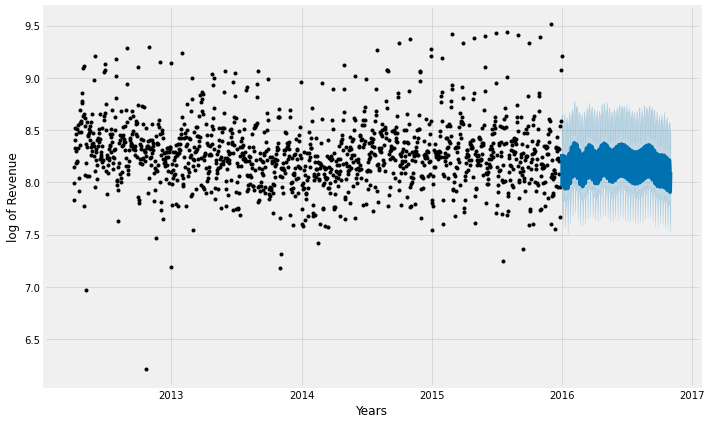

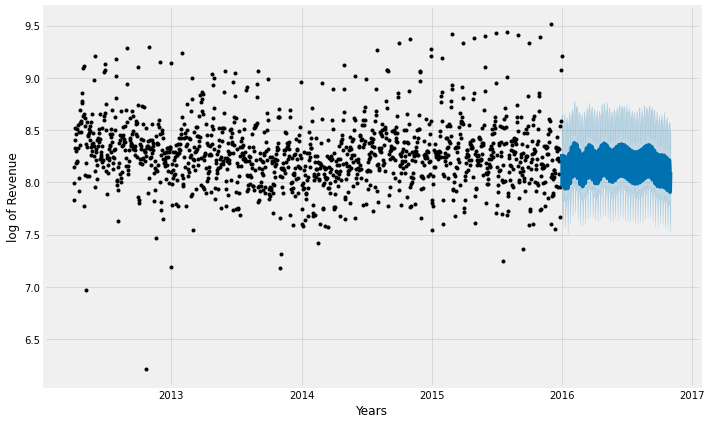

In [25]:
model_log.plot(forecast_log, xlabel='Years', ylabel='log of Revenue')

This plot shows historical data (train data points by black dots) and forecasted data (predicted data along with lower & upper limits by blue color)

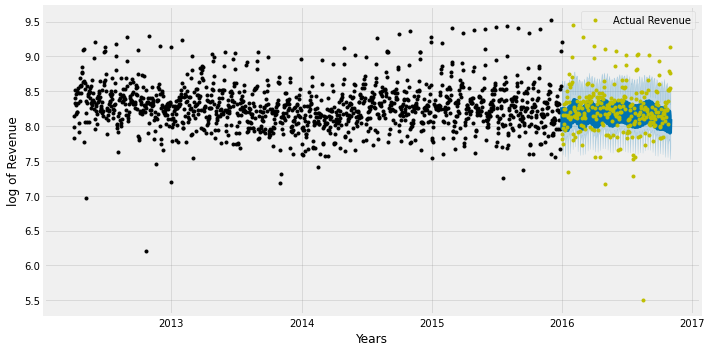

In [26]:
fig, ax =plt.subplots(1, figsize=(10,5))
model_log.plot(forecast_log, ax=ax, 
               xlabel='Years', ylabel='log of Revenue')
ax.plot(np.log(test.set_index('Invoice_DateTime').Revenue), 
        'y.', label='Actual Revenue')
plt.legend()

This integrated plot shows historical data (train data points by black dots), forecasted data (predicted data along with lower & upper limits by blue color) and actual data(Real data for that time by green dots)

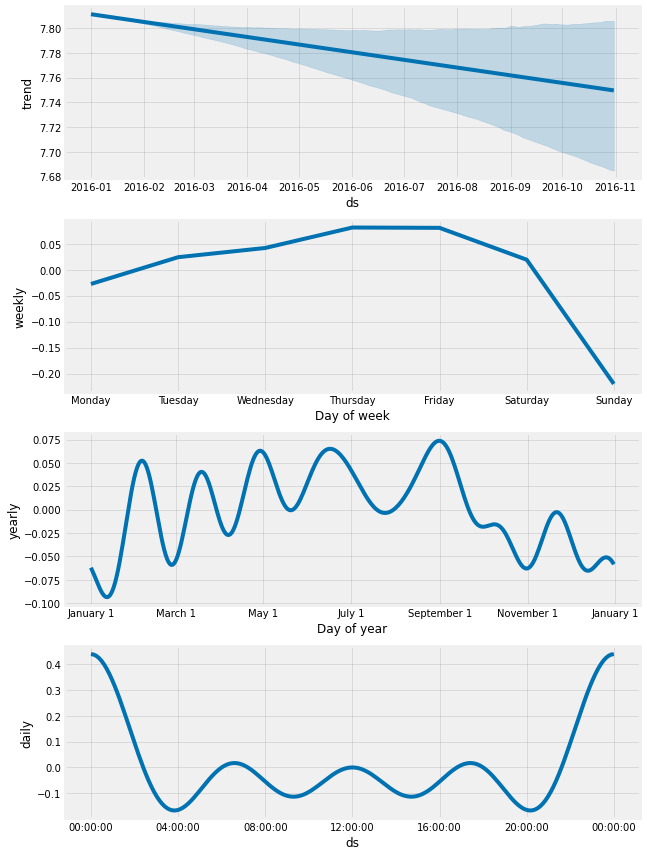

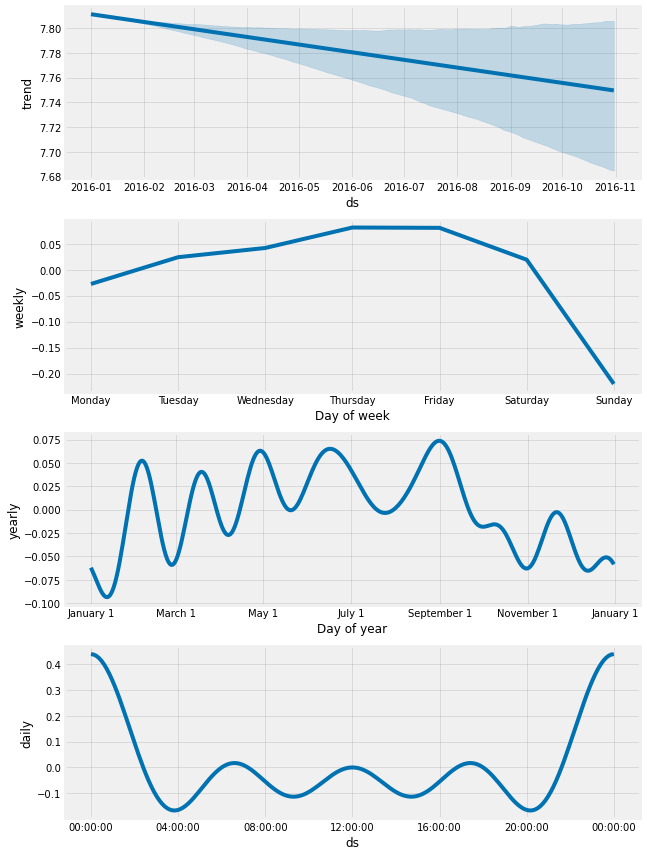

In [27]:
model_log.plot_components(forecast_log, weekly_start=1)

In [172]:
#forecast_log.set_index('ds').sort_index()['2016-07']['yhat']

ds
2016-07-01    8.336486
2016-07-02    8.272227
2016-07-03    8.030074
2016-07-04    8.219644
2016-07-05    8.268234
2016-07-06    8.283010
2016-07-07    8.319455
2016-07-08    8.315897
2016-07-09    8.251605
2016-07-10    8.009544
2016-07-11    8.199332
2016-07-12    8.248268
2016-07-13    8.263519
2016-07-14    8.300564
2016-07-15    8.297731
2016-07-16    8.234283
2016-07-17    7.993179
2016-07-18    8.184029
2016-07-19    8.234123
2016-07-20    8.250616
2016-07-21    8.288976
2016-07-22    8.287518
2016-07-23    8.225493
2016-07-24    7.985846
2016-07-25    8.178172
2016-07-26    8.229750
2016-07-27    8.247724
2016-07-28    8.287552
2016-07-29    8.287537
2016-07-30    8.226924
2016-07-31    7.988652
Name: yhat, dtype: float64

In [42]:
new_future_dates = model_log.make_future_dataframe(670, freq='D', include_history=False)
new_future_dates

,ds
0,2016-01-01
1,2016-01-02
2,2016-01-03
3,2016-01-04
4,2016-01-05
...,...
665,2017-10-27
666,2017-10-28
667,2017-10-29
668,2017-10-30


In [33]:
#new_future_dates = new_future_dates.iloc[305:]
#new_future_dates

,ds
305,2016-11-01
306,2016-11-02
307,2016-11-03
308,2016-11-04
309,2016-11-05
...,...
665,2017-10-27
666,2017-10-28
667,2017-10-29
668,2017-10-30


In [43]:
new_forecast_log = model_log.predict(new_future_dates)
new_predictions_log= new_forecast_log[['ds','yhat','yhat_lower','yhat_upper']]
new_predictions_log[['yhat','yhat_lower','yhat_upper']] = np.exp(
    new_predictions_log[['yhat','yhat_lower','yhat_upper']])
new_predictions_log

,ds,yhat,yhat_lower,yhat_upper
0,2016-01-01,3911.754670,2742.745891,5607.679479
1,2016-01-02,3666.626926,2508.322975,5296.233278
2,2016-01-03,2876.003188,1920.065641,4211.393899
3,2016-01-04,3473.163499,2337.136064,5088.640103
4,2016-01-05,3642.438789,2499.803876,5296.552956
...,...,...,...,...
665,2017-10-27,3425.097961,2261.490446,5306.692335
666,2017-10-28,3213.914940,2115.101030,4810.007281
667,2017-10-29,2525.657611,1655.905170,3917.441491
668,2017-10-30,3058.164602,2003.112007,4758.031136


In [44]:
forecating_till_Oct2017 = new_predictions_log.set_index('ds')['2016-11':]
forecating_till_Oct2017

,yhat,yhat_lower,yhat_upper
ds,,,
2016-11-01,3465.303920,2310.642359,5086.176170
2016-11-02,3530.036314,2401.724697,5405.979845
2016-11-03,3676.950125,2428.178969,5369.608251
2016-11-04,3681.850340,2466.667218,5331.726618
2016-11-05,3471.259569,2359.222845,5132.590418
...,...,...,...
2017-10-27,3425.097961,2261.490446,5306.692335
2017-10-28,3213.914940,2115.101030,4810.007281
2017-10-29,2525.657611,1655.905170,3917.441491


This is the forecast for next 1 year from November 2016 to October 2017.

In [84]:
final_df = pd.DataFrame(forecating_till_Oct2017.yhat.describe())
final_df.columns = ['Daily Revenue']
final_df

,Daily Revenue
count,365.000000
mean,3489.316577
std,341.404356
min,2525.657611
25%,3372.939534
50%,3562.610708
75%,3719.732524
max,4019.903409


From this description, it is clear that on daily basis, we would generate about 3489 INR revenue with a deviation of ±341 INR. Also in upcoming year, more than 2 Quarters (50% of days) will generate above mentioned revenue and less than 1 Quarter (25% of days) will generate min. of 2525 INR revenue.

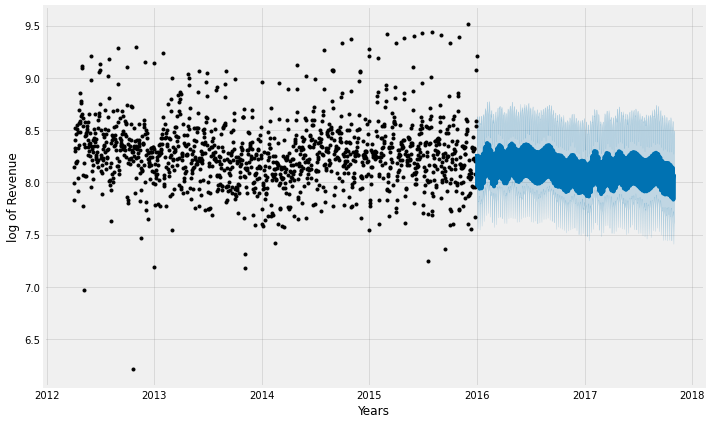

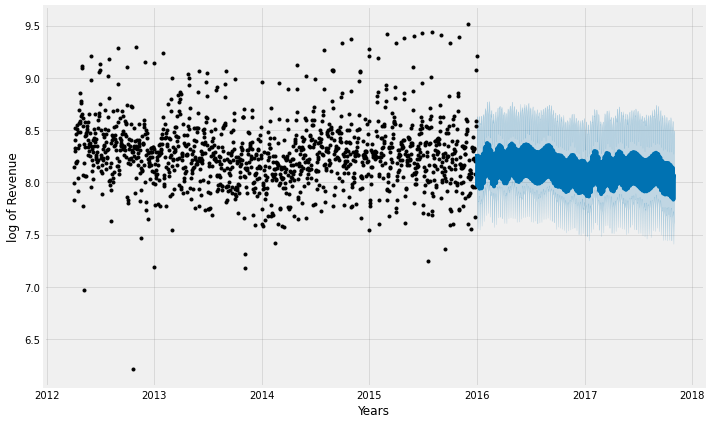

In [45]:
model_log.plot(new_forecast_log, xlabel='Years', ylabel='log of Revenue')

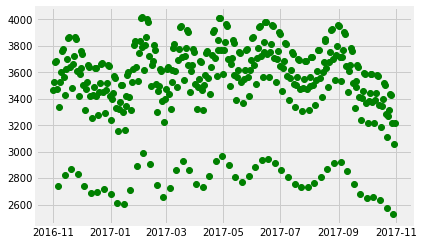

In [60]:
plt.plot(forecating_till_Oct2017.yhat, 'go')

DatetimeIndex(['2016-11-30', '2017-02-28', '2017-05-31', '2017-08-31'], dtype='datetime64[ns]', freq='3M') 

1 ] Quarterly Graph from 2016-11-30 00:00:00 to 2017-02-28 00:00:00


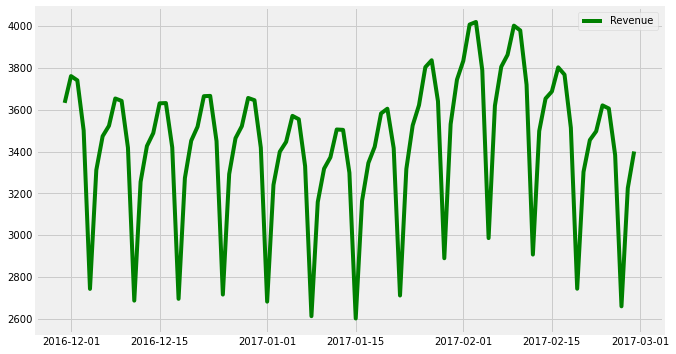

----------------------------------------------------------------------
2 ] Quarterly Graph from 2017-02-28 00:00:00 to 2017-05-31 00:00:00


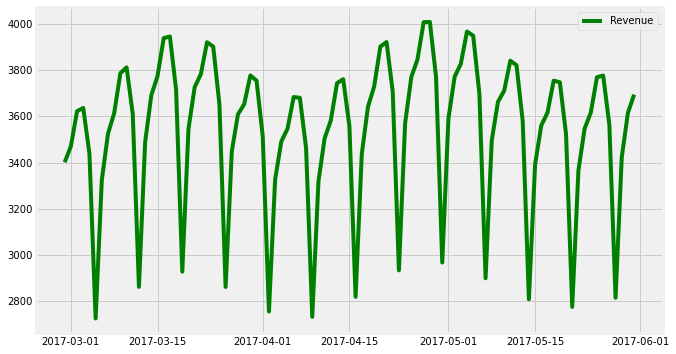

----------------------------------------------------------------------
3 ] Quarterly Graph from 2017-05-31 00:00:00 to 2017-08-31 00:00:00


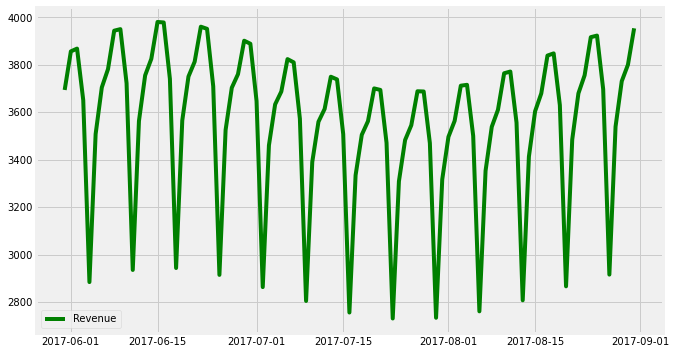

----------------------------------------------------------------------


In [67]:
# Quarterly analysis
interval_3M = pd.date_range('2016-11-01', '2017-11-01', freq='3M')
print(interval_3M,'\n')

for i in range(len(interval_3M)-1):
    print(i+1,'] Quarterly Graph from',interval_3M[i],'to', interval_3M[i+1])
    plt.figure(figsize=(10,6))
    plt.plot(forecating_till_Oct2017.yhat[interval_3M[i]:interval_3M[i+1]], 'g-')
    plt.legend(['Revenue'])
    #plt.xticks(rotation=45)
    plt.show()
    print('-'*70)

DatetimeIndex(['2016-11-30', '2016-12-31', '2017-01-31', '2017-02-28',
               '2017-03-31', '2017-04-30', '2017-05-31', '2017-06-30',
               '2017-07-31', '2017-08-31', '2017-09-30', '2017-10-31'],
              dtype='datetime64[ns]', freq='M') 

1 ] Monthly Graph from 2016-11-30 00:00:00 to 2016-12-31 00:00:00


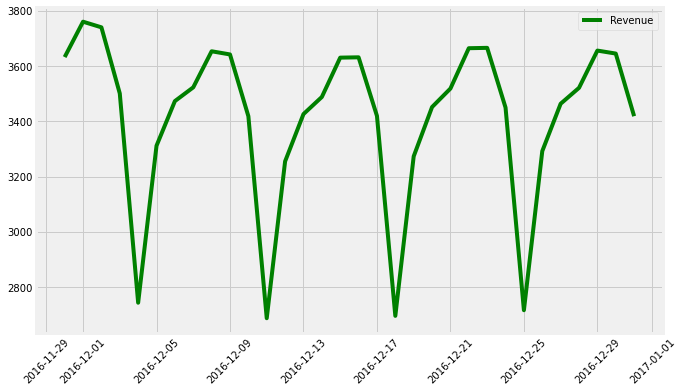

----------------------------------------------------------------------
2 ] Monthly Graph from 2016-12-31 00:00:00 to 2017-01-31 00:00:00


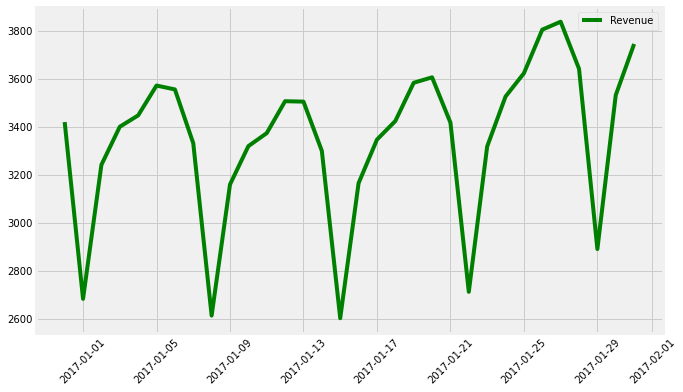

----------------------------------------------------------------------
3 ] Monthly Graph from 2017-01-31 00:00:00 to 2017-02-28 00:00:00


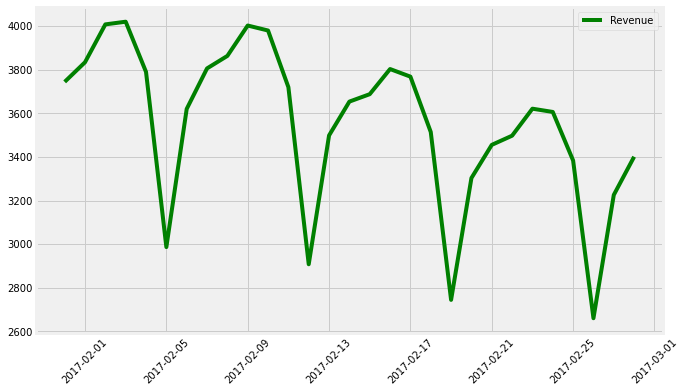

----------------------------------------------------------------------
4 ] Monthly Graph from 2017-02-28 00:00:00 to 2017-03-31 00:00:00


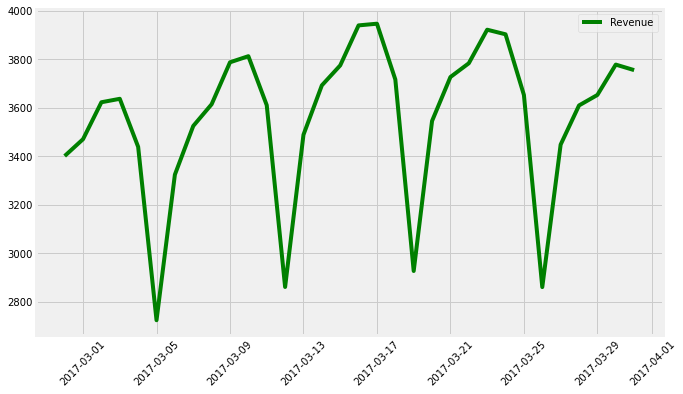

----------------------------------------------------------------------
5 ] Monthly Graph from 2017-03-31 00:00:00 to 2017-04-30 00:00:00


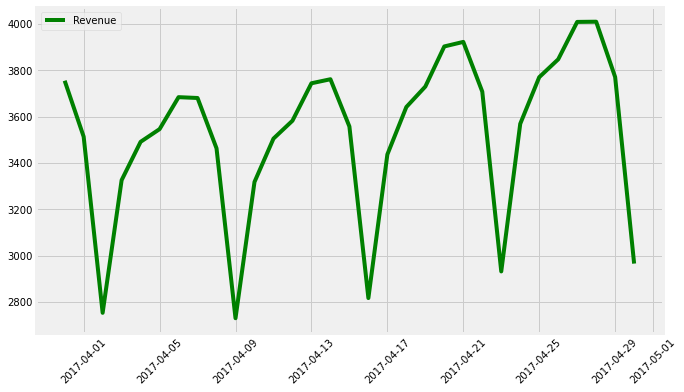

----------------------------------------------------------------------
6 ] Monthly Graph from 2017-04-30 00:00:00 to 2017-05-31 00:00:00


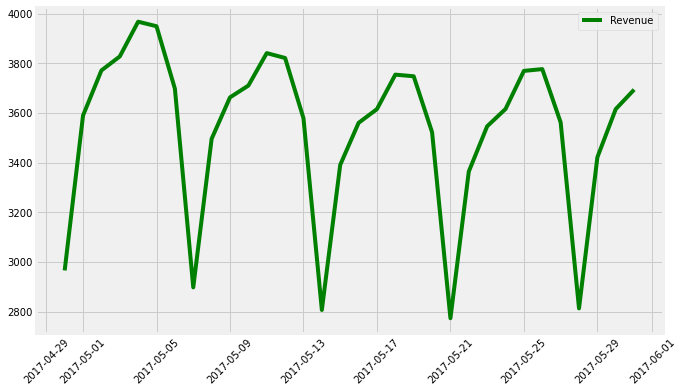

----------------------------------------------------------------------
7 ] Monthly Graph from 2017-05-31 00:00:00 to 2017-06-30 00:00:00


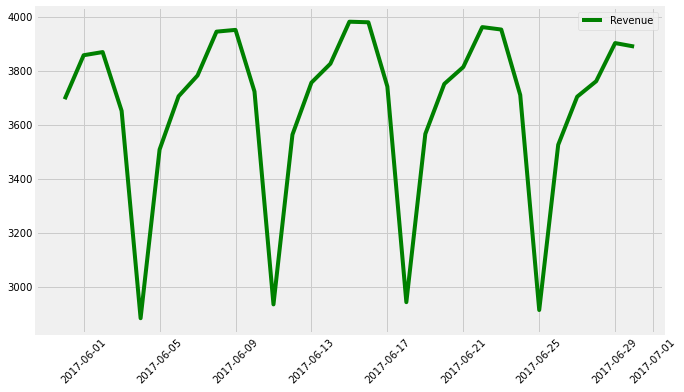

----------------------------------------------------------------------
8 ] Monthly Graph from 2017-06-30 00:00:00 to 2017-07-31 00:00:00


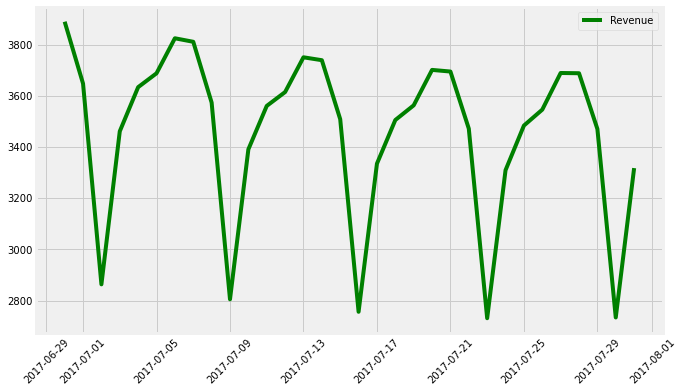

----------------------------------------------------------------------
9 ] Monthly Graph from 2017-07-31 00:00:00 to 2017-08-31 00:00:00


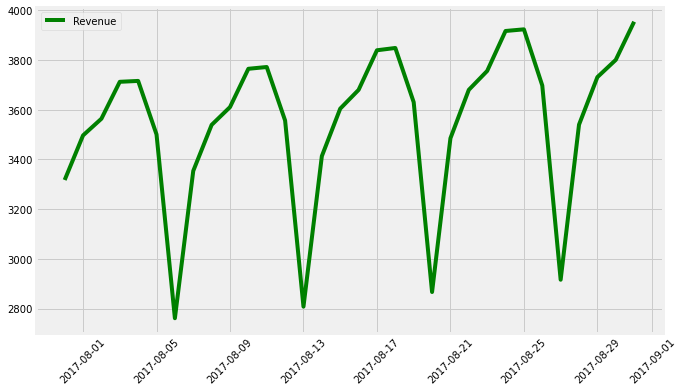

----------------------------------------------------------------------
10 ] Monthly Graph from 2017-08-31 00:00:00 to 2017-09-30 00:00:00


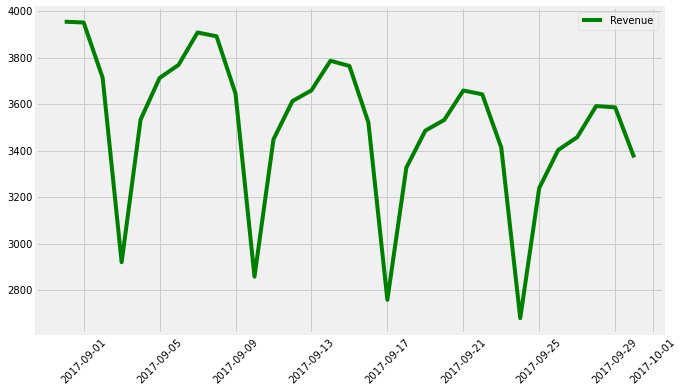

----------------------------------------------------------------------
11 ] Monthly Graph from 2017-09-30 00:00:00 to 2017-10-31 00:00:00


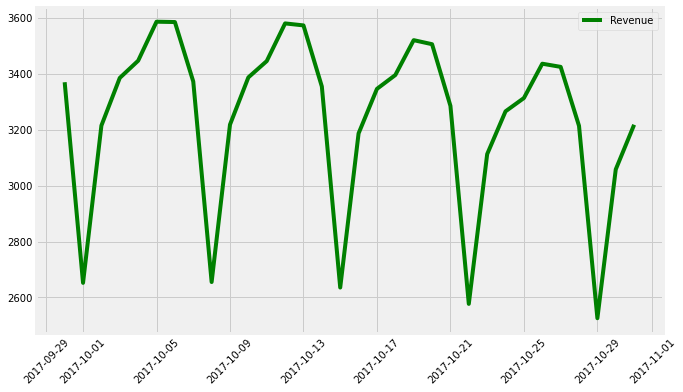

----------------------------------------------------------------------


In [68]:
# Monthly analysis
interval_M = pd.date_range('2016-11-01', '2017-11-01', freq='M')
print(interval_M,'\n')

for i in range(len(interval_M)-1):
    print(i+1,'] Monthly Graph from',interval_M[i],'to', interval_M[i+1])
    plt.figure(figsize=(10,6))
    plt.plot(forecating_till_Oct2017.yhat[interval_M[i]:interval_M[i+1]], 'g-')
    plt.legend(['Revenue'])
    plt.xticks(rotation=45)
    plt.show()
    print('-'*70)

DatetimeIndex(['2016-11-01', '2016-11-08', '2016-11-15', '2016-11-22',
               '2016-11-29', '2016-12-06', '2016-12-13', '2016-12-20',
               '2016-12-27', '2017-01-03', '2017-01-10', '2017-01-17',
               '2017-01-24', '2017-01-31', '2017-02-07', '2017-02-14',
               '2017-02-21', '2017-02-28', '2017-03-07', '2017-03-14',
               '2017-03-21', '2017-03-28', '2017-04-04', '2017-04-11',
               '2017-04-18', '2017-04-25', '2017-05-02', '2017-05-09',
               '2017-05-16', '2017-05-23', '2017-05-30', '2017-06-06',
               '2017-06-13', '2017-06-20', '2017-06-27', '2017-07-04',
               '2017-07-11', '2017-07-18', '2017-07-25', '2017-08-01',
               '2017-08-08', '2017-08-15', '2017-08-22', '2017-08-29',
               '2017-09-05', '2017-09-12', '2017-09-19', '2017-09-26',
               '2017-10-03', '2017-10-10', '2017-10-17', '2017-10-24',
               '2017-10-31'],
              dtype='datetime64[ns]', freq='7D'

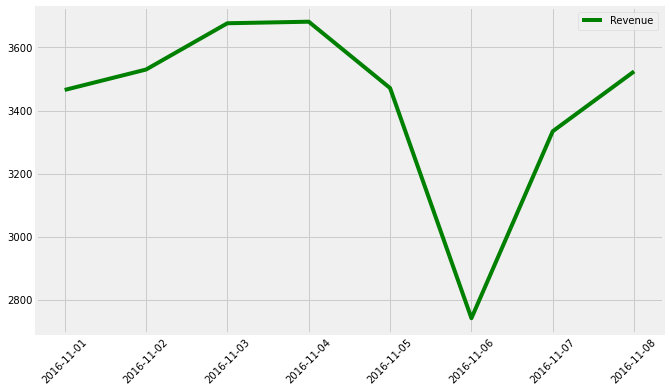

----------------------------------------------------------------------
2 ] Monthly Graph from TUESDAY 2016-11-08 00:00:00 to TUESDAY 2016-11-15 00:00:00


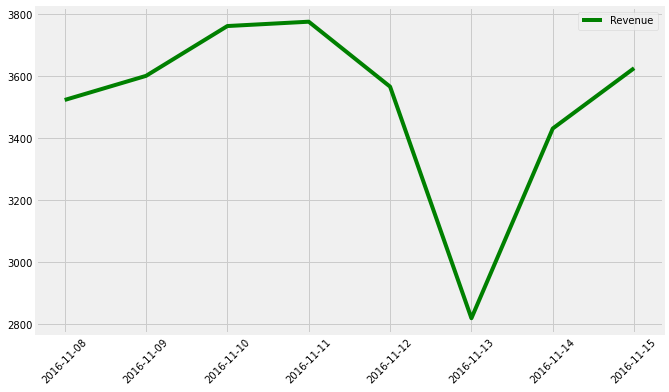

----------------------------------------------------------------------
3 ] Monthly Graph from TUESDAY 2016-11-15 00:00:00 to TUESDAY 2016-11-22 00:00:00


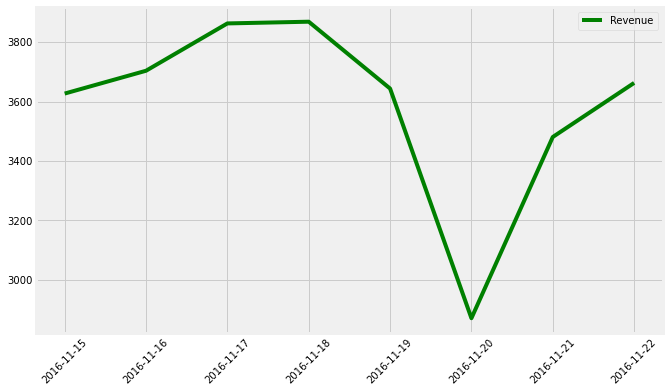

----------------------------------------------------------------------
4 ] Monthly Graph from TUESDAY 2016-11-22 00:00:00 to TUESDAY 2016-11-29 00:00:00


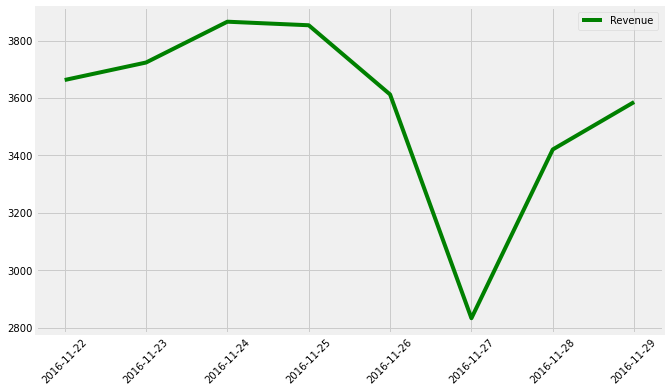

----------------------------------------------------------------------
5 ] Monthly Graph from TUESDAY 2016-11-29 00:00:00 to TUESDAY 2016-12-06 00:00:00


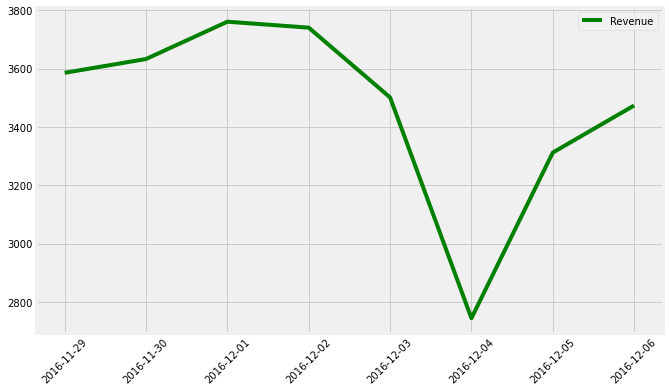

----------------------------------------------------------------------
6 ] Monthly Graph from TUESDAY 2016-12-06 00:00:00 to TUESDAY 2016-12-13 00:00:00


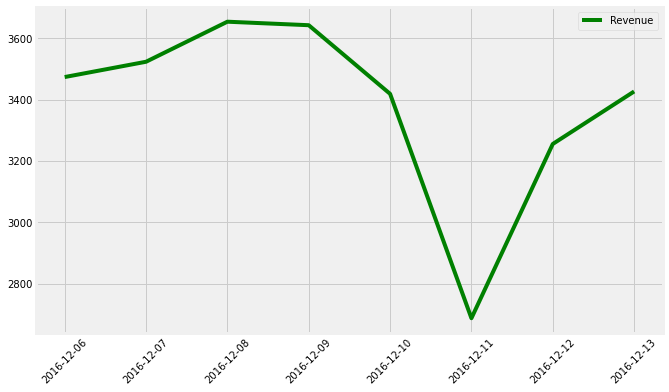

----------------------------------------------------------------------
7 ] Monthly Graph from TUESDAY 2016-12-13 00:00:00 to TUESDAY 2016-12-20 00:00:00


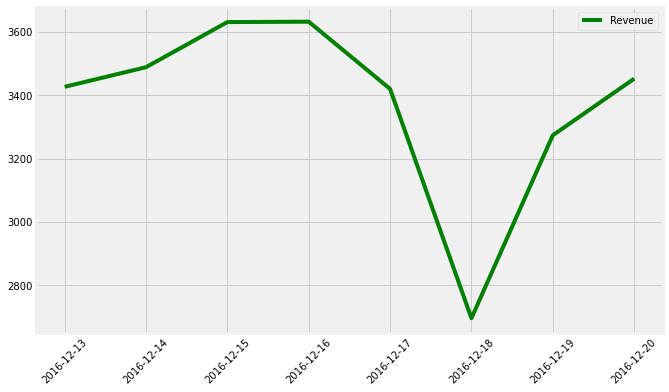

----------------------------------------------------------------------
8 ] Monthly Graph from TUESDAY 2016-12-20 00:00:00 to TUESDAY 2016-12-27 00:00:00


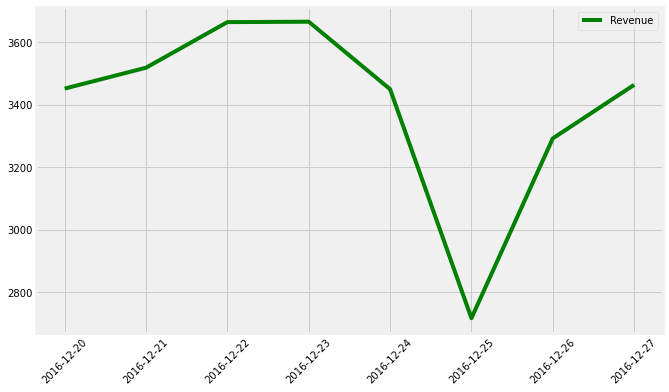

----------------------------------------------------------------------
9 ] Monthly Graph from TUESDAY 2016-12-27 00:00:00 to TUESDAY 2017-01-03 00:00:00


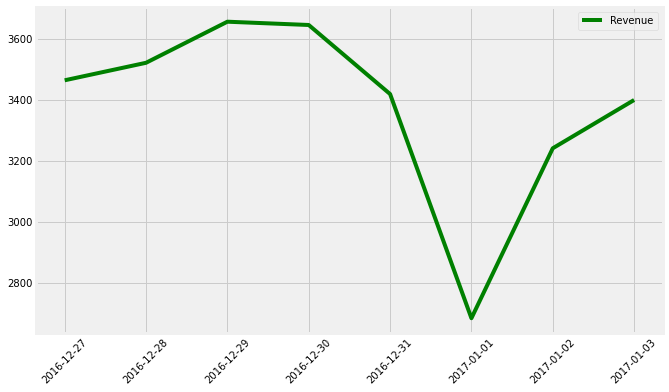

----------------------------------------------------------------------
10 ] Monthly Graph from TUESDAY 2017-01-03 00:00:00 to TUESDAY 2017-01-10 00:00:00


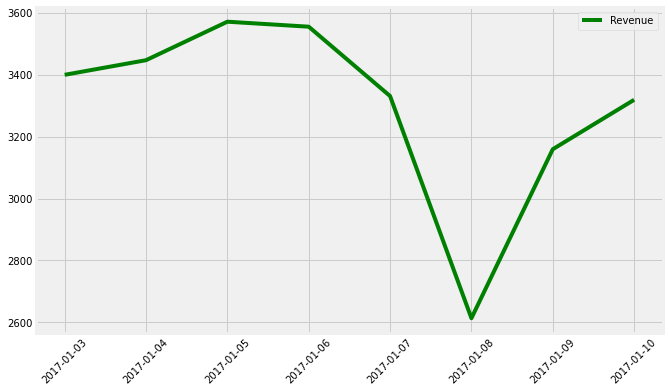

----------------------------------------------------------------------
11 ] Monthly Graph from TUESDAY 2017-01-10 00:00:00 to TUESDAY 2017-01-17 00:00:00


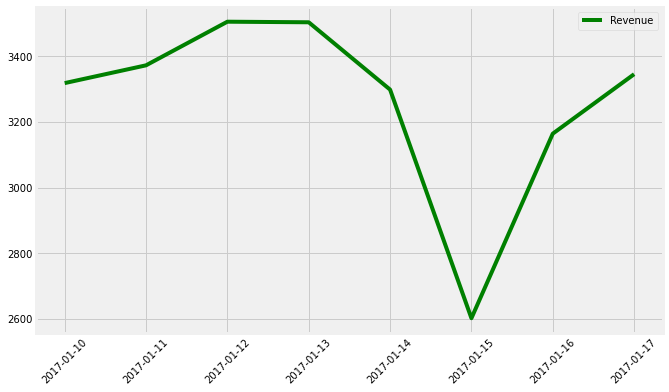

----------------------------------------------------------------------
12 ] Monthly Graph from TUESDAY 2017-01-17 00:00:00 to TUESDAY 2017-01-24 00:00:00


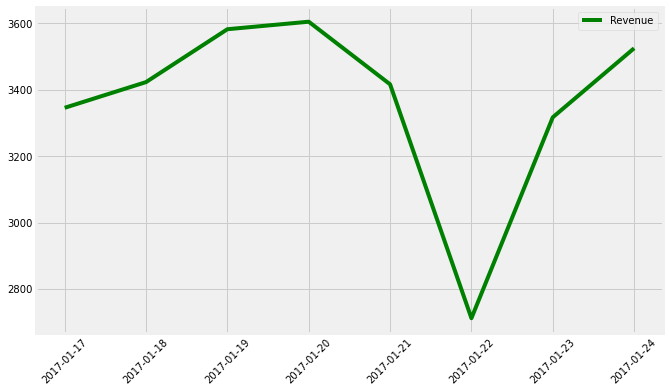

----------------------------------------------------------------------
13 ] Monthly Graph from TUESDAY 2017-01-24 00:00:00 to TUESDAY 2017-01-31 00:00:00


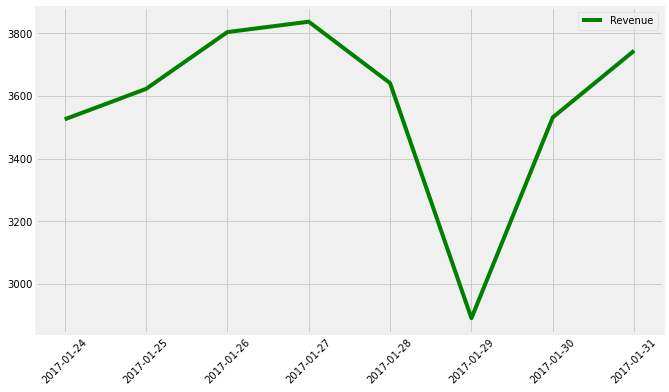

----------------------------------------------------------------------
14 ] Monthly Graph from TUESDAY 2017-01-31 00:00:00 to TUESDAY 2017-02-07 00:00:00


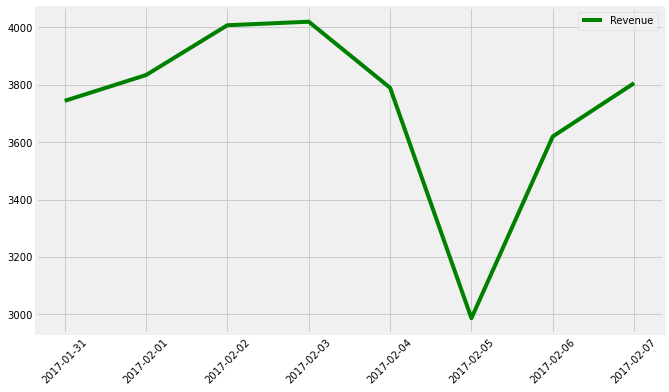

----------------------------------------------------------------------
15 ] Monthly Graph from TUESDAY 2017-02-07 00:00:00 to TUESDAY 2017-02-14 00:00:00


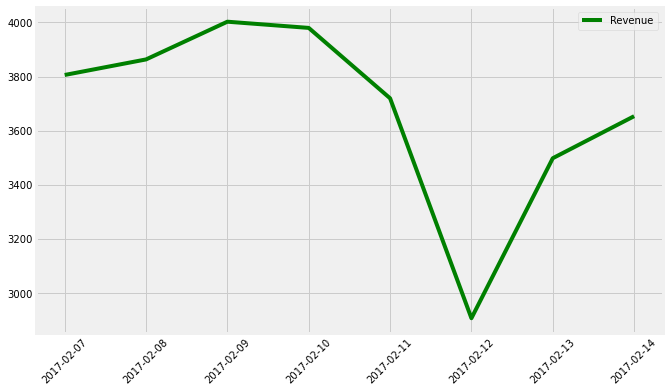

----------------------------------------------------------------------
16 ] Monthly Graph from TUESDAY 2017-02-14 00:00:00 to TUESDAY 2017-02-21 00:00:00


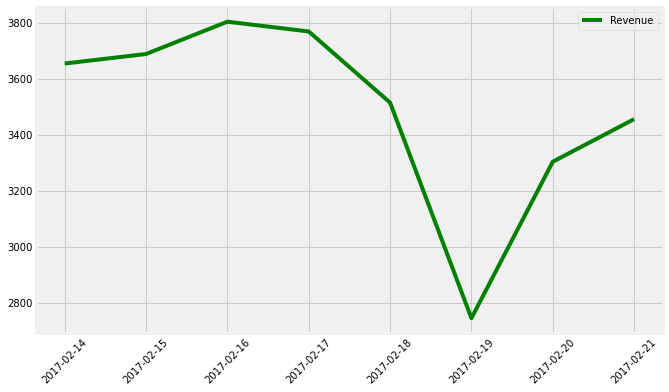

----------------------------------------------------------------------
17 ] Monthly Graph from TUESDAY 2017-02-21 00:00:00 to TUESDAY 2017-02-28 00:00:00


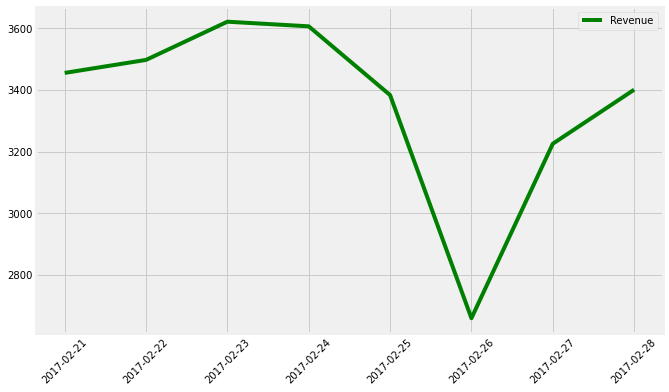

----------------------------------------------------------------------
18 ] Monthly Graph from TUESDAY 2017-02-28 00:00:00 to TUESDAY 2017-03-07 00:00:00


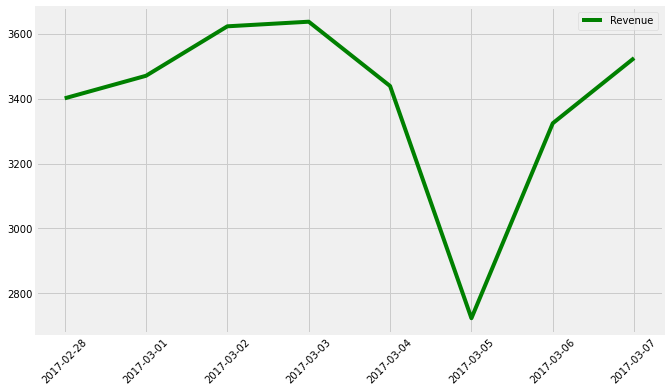

----------------------------------------------------------------------
19 ] Monthly Graph from TUESDAY 2017-03-07 00:00:00 to TUESDAY 2017-03-14 00:00:00


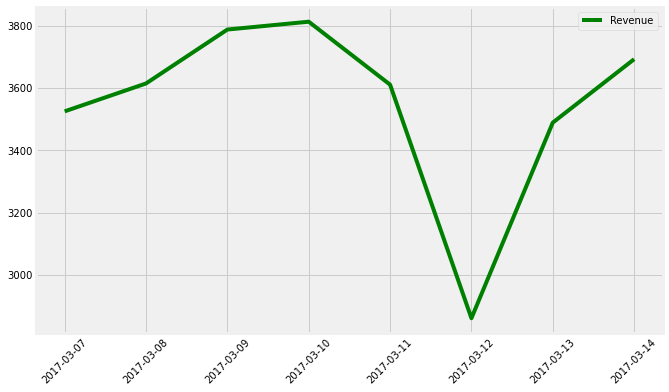

----------------------------------------------------------------------
20 ] Monthly Graph from TUESDAY 2017-03-14 00:00:00 to TUESDAY 2017-03-21 00:00:00


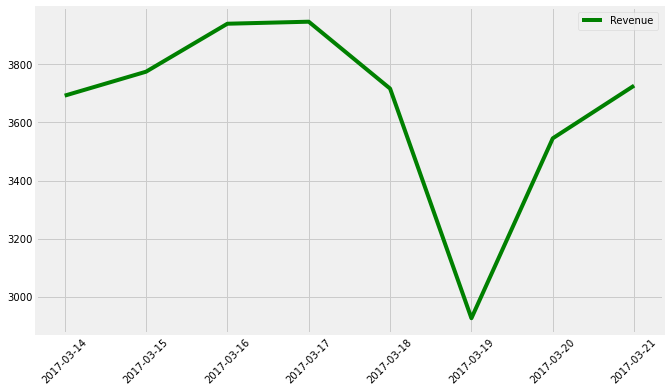

----------------------------------------------------------------------
21 ] Monthly Graph from TUESDAY 2017-03-21 00:00:00 to TUESDAY 2017-03-28 00:00:00


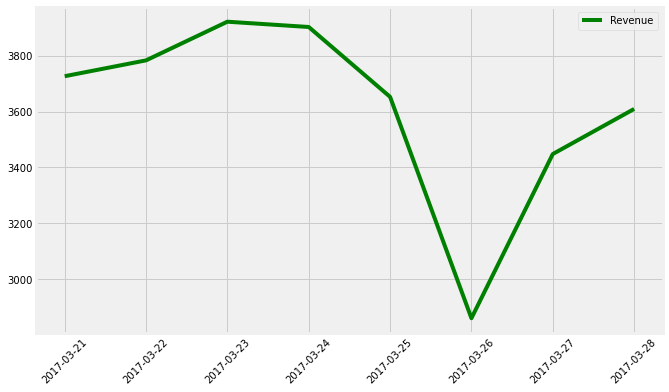

----------------------------------------------------------------------
22 ] Monthly Graph from TUESDAY 2017-03-28 00:00:00 to TUESDAY 2017-04-04 00:00:00


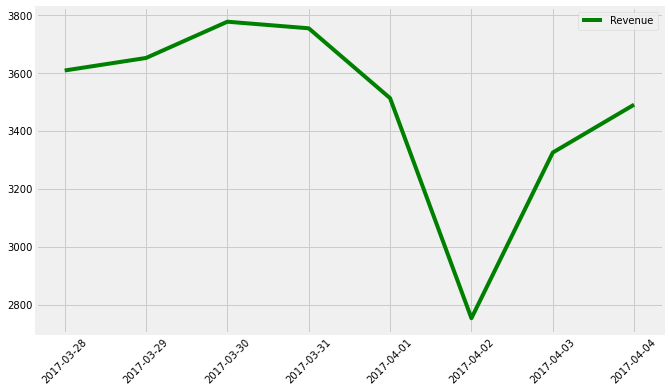

----------------------------------------------------------------------
23 ] Monthly Graph from TUESDAY 2017-04-04 00:00:00 to TUESDAY 2017-04-11 00:00:00


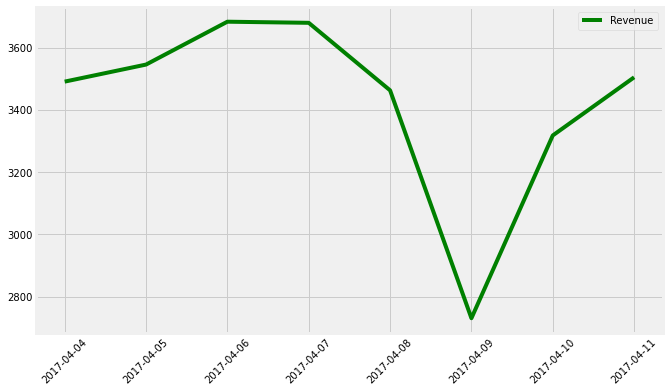

----------------------------------------------------------------------
24 ] Monthly Graph from TUESDAY 2017-04-11 00:00:00 to TUESDAY 2017-04-18 00:00:00


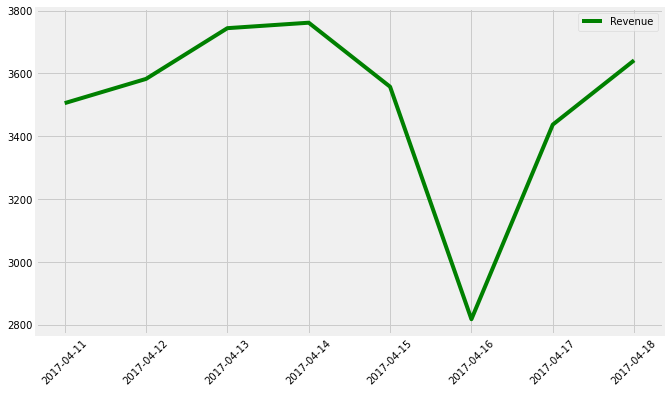

----------------------------------------------------------------------
25 ] Monthly Graph from TUESDAY 2017-04-18 00:00:00 to TUESDAY 2017-04-25 00:00:00


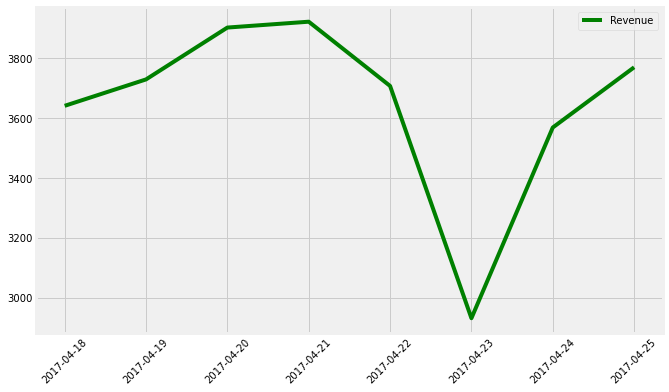

----------------------------------------------------------------------
26 ] Monthly Graph from TUESDAY 2017-04-25 00:00:00 to TUESDAY 2017-05-02 00:00:00


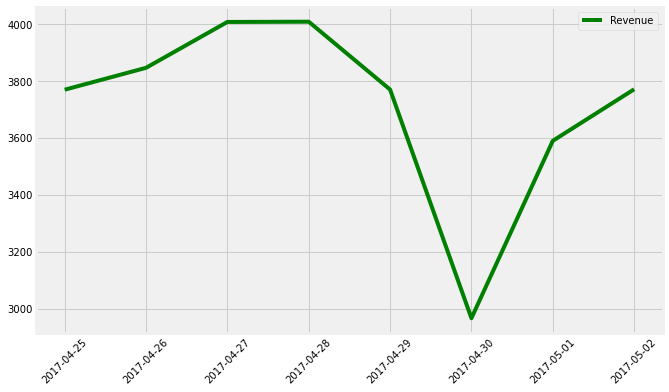

----------------------------------------------------------------------
27 ] Monthly Graph from TUESDAY 2017-05-02 00:00:00 to TUESDAY 2017-05-09 00:00:00


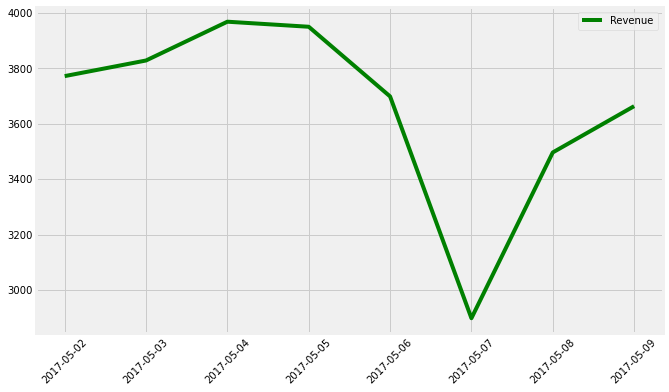

----------------------------------------------------------------------
28 ] Monthly Graph from TUESDAY 2017-05-09 00:00:00 to TUESDAY 2017-05-16 00:00:00


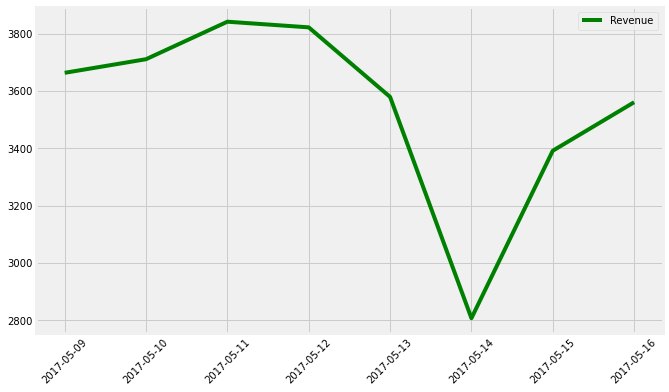

----------------------------------------------------------------------
29 ] Monthly Graph from TUESDAY 2017-05-16 00:00:00 to TUESDAY 2017-05-23 00:00:00


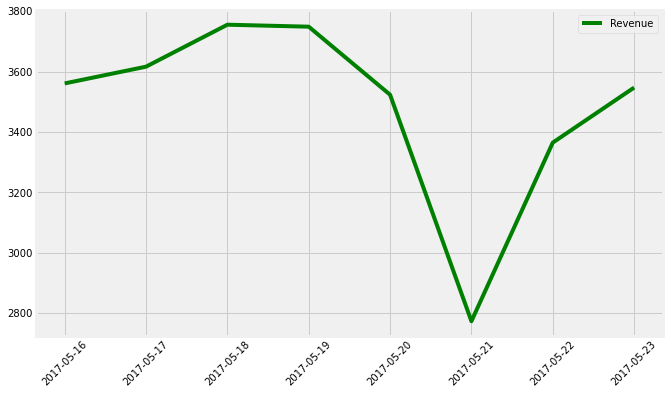

----------------------------------------------------------------------
30 ] Monthly Graph from TUESDAY 2017-05-23 00:00:00 to TUESDAY 2017-05-30 00:00:00


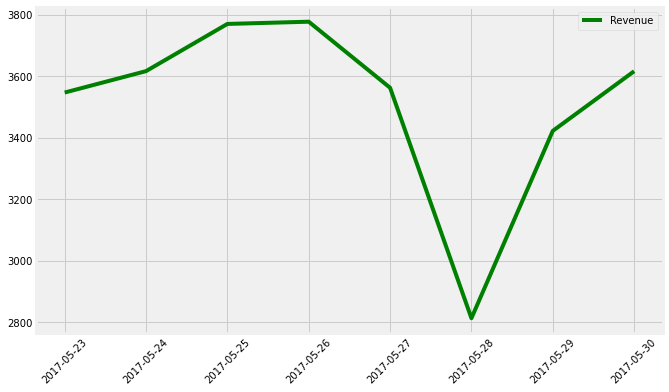

----------------------------------------------------------------------
31 ] Monthly Graph from TUESDAY 2017-05-30 00:00:00 to TUESDAY 2017-06-06 00:00:00


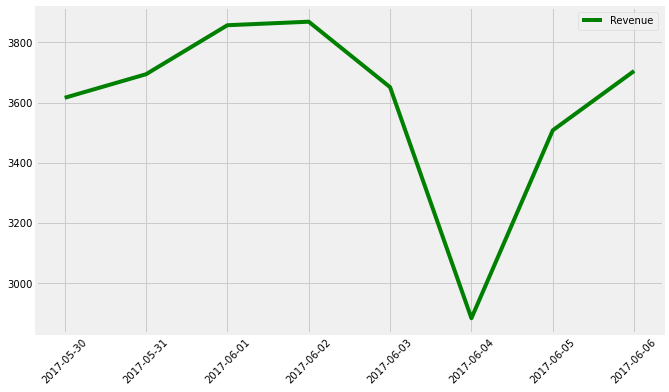

----------------------------------------------------------------------
32 ] Monthly Graph from TUESDAY 2017-06-06 00:00:00 to TUESDAY 2017-06-13 00:00:00


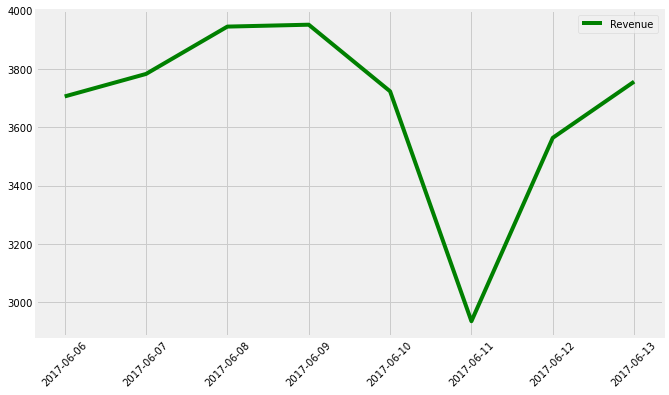

----------------------------------------------------------------------
33 ] Monthly Graph from TUESDAY 2017-06-13 00:00:00 to TUESDAY 2017-06-20 00:00:00


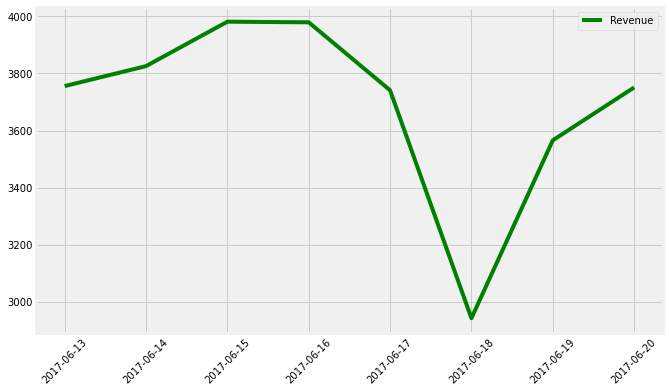

----------------------------------------------------------------------
34 ] Monthly Graph from TUESDAY 2017-06-20 00:00:00 to TUESDAY 2017-06-27 00:00:00


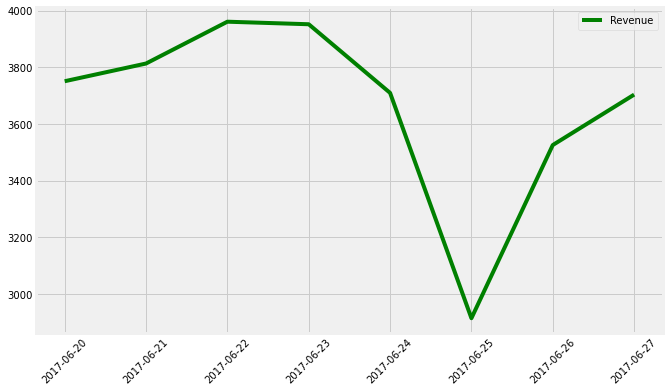

----------------------------------------------------------------------
35 ] Monthly Graph from TUESDAY 2017-06-27 00:00:00 to TUESDAY 2017-07-04 00:00:00


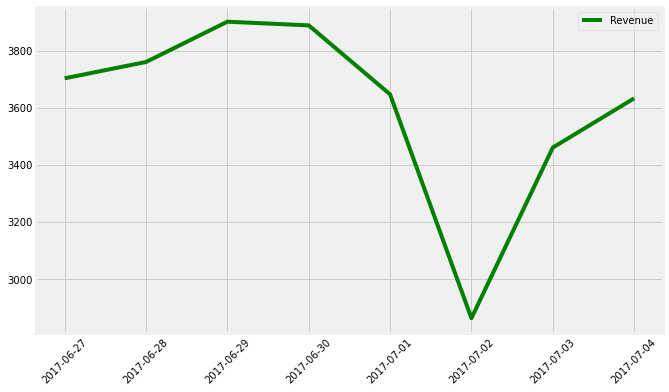

----------------------------------------------------------------------
36 ] Monthly Graph from TUESDAY 2017-07-04 00:00:00 to TUESDAY 2017-07-11 00:00:00


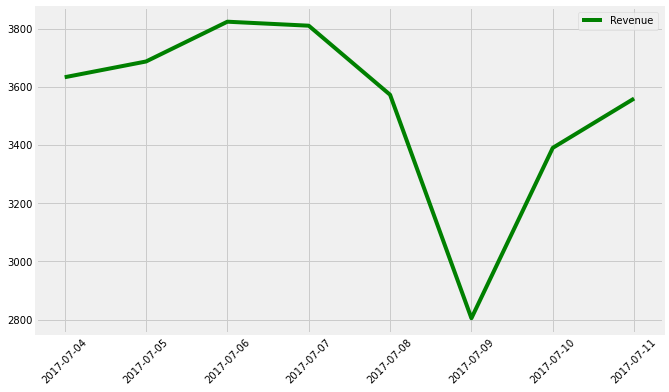

----------------------------------------------------------------------
37 ] Monthly Graph from TUESDAY 2017-07-11 00:00:00 to TUESDAY 2017-07-18 00:00:00


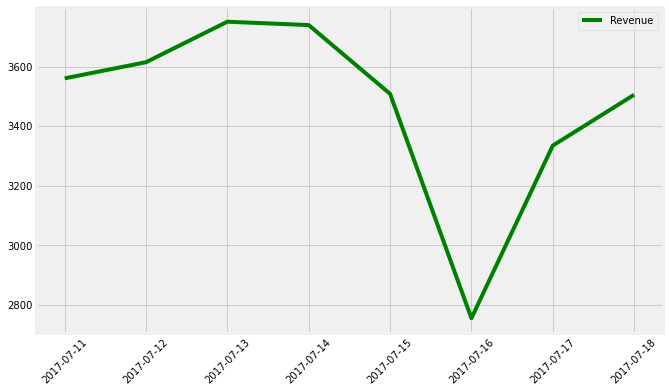

----------------------------------------------------------------------
38 ] Monthly Graph from TUESDAY 2017-07-18 00:00:00 to TUESDAY 2017-07-25 00:00:00


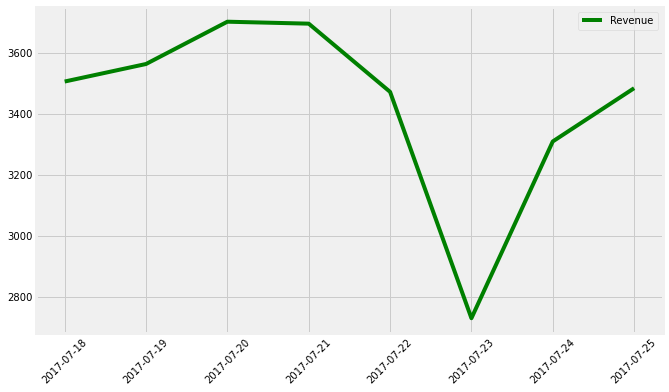

----------------------------------------------------------------------
39 ] Monthly Graph from TUESDAY 2017-07-25 00:00:00 to TUESDAY 2017-08-01 00:00:00


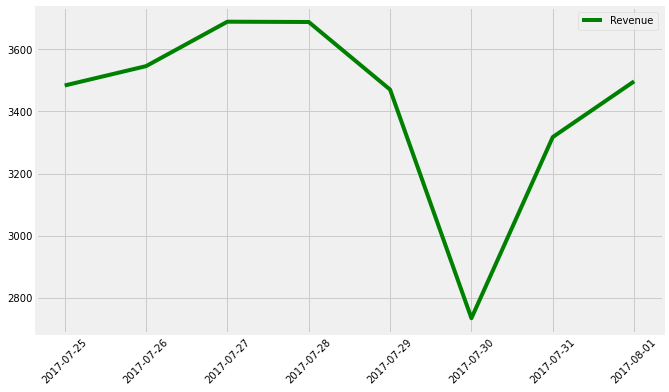

----------------------------------------------------------------------
40 ] Monthly Graph from TUESDAY 2017-08-01 00:00:00 to TUESDAY 2017-08-08 00:00:00


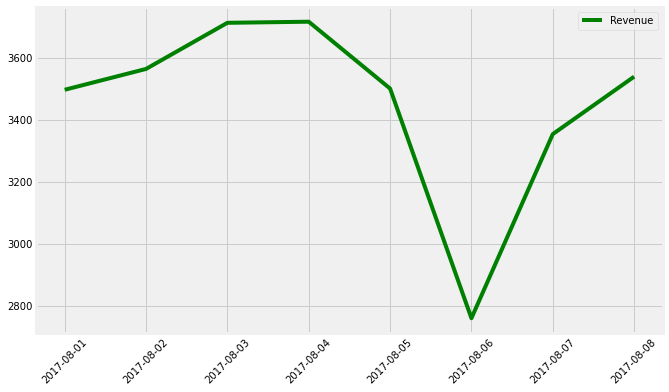

----------------------------------------------------------------------
41 ] Monthly Graph from TUESDAY 2017-08-08 00:00:00 to TUESDAY 2017-08-15 00:00:00


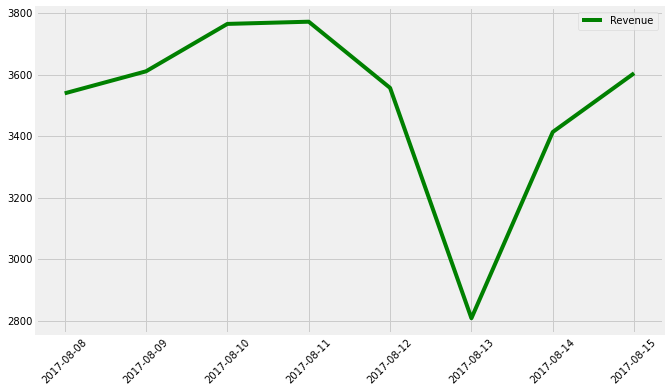

----------------------------------------------------------------------
42 ] Monthly Graph from TUESDAY 2017-08-15 00:00:00 to TUESDAY 2017-08-22 00:00:00


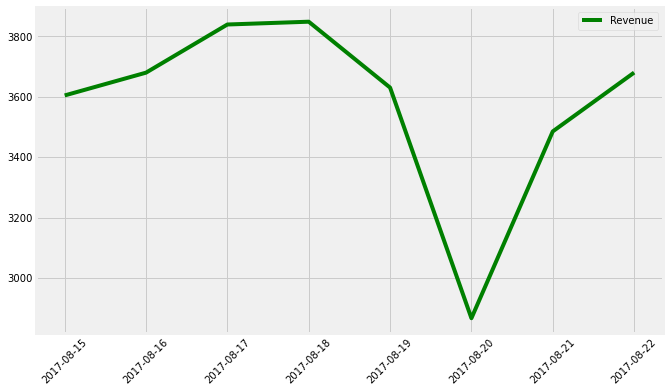

----------------------------------------------------------------------
43 ] Monthly Graph from TUESDAY 2017-08-22 00:00:00 to TUESDAY 2017-08-29 00:00:00


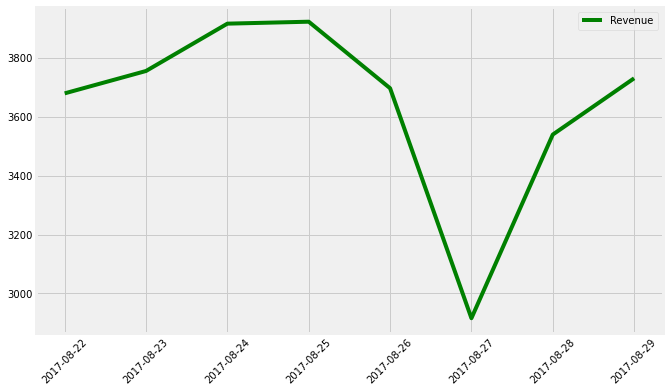

----------------------------------------------------------------------
44 ] Monthly Graph from TUESDAY 2017-08-29 00:00:00 to TUESDAY 2017-09-05 00:00:00


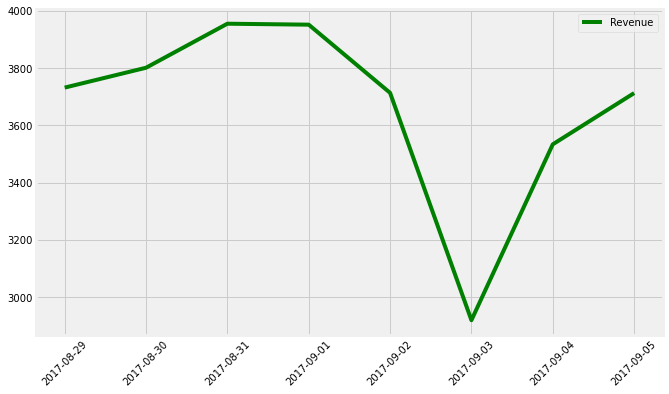

----------------------------------------------------------------------
45 ] Monthly Graph from TUESDAY 2017-09-05 00:00:00 to TUESDAY 2017-09-12 00:00:00


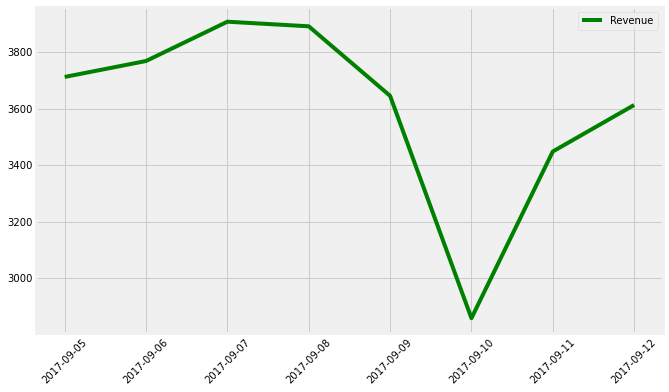

----------------------------------------------------------------------
46 ] Monthly Graph from TUESDAY 2017-09-12 00:00:00 to TUESDAY 2017-09-19 00:00:00


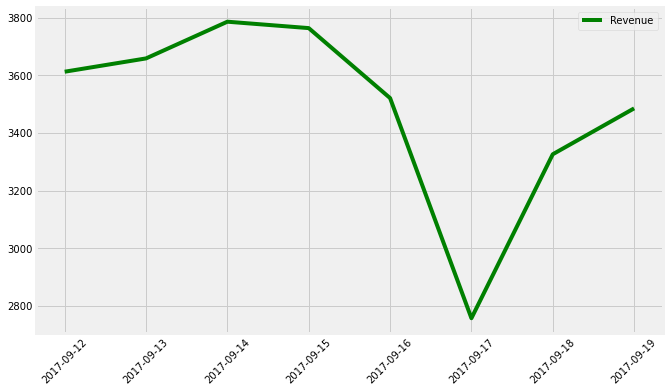

----------------------------------------------------------------------
47 ] Monthly Graph from TUESDAY 2017-09-19 00:00:00 to TUESDAY 2017-09-26 00:00:00


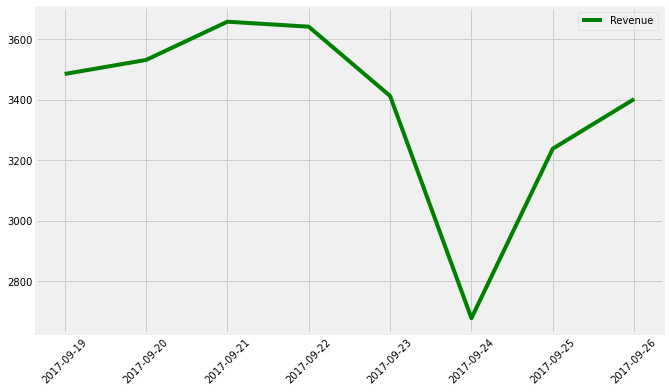

----------------------------------------------------------------------
48 ] Monthly Graph from TUESDAY 2017-09-26 00:00:00 to TUESDAY 2017-10-03 00:00:00


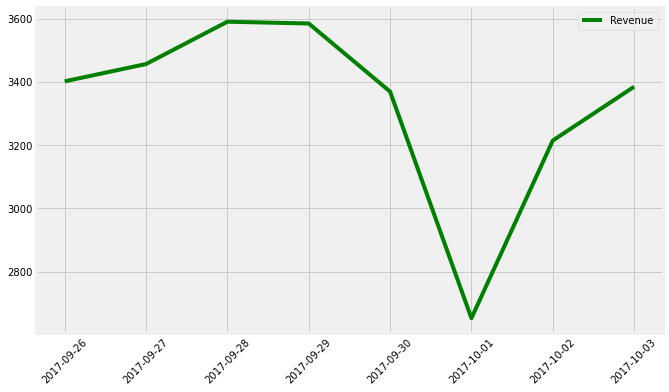

----------------------------------------------------------------------
49 ] Monthly Graph from TUESDAY 2017-10-03 00:00:00 to TUESDAY 2017-10-10 00:00:00


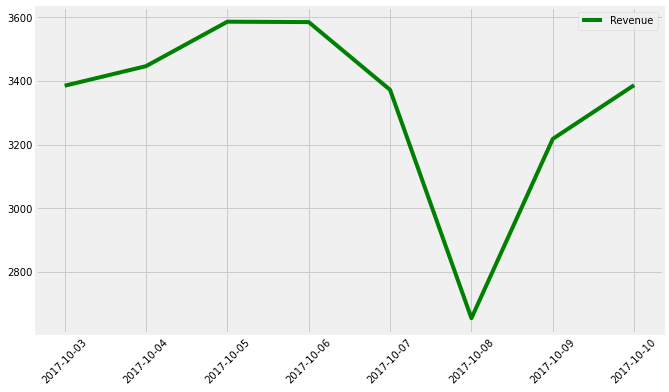

----------------------------------------------------------------------
50 ] Monthly Graph from TUESDAY 2017-10-10 00:00:00 to TUESDAY 2017-10-17 00:00:00


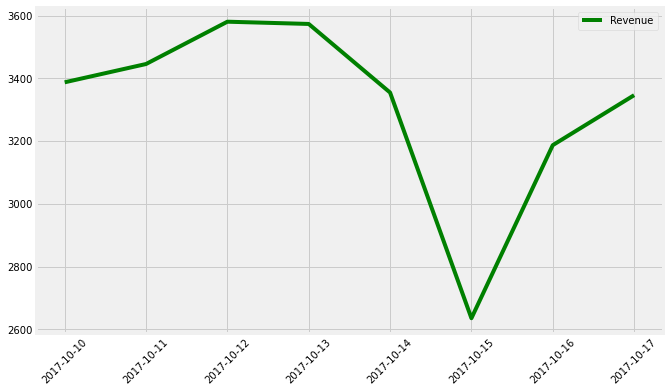

----------------------------------------------------------------------
51 ] Monthly Graph from TUESDAY 2017-10-17 00:00:00 to TUESDAY 2017-10-24 00:00:00


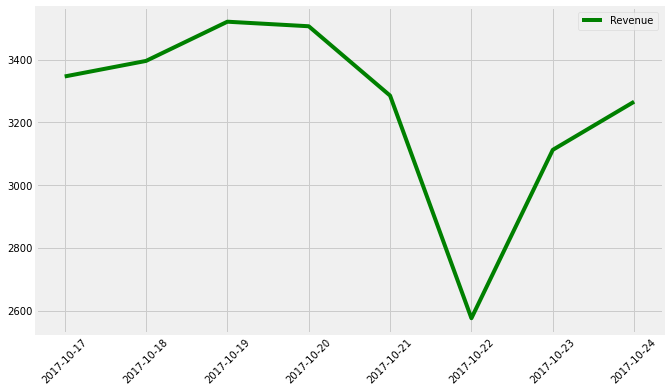

----------------------------------------------------------------------
52 ] Monthly Graph from TUESDAY 2017-10-24 00:00:00 to TUESDAY 2017-10-31 00:00:00


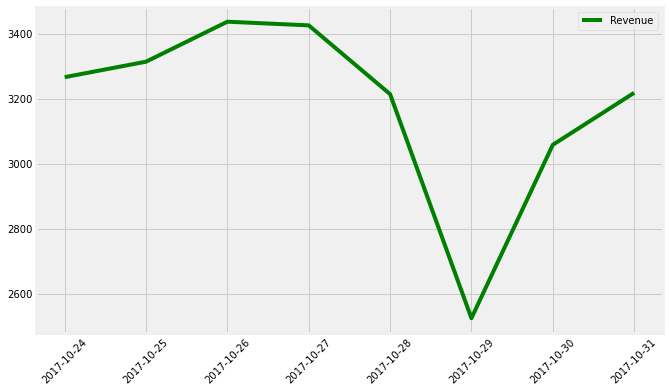

----------------------------------------------------------------------


In [69]:
# Weekly analysis
interval_W = pd.date_range('2016-11-01', '2017-11-01', freq='7D')
print(interval_W,'\n')

for i in range(len(interval_W)-1):
    print(i+1,'] Monthly Graph from TUESDAY',interval_W[i],'to TUESDAY', interval_W[i+1])
    plt.figure(figsize=(10,6))
    plt.plot(forecating_till_Oct2017.yhat[interval_W[i]:interval_W[i+1]], 'g-')
    plt.legend(['Revenue'])
    plt.xticks(rotation=45)
    plt.show()
    print('-'*70)

From above all graphs, we came to know that our forecasting has some fixed pattern which weekly seasonality, it is showing a drop in revenue for every sundays and high revenue for thursdays and fridays, which more clear from below garph:

Text(0.5, 1.0, 'Forecasted Weekly graph from Sunday to Sunday')

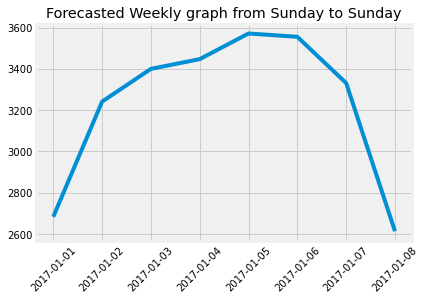

In [71]:
plt.plot(forecating_till_Oct2017.yhat['2017-01-01':'2017-01-8'])
plt.xticks(rotation=45)
plt.title('Forecasted Weekly graph from Sunday to Sunday')

In future none-the-less same trend can be seen, drop on sundays and high revenue on thursdays and fridays instead of fridays and saturdays, repeating itself weekly but overall there would be a drop in revenue from September 2017 onwards.

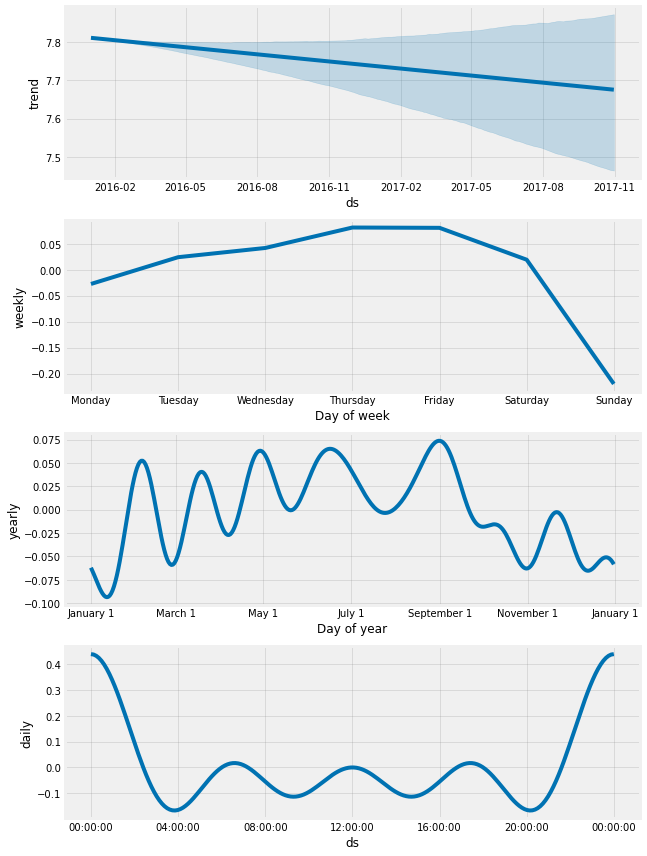

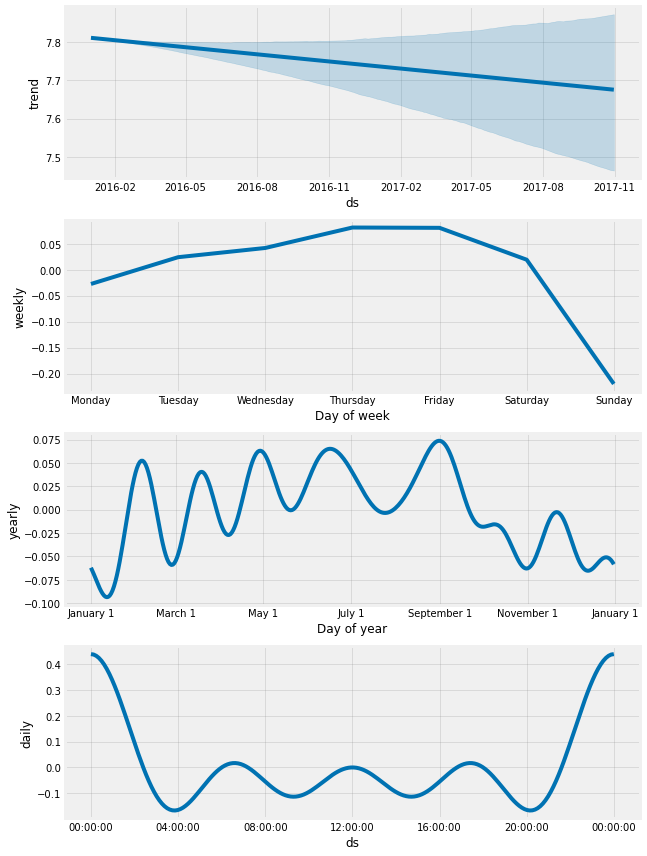

In [47]:
model_log.plot_components(new_forecast_log, weekly_start=1)

In [51]:
monthly_mean = pd.DataFrame(forecating_till_Oct2017['yhat'].resample('M').mean())
monthly_mean

,yhat
ds,
2016-11-30,3521.024745
2016-12-31,3411.428495
2017-01-31,3347.268761
2017-02-28,3548.548457
2017-03-31,3566.042860
2017-04-30,3523.152879
2017-05-31,3554.141083
2017-06-30,3668.404196
2017-07-31,3447.192771


In [86]:
monthly_sum = pd.DataFrame(forecating_till_Oct2017['yhat'].resample('M').sum())
monthly_sum.columns = ['Monthly Sum of Revenue']
monthly_sum

,Monthly Sum of Revenue
ds,
2016-11-30,105630.742338
2016-12-31,105754.283343
2017-01-31,103765.331606
2017-02-28,99359.356801
2017-03-31,110547.328654
2017-04-30,105694.586370
2017-05-31,110178.373563
2017-06-30,110052.125873
2017-07-31,106862.975900


In [88]:
weekly_sum = pd.DataFrame(forecating_till_Oct2017['yhat'].resample('W').sum())
weekly_sum.columns = ['Weekly Sum of Revenue']
weekly_sum

,Weekly Sum of Revenue
ds,
2016-11-06,20566.294512
2016-11-13,24386.425327
2016-11-20,25007.890259
2016-11-27,25030.498731
2016-12-04,24386.757560
2016-12-11,23712.801168
2016-12-18,23550.651433
2016-12-25,23743.702015
2017-01-01,23682.945084
